In [1]:
import matplotlib.pyplot as plt
from matplotlib.ticker import (MultipleLocator, AutoMinorLocator)

from numpy import *
from qutip import *
from IPython.display import Image
from numpy.linalg import *
import multiprocessing as mp
import scipy.constants as sc
import time
import datetime
import os
import MyFunctions
from matplotlib import cm
from MyFunctions import ImportS2P, dBmtoV, dBmtoW
import matplotlib as mpl

plt.rcParams.update({
    "text.usetex": True,
    "font.family": "serif",
    "font.serif": ["Computer Modern Roman"],
})
#plt.rcParams['figure.dpi'] = 70

# (A) C_c = 40.38 fF

### (A.1) S-parameter


In [2]:
data_s21_40 = loadtxt(r'220927_S21_Cc40.txt')
data_s21_alpha = loadtxt(r'221230_S21_alpha.txt')
data_s21_beta = loadtxt(r'221230_S21_beta.txt')
data_s21_gamma = loadtxt(r'221230_S21_gamma.txt')
data_s21_artigo = loadtxt(r'S21parameter_cutoff5GHz.txt')

In [41]:
data1 = loadtxt(r'data1.dat')
data2 = loadtxt(r'data2.dat')
data3 = loadtxt(r'data3.dat')

ValueError: could not convert string to float: '1.8845539045046489+11.193110687473464*I'

In [34]:
DATA = 'data1.txt'

def get_data(fname=DATA):
    '''Read 2d array of z coordinates from file. Convert to float values
    and wrap in a numpy array.'''
    with open(fname) as f:
        data = [map(float, line.split()) for line in f]
    return array(data)

In [39]:
1.8845539045046489+11.193110687473464*1j

(1.8845539045046489+11.193110687473464j)

In [3]:
x_list_s2140 = data_s21_40[:,0]
y_list_s2140 = data_s21_40[:,1]

x_list_s21alpha = data_s21_alpha[:,0]
y_list_s21alpha = data_s21_alpha[:,1]

x_list_s21beta = data_s21_beta[:,0]
y_list_s21beta = data_s21_beta[:,1]

x_list_s21gamma = data_s21_gamma[:,0]
y_list_s21gamma = data_s21_gamma[:,1]

x_list_s21artigo = data_s21_artigo[:,0]
y_list_s21artigo = data_s21_artigo[:,1]

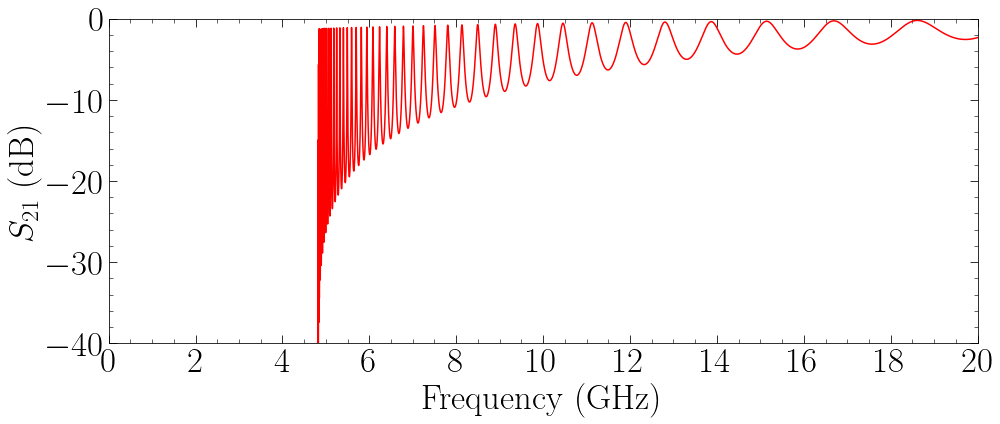

In [22]:
fig, axes = plt.subplots(1, 1, figsize=(14, 6)) #14,7

axes.plot(x_list_s21artigo, y_list_s21artigo, color='red', linestyle='-', label=r'Delta', lw=1.5)

axes.set_xlabel(r'Frequency (GHz)', rotation=0, fontsize=35)
axes.set_ylabel(
    r'$S_{21}$ (dB)', rotation=90, fontsize=35)

axes.tick_params(axis='both', which='major', length = 8, direction='in', labelsize=35)
axes.tick_params(axis='both', which='minor', length = 4, direction='in', labelsize=35)
#axes.yaxis.tick_right()
axes.xaxis.set_ticks_position('both')
axes.yaxis.set_ticks_position('both')
#axes.legend(loc=2, fontsize=23, frameon=False)

#axes.set_xlim(0, 5778.04)
axes.set_ylim(-40, 0)
axes.set_xlim(0, 20)

start, end = axes.get_ylim()
axes.xaxis.set_ticks(arange(0, 20+1, 2))
axes.yaxis.set_ticks(arange(start, end+1, 10))

axes.xaxis.set_minor_locator(AutoMinorLocator())
axes.yaxis.set_minor_locator(AutoMinorLocator())

axes.set_ylim(-40, 0)
axes.set_xlim(0, 20)

#axes.text(0.5, -25, r"Forbidden band", color='black', fontsize=35, rotation=-45)
#axes.text(12, -25, r"LHTL band", color='red', fontsize=35, rotation=-45)

plt.margins(x=0.01, y=0.01)
plt.tight_layout()
plt.savefig('S21_simulacaoCST_artigo.png')
plt.savefig('S21_simulacaoCST_artigo.pdf')
plt.show()

D:\Users\asantana\AppData\Local\Temp\3\ipykernel_38552\544249334.py:49: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


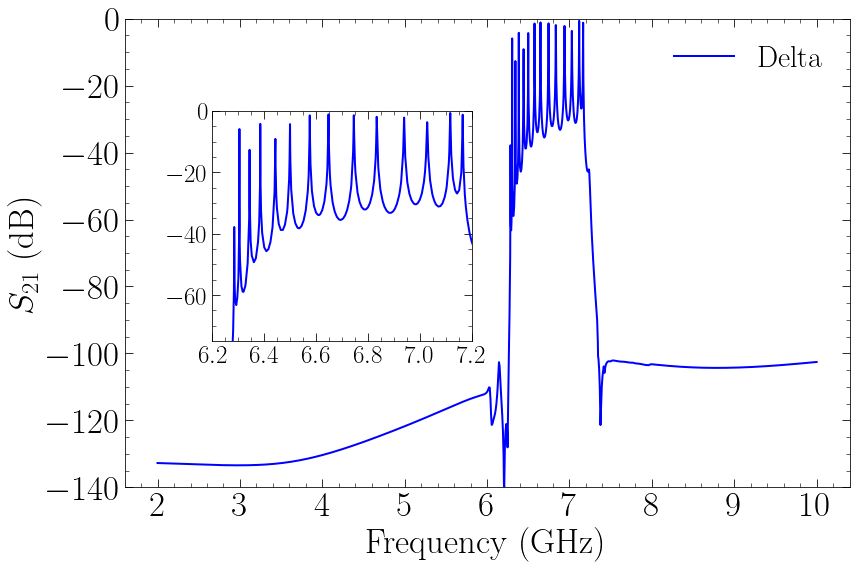

In [240]:
fig, axes = plt.subplots(1, 1, figsize=(12, 8)) #14,7

axes.plot(x_list_s2140, y_list_s2140, color='blue',
          linestyle='-', label=r'Delta', lw=2.0)

axes.set_xlabel(r'Frequency (GHz)', rotation=0, fontsize=35)
axes.set_ylabel(
    r'$S_{21}$ (dB)', rotation=90, fontsize=35)

axes.tick_params(axis='both', which='major', length = 8, direction='in', labelsize=35)
axes.tick_params(axis='both', which='minor', length = 4, direction='in', labelsize=35)
#axes.yaxis.tick_right()
axes.xaxis.set_ticks_position('both')
axes.yaxis.set_ticks_position('both')
axes.legend(loc=2, fontsize=23, frameon=False)

#axes.set_xlim(0, 5778.04)
axes.set_ylim(-140, 0)

start, end = axes.get_ylim()
axes.xaxis.set_ticks(arange(2, 10+1, 1))
axes.yaxis.set_ticks(arange(start, end+1, 20))

axes.xaxis.set_minor_locator(AutoMinorLocator())
axes.yaxis.set_minor_locator(AutoMinorLocator())

#axes.text(-900, 0.14, r"$n_2 = 1$", color='red', fontsize=25, rotation=-45)
#axes.text(-410, 0.27, r"$n_2 = 0$", color='red', fontsize=25, rotation=-45)

left, bottom, width, height = [0.25, 0.4, 0.3, 0.4] #0.2 0.4 0.3 0.4
axes2 = fig.add_axes([left, bottom, width, height])
axes2.plot(x_list_s2140, y_list_s2140, color='blue',
          linestyle='-', label=r'CST MWS', lw=2.0)
axes2.set_xlim(6.2, 7.2)
axes2.set_ylim(-75, 0)
axes2.tick_params(axis='both', which='major', length = 8, direction='in', labelsize=25)
axes2.tick_params(axis='both', which='minor', length = 4, direction='in', labelsize=25)


axes2.xaxis.set_ticks(arange(6.2, 7.3, 0.2))
axes2.xaxis.set_minor_locator(AutoMinorLocator())
axes2.yaxis.set_minor_locator(AutoMinorLocator())
axes2.xaxis.set_ticks_position('both')
axes2.yaxis.set_ticks_position('both')

axes.legend(loc=1, fontsize=30, frameon=False)

plt.margins(x=0.01, y=0.01)
plt.tight_layout()
plt.savefig('S21_simulacaoCST_delta40.png')
plt.savefig('S21_simulacaoCST_delta40.pdf')
plt.show()

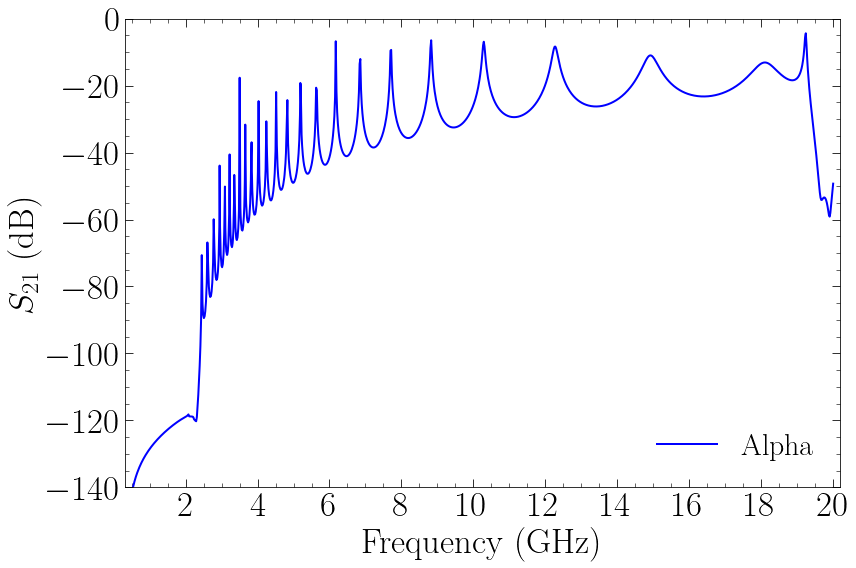

In [257]:
fig, axes = plt.subplots(1, 1, figsize=(12, 8)) #14,7

axes.plot(x_list_s21alpha, y_list_s21alpha, color='blue',
          linestyle='-', label=r'Alpha', lw=2.0)

axes.set_xlabel(r'Frequency (GHz)', rotation=0, fontsize=35)
axes.set_ylabel(
    r'$S_{21}$ (dB)', rotation=90, fontsize=35)

axes.tick_params(axis='both', which='major', length = 8, direction='in', labelsize=35)
axes.tick_params(axis='both', which='minor', length = 4, direction='in', labelsize=35)
#axes.yaxis.tick_right()
axes.xaxis.set_ticks_position('both')
axes.yaxis.set_ticks_position('both')
axes.legend(loc=2, fontsize=23, frameon=False)

#axes.set_xlim(0, 5778.04)
axes.set_ylim(-140, 0)

start, end = axes.get_ylim()
axes.xaxis.set_ticks(arange(2, 20+1, 2))
axes.yaxis.set_ticks(arange(start, end+1, 20))

axes.xaxis.set_minor_locator(AutoMinorLocator())
axes.yaxis.set_minor_locator(AutoMinorLocator())

#axes.text(-900, 0.14, r"$n_2 = 1$", color='red', fontsize=25, rotation=-45)
#axes.text(-410, 0.27, r"$n_2 = 0$", color='red', fontsize=25, rotation=-45)

#left, bottom, width, height = [0.25, 0.4, 0.3, 0.4] #0.2 0.4 0.3 0.4
#axes2 = fig.add_axes([left, bottom, width, height])
#axes2.plot(x_list_s21alpha, y_list_s21alpha, color='blue',
#          linestyle='-', label=r'CST MWS', lw=2.0)
#axes2.set_xlim(6.2, 7.2)
#axes2.set_ylim(-75, 0)
#axes2.tick_params(axis='both', which='major', length = 8, direction='in', labelsize=25)
#axes2.tick_params(axis='both', which='minor', length = 4, direction='in', labelsize=25)

#axes2.xaxis.set_ticks(arange(6.2, 7.3, 0.2))
#axes2.xaxis.set_minor_locator(AutoMinorLocator())
#axes2.yaxis.set_minor_locator(AutoMinorLocator())
#axes2.xaxis.set_ticks_position('both')
#axes2.yaxis.set_ticks_position('both')

axes.legend(loc=0, fontsize=30, frameon=False)

plt.margins(x=0.01, y=0.01)
plt.tight_layout()
plt.savefig('S21_simulacaoCST_alpha.png')
plt.savefig('S21_simulacaoCST_alpha.pdf')
plt.show()

D:\Users\asantana\AppData\Local\Temp\3\ipykernel_38552\2065645035.py:49: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


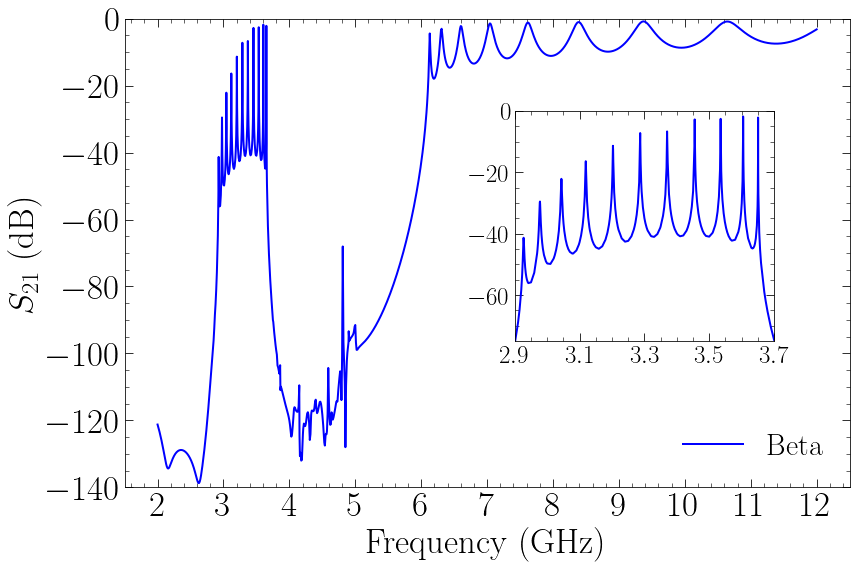

In [250]:
fig, axes = plt.subplots(1, 1, figsize=(12, 8)) #14,7

axes.plot(x_list_s21beta, y_list_s21beta, color='blue',
          linestyle='-', label=r'Beta', lw=2.0)

axes.set_xlabel(r'Frequency (GHz)', rotation=0, fontsize=35)
axes.set_ylabel(
    r'$S_{21}$ (dB)', rotation=90, fontsize=35)

axes.tick_params(axis='both', which='major', length = 8, direction='in', labelsize=35)
axes.tick_params(axis='both', which='minor', length = 4, direction='in', labelsize=35)
#axes.yaxis.tick_right()
axes.xaxis.set_ticks_position('both')
axes.yaxis.set_ticks_position('both')
axes.legend(loc=2, fontsize=23, frameon=False)

#axes.set_xlim(0, 5778.04)
axes.set_ylim(-140, 0)

start, end = axes.get_ylim()
axes.xaxis.set_ticks(arange(2, 12+1, 1))
axes.yaxis.set_ticks(arange(start, end+1, 20))

axes.xaxis.set_minor_locator(AutoMinorLocator())
axes.yaxis.set_minor_locator(AutoMinorLocator())

#axes.text(-900, 0.14, r"$n_2 = 1$", color='red', fontsize=25, rotation=-45)
#axes.text(-410, 0.27, r"$n_2 = 0$", color='red', fontsize=25, rotation=-45)

left, bottom, width, height = [0.6, 0.4, 0.3, 0.4] #0.2 0.4 0.3 0.4
axes2 = fig.add_axes([left, bottom, width, height])
axes2.plot(x_list_s21beta, y_list_s21beta, color='blue',
          linestyle='-', label=r'CST MWS', lw=2.0)
axes2.set_xlim(2.9, 3.7)
axes2.set_ylim(-75, 0)
axes2.tick_params(axis='both', which='major', length = 8, direction='in', labelsize=25)
axes2.tick_params(axis='both', which='minor', length = 4, direction='in', labelsize=25)


axes2.xaxis.set_ticks(arange(2.9, 3.7, 0.2))
axes2.xaxis.set_minor_locator(AutoMinorLocator())
axes2.yaxis.set_minor_locator(AutoMinorLocator())
axes2.xaxis.set_ticks_position('both')
axes2.yaxis.set_ticks_position('both')

axes.legend(loc=0, fontsize=30, frameon=False)

plt.margins(x=0.01, y=0.01)
plt.tight_layout()
plt.savefig('S21_simulacaoCST_beta.png')
plt.savefig('S21_simulacaoCST_beta.pdf')
plt.show()

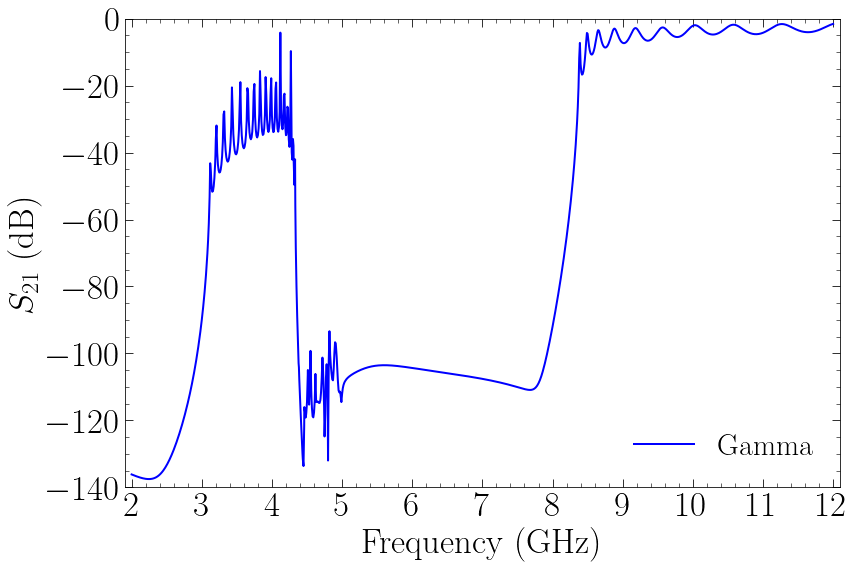

In [84]:
fig, axes = plt.subplots(1, 1, figsize=(12, 8)) #14,7

axes.plot(x_list_s21gamma, y_list_s21gamma, color='blue',
          linestyle='-', label=r'Gamma', lw=2.0)

axes.set_xlabel(r'Frequency (GHz)', rotation=0, fontsize=35)
axes.set_ylabel(
    r'$S_{21}$ (dB)', rotation=90, fontsize=35)

axes.tick_params(axis='both', which='major', length = 8, direction='in', labelsize=35)
axes.tick_params(axis='both', which='minor', length = 4, direction='in', labelsize=35)
#axes.yaxis.tick_right()
axes.xaxis.set_ticks_position('both')
axes.yaxis.set_ticks_position('both')
axes.legend(loc=2, fontsize=23, frameon=False)

#axes.set_xlim(0, 5778.04)
axes.set_ylim(-140, 0)

start, end = axes.get_ylim()
axes.xaxis.set_ticks(arange(2, 12+1, 1))
axes.yaxis.set_ticks(arange(start, end+1, 20))

axes.xaxis.set_minor_locator(AutoMinorLocator())
axes.yaxis.set_minor_locator(AutoMinorLocator())

#axes.text(-900, 0.14, r"$n_2 = 1$", color='red', fontsize=25, rotation=-45)
#axes.text(-410, 0.27, r"$n_2 = 0$", color='red', fontsize=25, rotation=-45)

#left, bottom, width, height = [0.6, 0.4, 0.3, 0.4] #0.2 0.4 0.3 0.4
#axes2 = fig.add_axes([left, bottom, width, height])
#axes2.plot(x_list_s21gamma, y_list_s21gamma, color='blue',
#          linestyle='-', label=r'CST MWS', lw=2.0)
#axes2.set_xlim(2.9, 3.7)
#axes2.set_ylim(-75, 0)
#axes2.tick_params(axis='both', which='major', length = 8, direction='in', labelsize=25)
#axes2.tick_params(axis='both', which='minor', length = 4, direction='in', labelsize=25)


#axes2.xaxis.set_ticks(arange(2.9, 3.7, 0.2))
#axes2.xaxis.set_minor_locator(AutoMinorLocator())
#axes2.yaxis.set_minor_locator(AutoMinorLocator())
#axes2.xaxis.set_ticks_position('both')
#axes2.yaxis.set_ticks_position('both')

axes.legend(loc=0, fontsize=30, frameon=False)

plt.margins(x=0.01, y=0.01)
plt.tight_layout()
plt.savefig('S21_simulacaoCST_gamma.png')
plt.savefig('S21_simulacaoCST_gamma.pdf')
plt.show()

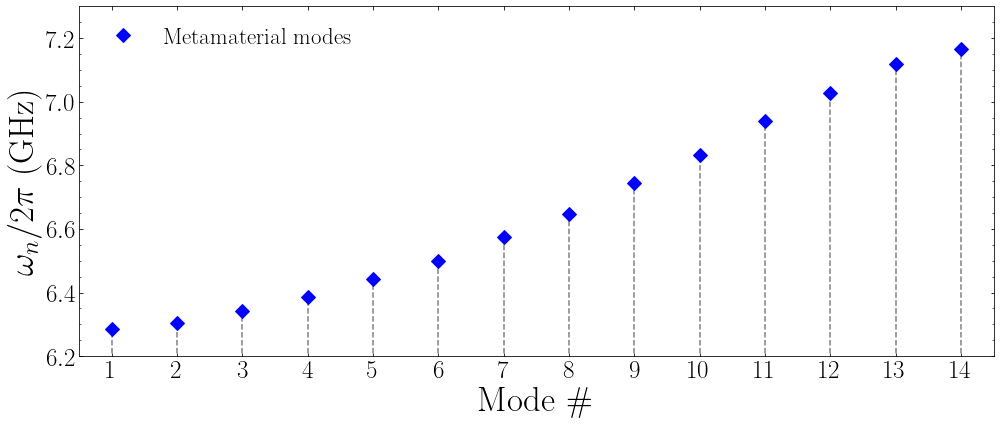

In [109]:
fig, axes = plt.subplots(1, 1, figsize=(14, 6))   # 9, 5

x_list = arange(1,15,1)

# CST Results
y_list = [  6.2842,
            6.3043,
            6.3434,
            6.3847,
            6.4430,
            6.4995,
            6.5756,
            6.6480,
            6.7456,
            6.8339,
            6.9396,
            7.0286,
            7.1176,
            7.1657]

#x_list2 = [x_list[-k] for k in range(1,len(y_list))]

#axes.axhline(y=(0.5e-9)/(2* pi* sqrt(L*C)), color='black', linestyle=':', lw=2.)
#axes.axhline(y=3.3, color='black', linestyle=':', lw=2.)
plt.stem(x_list,y_list,linefmt=('--','grey'))


axes.plot(x_list, y_list, 'D', label='Metamaterial modes',
          markersize=10, color='blue', lw=3.5)

axes.set_xlabel(r'Mode $\#$', rotation=0, fontsize=35)
axes.set_ylabel(r'$\omega_n/2\pi$ (GHz)', rotation=90, fontsize=35)
axes.set_xlim(0.5, 14.5)
axes.set_ylim(6.2, 7.3)
axes.tick_params(axis='both', which='major', direction='in', labelsize=25)
axes.tick_params(axis='both', which='minor', direction='in', labelsize=25)
# axes.yaxis.tick_right()
axes.xaxis.set_ticks_position('both')
axes.yaxis.set_ticks_position('both')
# axes.legend(loc=2,fontsize=23,frameon=False)
#start, end = axes.get_xlim()
axes.xaxis.set_ticks(arange(1, 15, 1))
#axes.yaxis.set_ticks(arange(1, 19, 2))
#axes.xaxis.set_minor_locator(AutoMinorLocator(0))
axes.yaxis.set_minor_locator(AutoMinorLocator(4))
#axes.text(-900, 0.14, r"$n_2 = 1$",color='red', fontsize=25, rotation=-45)
#axes.text(1.02, 4., r'$\omega_\mathrm{IR}/2\pi$',
#          color='blue', fontsize=25, rotation=0)

axes.legend(fontsize=23, frameon=False)
plt.margins(x=0.01, y=0.01)
plt.tight_layout()
plt.grid(False)

#plt.savefig('dispersionLHTL.pdf')
plt.show()

In [85]:
import pandas
df = pandas.read_csv(r'November 18\221118_S21_0to12ghz_N2000_IFBWauto.csv')
print(df)

x_list = df.values[:,1]
y1_list = df.values[:,2]
y2_list = df.values[:,3]


      Unnamed: 0  Frequencies (GHz)  Magnitude (dB)        Phase
0              0           0.517842      -67.892697    -0.986374
1              1           0.523586      -65.377349     1.351385
2              2           0.529330      -65.306765     4.202430
3              3           0.535074      -64.735243     1.182525
4              4           0.540817      -57.236598     4.164448
...          ...                ...             ...          ...
1995        1995          11.977024      -72.422405 -2289.159115
1996        1996          11.982768      -74.221241 -2292.168958
1997        1997          11.988512      -69.456485 -2293.254605
1998        1998          11.994256      -63.058429 -2290.853639
1999        1999          12.000000      -59.849266 -2293.880710

[2000 rows x 4 columns]


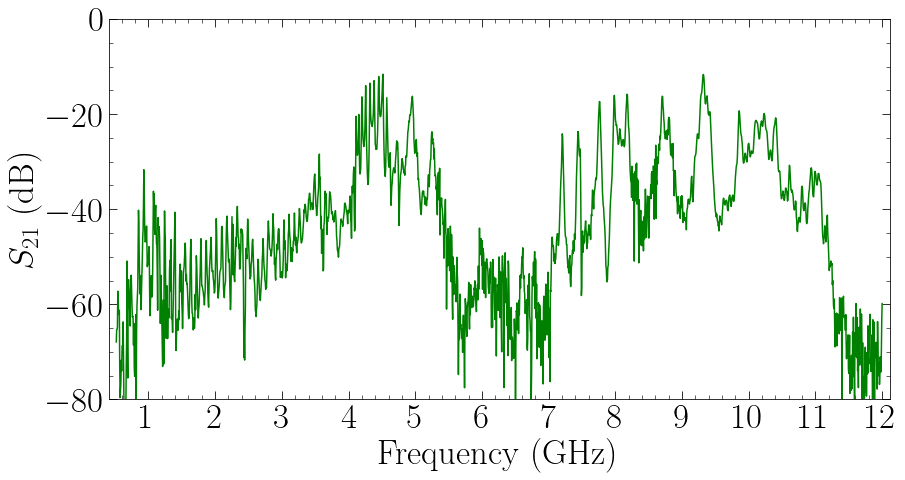

In [12]:
fig, axes = plt.subplots(1, 1, figsize=(14, 7))

axes.plot(x_list, y1_list, color='Green',
          linestyle='-', label=r'Experimental', lw=1.5)

axes.set_xlabel(r'Frequency (GHz)', rotation=0, fontsize=35)
axes.set_ylabel(
    r'$S_{21}$ (dB)', rotation=90, fontsize=35)

axes.tick_params(axis='both', which='major', length = 8, direction='in', labelsize=35)
axes.tick_params(axis='both', which='minor', length = 4, direction='in', labelsize=35)
#axes.yaxis.tick_right()
axes.xaxis.set_ticks_position('both')
axes.yaxis.set_ticks_position('both')
#axes.legend(loc=2, fontsize=23, frameon=False)

#axes.set_xlim(0, 5778.04)
axes.set_ylim(-80, 0)

start, end = axes.get_ylim()

axes.yaxis.set_ticks(arange(start, end+1, 20))
axes.xaxis.set_ticks(arange(0, 13, 1))

axes.xaxis.set_minor_locator(AutoMinorLocator())
axes.yaxis.set_minor_locator(AutoMinorLocator())

#axes.text(-900, 0.14, r"$n_2 = 1$", color='red', fontsize=25, rotation=-45)
#axes.text(-410, 0.27, r"$n_2 = 0$", color='red', fontsize=25, rotation=-45)

#axes.legend(loc=1, fontsize=23, frameon=False)

plt.margins(x=0.01, y=0.01)
#plt.tight_layout()
plt.savefig('S21_medida.png')
plt.savefig('S21_medida.pdf')
plt.show()

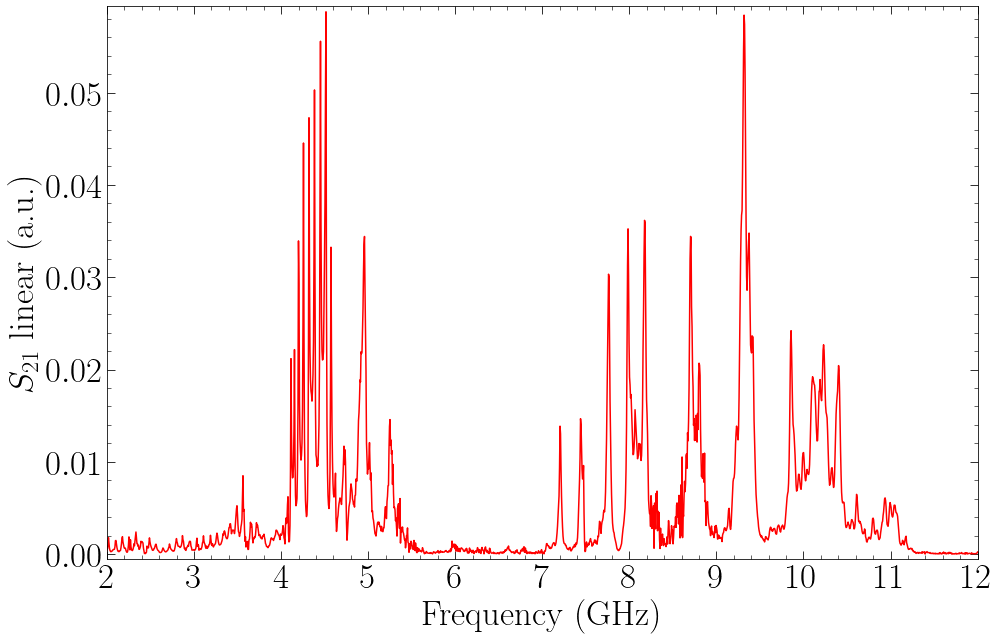

In [65]:
fig, axes = plt.subplots(1, 1, figsize=(14, 9))

axes.plot(x_list, dBmtoV(y1_list), color='Red',
          linestyle='-', label=r'Experimental', lw=1.5)

axes.set_xlabel(r'Frequency (GHz)', rotation=0, fontsize=35)
axes.set_ylabel(
    r'$S_{21}$ linear (a.u.)', rotation=90, fontsize=35)

axes.tick_params(axis='both', which='major', length = 8, direction='in', labelsize=35)
axes.tick_params(axis='both', which='minor', length = 4, direction='in', labelsize=35)
#axes.yaxis.tick_right()
axes.xaxis.set_ticks_position('both')
axes.yaxis.set_ticks_position('both')
#axes.legend(loc=2, fontsize=23, frameon=False)

#axes.set_ylim(-80, 0)

axes.xaxis.set_ticks(arange(0, 13, 1))

axes.set_xlim(2, 12)
axes.xaxis.set_minor_locator(AutoMinorLocator())
axes.yaxis.set_minor_locator(AutoMinorLocator())

#axes.text(-900, 0.14, r"$n_2 = 1$", color='red', fontsize=25, rotation=-45)
#axes.text(-410, 0.27, r"$n_2 = 0$", color='red', fontsize=25, rotation=-45)

#axes.legend(loc=1, fontsize=23, frameon=False)

plt.margins(x=0.01, y=0.01)
plt.tight_layout()
plt.savefig('S21_medida_linear.png')
plt.savefig('S21_medida_linear.pdf')
plt.show()

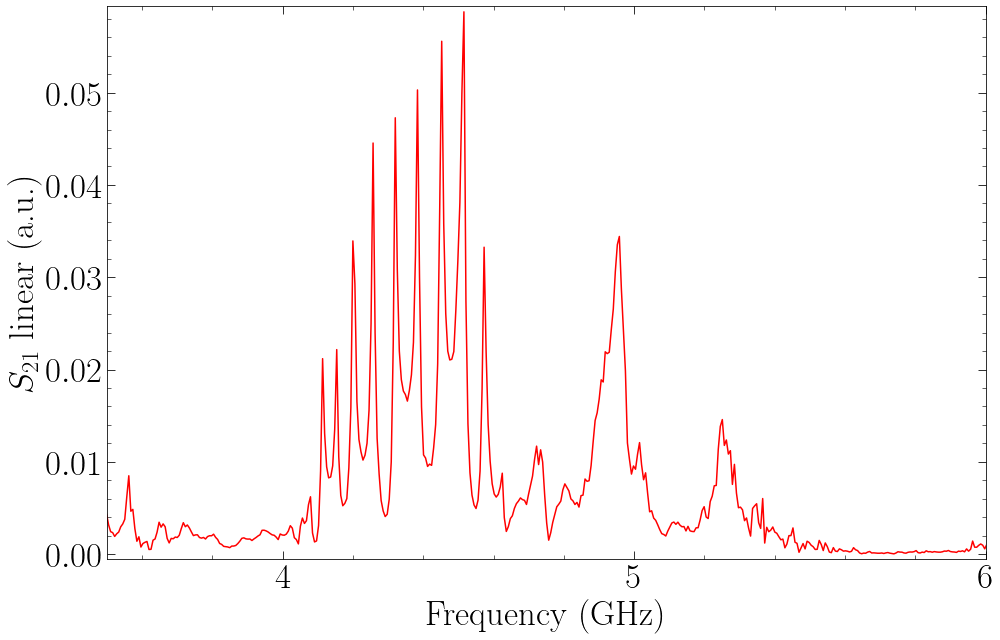

In [66]:
fig, axes = plt.subplots(1, 1, figsize=(14, 9))

axes.plot(x_list, dBmtoV(y1_list), color='Red',
          linestyle='-', label=r'Experimental', lw=1.5)

axes.set_xlabel(r'Frequency (GHz)', rotation=0, fontsize=35)
axes.set_ylabel(r'$S_{21}$ linear (a.u.)', rotation=90, fontsize=35)

axes.tick_params(axis='both', which='major', length = 8, direction='in', labelsize=35)
axes.tick_params(axis='both', which='minor', length = 4, direction='in', labelsize=35)
#axes.yaxis.tick_right()
axes.xaxis.set_ticks_position('both')
axes.yaxis.set_ticks_position('both')
#axes.legend(loc=2, fontsize=23, frameon=False)

#axes.set_ylim(-80, 0)

axes.xaxis.set_ticks(arange(0, 13, 1))

axes.set_xlim(3.5, 6)
axes.xaxis.set_minor_locator(AutoMinorLocator())
axes.yaxis.set_minor_locator(AutoMinorLocator())

#axes.text(-900, 0.14, r"$n_2 = 1$", color='red', fontsize=25, rotation=-45)
#axes.text(-410, 0.27, r"$n_2 = 0$", color='red', fontsize=25, rotation=-45)

#axes.legend(loc=1, fontsize=23, frameon=False)

plt.margins(x=0.01, y=0.01)
plt.tight_layout()
plt.savefig('S21_medida_linear2.png')
plt.savefig('S21_medida_linear2.pdf')
plt.show()

In [92]:
delta = 2.9272 - 4.0531940
delta

-1.1259940000000004

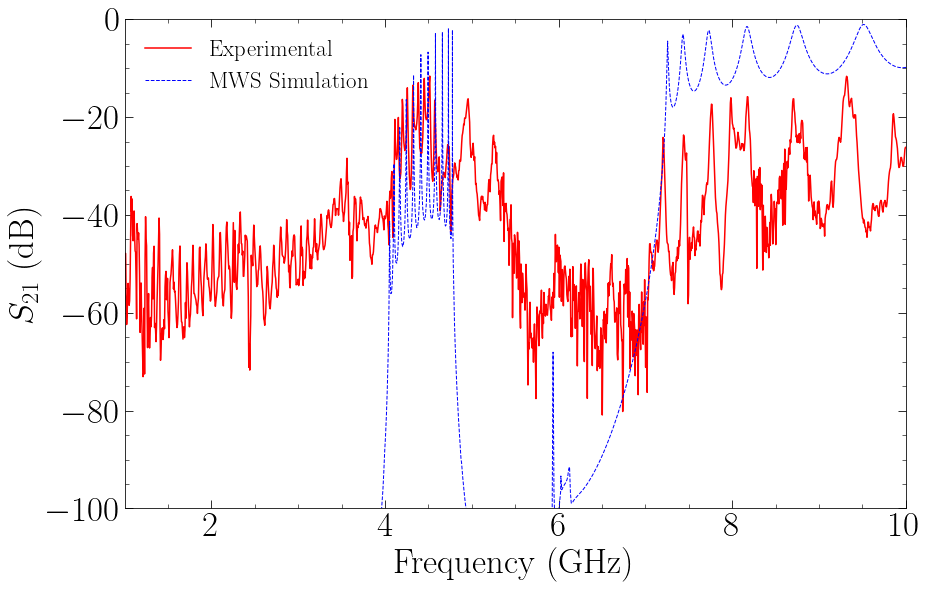

In [100]:
fig, axes = plt.subplots(1, 1, figsize=(14, 9))

axes.plot(x_list, y1_list, color='red',
          linestyle='-', label=r'Experimental', lw=1.5)

x_list_displaced = [k - delta for k in x_list_s21beta]

axes.plot(x_list_displaced, y_list_s21beta, color='blue',
          linestyle='--', label=r'MWS Simulation', lw=1.0)

axes.set_xlabel(r'Frequency (GHz)', rotation=0, fontsize=35)
axes.set_ylabel(
    r'$S_{21}$ (dB)', rotation=90, fontsize=35)

axes.tick_params(axis='both', which='major', length = 8, direction='in', labelsize=35)
axes.tick_params(axis='both', which='minor', length = 4, direction='in', labelsize=35)
#axes.yaxis.tick_right()
axes.xaxis.set_ticks_position('both')
axes.yaxis.set_ticks_position('both')

axes.set_xlim(1, 10)
axes.set_ylim(-100, 0)
start, end = axes.get_ylim()

axes.yaxis.set_ticks(arange(start, end+1, 20))
#axes.xaxis.set_ticks(arange(2, 11, 1))

axes.xaxis.set_minor_locator(AutoMinorLocator())
axes.yaxis.set_minor_locator(AutoMinorLocator())

#axes.text(-900, 0.14, r"$n_2 = 1$", color='red', fontsize=25, rotation=-45)
#axes.text(-410, 0.27, r"$n_2 = 0$", color='red', fontsize=25, rotation=-45)

axes.legend(loc=0, fontsize=23, frameon=False)



plt.margins(x=0.01, y=0.01)
#plt.tight_layout()
plt.savefig('S21_comparison_beta.png')
plt.savefig('S21_comparison_beta.pdf')
plt.show()

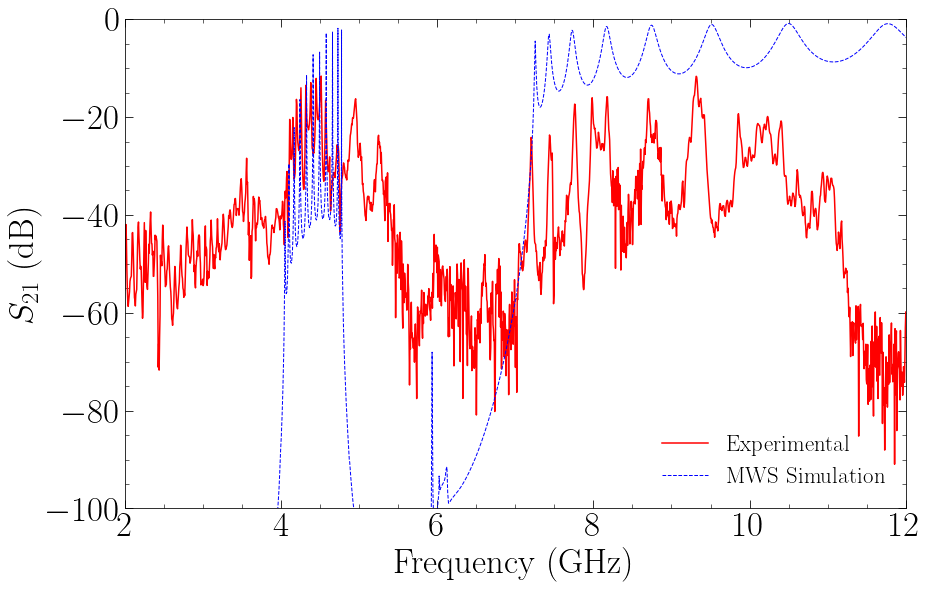

In [95]:
fig, axes = plt.subplots(1, 1, figsize=(14, 9))


axes.plot(x_list, y1_list, color='red',
          linestyle='-', label=r'Experimental', lw=1.5)

x_list_displaced = [k - delta for k in x_list_s21beta]

axes.plot(x_list_displaced, y_list_s21beta, color='blue',
          linestyle='--', label=r'MWS Simulation', lw=1.0)

axes.set_xlabel(r'Frequency (GHz)', rotation=0, fontsize=35)
axes.set_ylabel(
    r'$S_{21}$ (dB)', rotation=90, fontsize=35)

axes.tick_params(axis='both', which='major', length = 8, direction='in', labelsize=35)
axes.tick_params(axis='both', which='minor', length = 4, direction='in', labelsize=35)
#axes.yaxis.tick_right()
axes.xaxis.set_ticks_position('both')
axes.yaxis.set_ticks_position('both')

axes.set_xlim(2, 12)
axes.set_ylim(-100, 0)
start, end = axes.get_ylim()

axes.yaxis.set_ticks(arange(start, end+1, 20))
#axes.xaxis.set_ticks(arange(2, 11, 1))

axes.xaxis.set_minor_locator(AutoMinorLocator())
axes.yaxis.set_minor_locator(AutoMinorLocator())

#axes.text(-900, 0.14, r"$n_2 = 1$", color='red', fontsize=25, rotation=-45)
#axes.text(-410, 0.27, r"$n_2 = 0$", color='red', fontsize=25, rotation=-45)

axes.legend(loc=0, fontsize=23, frameon=False)



plt.margins(x=0.01, y=0.01)
#plt.tight_layout()
plt.savefig('S21_comparison_delta.png')
plt.savefig('S21_comparison_delta.pdf')
plt.show()

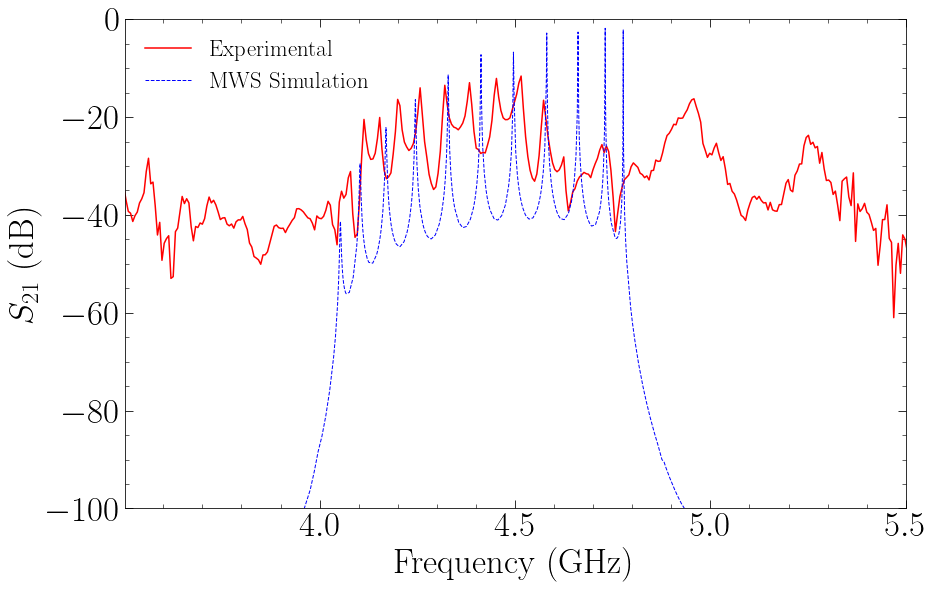

In [99]:
fig, axes = plt.subplots(1, 1, figsize=(14, 9))

axes.plot(x_list, y1_list, color='red',
          linestyle='-', label=r'Experimental', lw=1.5)

x_list_displaced = [k - delta for k in x_list_s21beta]

axes.plot(x_list_displaced, y_list_s21beta, color='blue',
          linestyle='--', label=r'MWS Simulation', lw=1.0)

axes.set_xlabel(r'Frequency (GHz)', rotation=0, fontsize=35)
axes.set_ylabel(
    r'$S_{21}$ (dB)', rotation=90, fontsize=35)

axes.tick_params(axis='both', which='major', length = 8, direction='in', labelsize=35)
axes.tick_params(axis='both', which='minor', length = 4, direction='in', labelsize=35)
#axes.yaxis.tick_right()
axes.xaxis.set_ticks_position('both')
axes.yaxis.set_ticks_position('both')

axes.set_xlim(3.501, 5.5)
axes.set_ylim(-100, 0)
start, end = axes.get_ylim()

axes.yaxis.set_ticks(arange(start, end+1, 20))
#axes.xaxis.set_ticks(arange(2, 11, 1))

axes.xaxis.set_minor_locator(AutoMinorLocator())
axes.yaxis.set_minor_locator(AutoMinorLocator())

#axes.text(-900, 0.14, r"$n_2 = 1$", color='red', fontsize=25, rotation=-45)
#axes.text(-410, 0.27, r"$n_2 = 0$", color='red', fontsize=25, rotation=-45)

axes.legend(loc=0, fontsize=23, frameon=False)



plt.margins(x=0.01, y=0.01)
#plt.tight_layout()
plt.savefig('S21_comparison_2_beta.png')
plt.savefig('S21_comparison_2_beta.pdf')
plt.show()

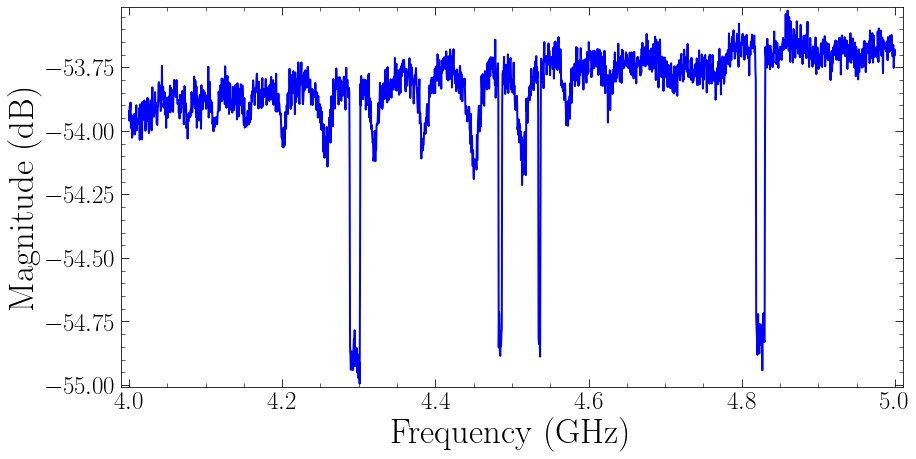

In [186]:
fig, axes = plt.subplots(1, 1, figsize=(14, 7))

axes.plot(x_list , y1_list, color='blue',
          linestyle='-', label=r'Experimental', lw=2.0)


axes.set_xlabel(r'Frequency (GHz)', rotation=0, fontsize=35)
axes.set_ylabel(
    r'Magnitude (dB)', rotation=90, fontsize=35)

axes.tick_params(axis='both', which='major', length = 8, direction='in', labelsize=25)
axes.tick_params(axis='both', which='minor', length = 4, direction='in', labelsize=25)

axes.xaxis.set_ticks_position('both')
axes.yaxis.set_ticks_position('both')

#axes.set_xlim(0, 5778.04)

#start, end = axes.get_ylim()
axes.xaxis.set_ticks(arange(4,5.1, 0.2))
#axes.yaxis.set_ticks(arange(start, end+1, ))

axes.xaxis.set_minor_locator(AutoMinorLocator())
axes.yaxis.set_minor_locator(AutoMinorLocator())

#axes.text(-900, 0.14, r"$n_2 = 1$", color='red', fontsize=25, rotation=-45)
#axes.text(-410, 0.27, r"$n_2 = 0$", color='red', fontsize=25, rotation=-45)

plt.margins(x=0.01, y=0.01)
#plt.tight_layout()
plt.savefig('twotone_sem_linhas.png')
plt.savefig('twotone_sem_linhas.pdf')
plt.show()

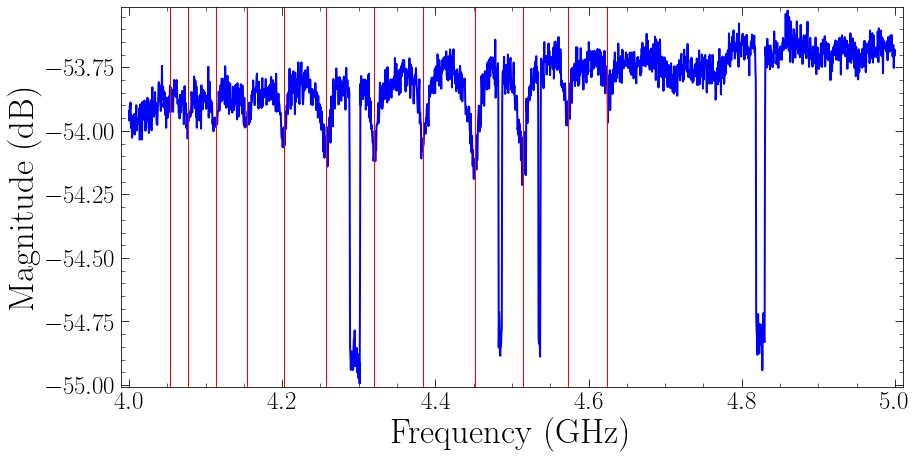

In [185]:
fig, axes = plt.subplots(1, 1, figsize=(14, 7))

axes.plot(x_list , y1_list, color='blue',
          linestyle='-', label=r'Experimental', lw=2.0)


axes.set_xlabel(r'Frequency (GHz)', rotation=0, fontsize=35)
axes.set_ylabel(
    r'Magnitude (dB)', rotation=90, fontsize=35)

axes.tick_params(axis='both', which='major', length = 8, direction='in', labelsize=25)
axes.tick_params(axis='both', which='minor', length = 4, direction='in', labelsize=25)

axes.xaxis.set_ticks_position('both')
axes.yaxis.set_ticks_position('both')

#axes.set_xlim(0, 5778.04)

#start, end = axes.get_ylim()
axes.xaxis.set_ticks(arange(4,5.1, 0.2))
#axes.yaxis.set_ticks(arange(start, end+1, ))

axes.xaxis.set_minor_locator(AutoMinorLocator())
axes.yaxis.set_minor_locator(AutoMinorLocator())


plt.axvline(x = 4.0531940, color='red', lw = 1.0)
plt.axvline(x = 4.0772553, color='red', lw = 1.0)
plt.axvline(x = 4.1132065, color='red', lw = 1.0)
plt.axvline(x = 4.1534130, color='red', lw = 1.0)
plt.axvline(x = 4.2019424, color='red', lw = 1.0)
plt.axvline(x = 4.2572928, color='red', lw = 1.0)
plt.axvline(x = 4.3204655, color='red', lw = 1.0)
plt.axvline(x = 4.3841389, color='red', lw = 1.0)
plt.axvline(x = 4.4514418, color='red', lw = 1.0)
plt.axvline(x = 4.5141369, color='red', lw = 1.0)
plt.axvline(x = 4.5732420, color='red', lw = 1.0)
plt.axvline(x = 4.6242745, color='red', lw = 1.0)

#axes.text(-900, 0.14, r"$n_2 = 1$", color='red', fontsize=25, rotation=-45)
#axes.text(-410, 0.27, r"$n_2 = 0$", color='red', fontsize=25, rotation=-45)

plt.margins(x=0.01, y=0.01)
#plt.tight_layout()
plt.savefig('twotone_com_linhas.pdf')
plt.savefig('twotone_com_linhas.png')
plt.show()

In [ ]:
fig, axes = plt.subplots(1, 1, figsize=(14, 7))

axes.plot(x_list_s2140, y_list_s2140, color='blue',
          linestyle='-', label=r'CST MWS', lw=2.0)

x_list 
y1_list

axes.plot(x_list , y1_list, color='red',
          linestyle='-', label=r'Experimental', lw=2.0)


axes.set_xlabel(r'Frequency (GHz)', rotation=0, fontsize=35)
axes.set_ylabel(
    r'$S_{21}$ (dB)', rotation=90, fontsize=35)

axes.tick_params(axis='both', which='major', length = 8, direction='in', labelsize=35)
axes.tick_params(axis='both', which='minor', length = 4, direction='in', labelsize=35)
#axes.yaxis.tick_right()
axes.xaxis.set_ticks_position('both')
axes.yaxis.set_ticks_position('both')
axes.legend(loc=2, fontsize=23, frameon=False)

#axes.set_xlim(0, 5778.04)
axes.set_ylim(-140, 0)

start, end = axes.get_ylim()
axes.xaxis.set_ticks(arange(2, 10+1, 1))
axes.yaxis.set_ticks(arange(start, end+1, 20))

axes.xaxis.set_minor_locator(AutoMinorLocator())
axes.yaxis.set_minor_locator(AutoMinorLocator())

#axes.text(-900, 0.14, r"$n_2 = 1$", color='red', fontsize=25, rotation=-45)
#axes.text(-410, 0.27, r"$n_2 = 0$", color='red', fontsize=25, rotation=-45)

axes.legend(loc=1, fontsize=23, frameon=False)

plt.margins(x=0.01, y=0.01)
#plt.tight_layout()
#plt.savefig('a1_ss_2d_02.pdf')
plt.show()

## (A.2) Field plots for multiple modes

### (A.2.1) Mode 1 (6.2842 GHz)

#### Electric Field

In [2]:
# Data imports from 'Export\3d\'

try:
    data1_40
except NameError:
    data1_40 = loadtxt(r'220923_SUPERLATTICE_5_Cc40\Export\3d\e-field (f=6.2842) [1].txt')  # This may take a few minutes due to size of the CST data (Approx. 7 minutes).

# The file is in ASCII format:
# Columns order:     0) x (um)       1) y (um)      2) z (um)      3) ExRe (V/m)        4) ExIm (V/m)       5) EyRe (V/m)       6) EyIm (V/m)       7) EzRe (V/m)       8) EzIm (V/m)

# Import position columns
data_x_1_40 = data1_40[:,0]
data_y_1_40 = data1_40[:,1]
# Import field column
data_z_1_40 = abs(data1_40[:,7])/(1e6)

# Get X list
x_list_1_40 = []
x0_meta = -3151.38 # metamaterial starts at this position
xf_meta =  2626.66 # metamaterial ends at this position
x_list_1_40.append(data_x_1_40[0] - x0_meta)
for i in range(1,len(data_x_1_40)):
    if data_x_1_40[i] != data_x_1_40[0]:
        x_list_1_40.append(data_x_1_40[i] - x0_meta)
    else:
        break

# Get Y list
y_list_1_40 = []
y0_meta = -262.98 # metamaterial starts at this position
yf_meta =  532.02 # metamaterial ends at this position
y_list_1_40.append(data_y_1_40[0])
value =  data_y_1_40[0]
for i in range(1,len(data_y_1_40)):
    if data_y_1_40[i] != value:
        y_list_1_40.append(data_y_1_40[i])
        value = data_y_1_40[i]
    
# Get Z list
z_list_1_40 = []
for j in range(len(y_list_1_40)):
    aux = []
    for i in range(len(x_list_1_40)):
        aux.append(data_z_1_40[i+len(x_list_1_40)*j])
    z_list_1_40.append(aux)


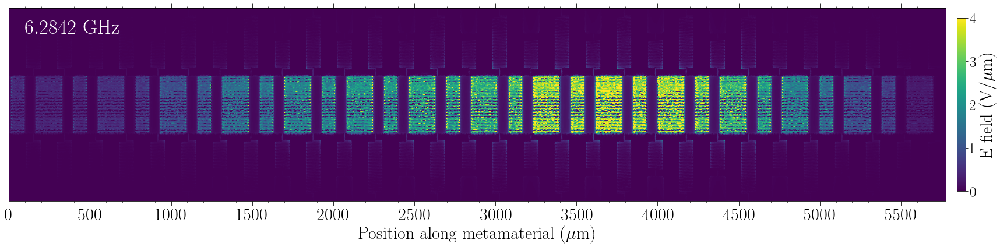

In [5]:
fig, axes = plt.subplots(1, 1, figsize=(27, 6))
nrm = mpl.colors.Normalize(0, 4)

axes.pcolormesh(x_list_1_40, y_list_1_40, z_list_1_40,
                cmap=cm.viridis, norm=nrm, shading='auto')

#axes.set_xlim(-3151.38, 2626.66)
axes.set_xlim(0, 5778.04)
axes.set_ylim(-262.98, 532.02)
axes.set_xlabel(r'Position along metamaterial ($\mu$m)', rotation=0, fontsize=30)
axes.set_ylabel(r'$y$', rotation=90, fontsize=30)
axes.tick_params(axis='both', which='major', length = 8, direction='out', labelsize=30)
axes.tick_params(axis='both', which='minor', length = 3, direction='out', labelsize=30)
axes.xaxis.set_ticks(arange(0, 6000, 500))
axes.xaxis.set_ticks_position('both')
axes.text(100, 430, r"$6.2842$ GHz", color='white', fontsize=35)
#axes.text(-450, 8, r"$n_2 = 0$", color='white', fontsize=25)

axes.get_yaxis().set_visible(False)
axes.xaxis.set_minor_locator(AutoMinorLocator())

plt.pcolormesh(x_list_1_40, y_list_1_40, z_list_1_40,
               cmap=cm.viridis, norm=nrm, shading='auto')
cbar = plt.colorbar(pad = 0.01, shrink = 0.9)
cbar.ax.tick_params(labelsize=25)
cbar.ax.set_ylabel(
    r'E field (V/$\mu$m)', rotation=90, fontsize=30)
plt.tight_layout()


#cp = axes.contour(x_list_1_40, y_list_1_40, A1_xy_list_1_40)
#axes.clabel(cp, inline=True,
 #           fontsize=16)

 #plt.tight_layout()
plt.savefig('Efield_delta_mode1_62842.eps')
#plt.savefig('Efield_delta_mode1_62842.pdf')

plt.show()

TypeError: Dimensions of C (2401, 7426) are incompatible with X (0) and/or Y (2401); see help(pcolormesh)

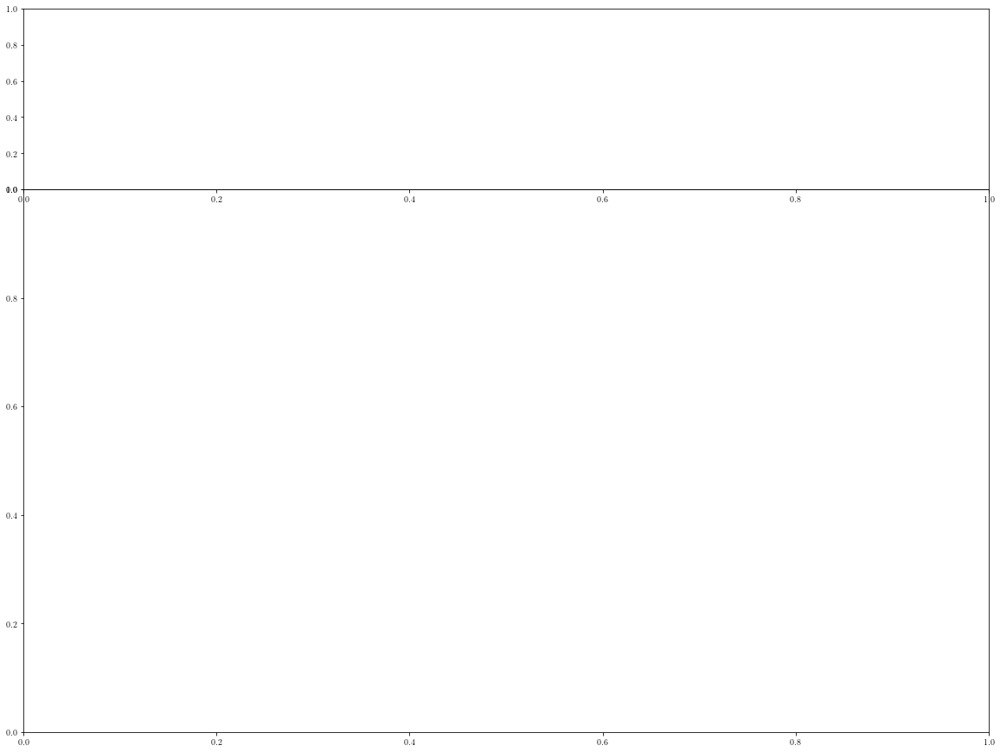

In [270]:
from matplotlib.gridspec import GridSpec

data1_efield_top_40 = loadtxt(r'Efield_1D\221015_1D_efield_m1_top_Cc40.txt')
data1_efield_mid_40 = loadtxt(r'Efield_1D\221015_1D_efield_m1_mid_Cc40.txt')
data1_efield_bot_40 = loadtxt(r'Efield_1D\221015_1D_efield_m1_bot_Cc40.txt')

x_list2 = data1_efield_top_40[:,0] - data1_efield_top_40[:,0][0] # Same for every data

offset = 10

y_list_efield_top_40 = data1_efield_top_40[:,1]/(1e6) + 2 * offset
y_list_efield_mid_40 = data1_efield_mid_40[:,1]/(1e6) + 1 * offset
y_list_efield_bot_40 = data1_efield_bot_40[:,1]/(1e6) 

cline1 = '#ff00d1'
cline2 = 'orange'
cline3 = 'red'

fig = plt.figure(figsize=(20, 15))

gs = fig.add_gridspec(2, 1, height_ratios=(1, 3),
                      top=0.9, 
                      wspace=0.05, hspace=0)

axes2=fig.add_subplot(gs[1,0])                  # First row, second column
axes1=fig.add_subplot(gs[0,0], sharex = axes2)  # First row, first column


nrm = mpl.colors.Normalize(0, 4)

axes1.pcolormesh(x_list_1_40, y_list_1_40, z_list_1_40,
                cmap=cm.viridis, norm=nrm, shading='auto')

#axes.set_xlim(-3151.38, 2626.66)

axes1.axhline(y=251.52, color=cline1, linestyle='-', lw=1.5)
axes1.axhline(y=131.52, color=cline2, linestyle='-', lw=1.5)
axes1.axhline(y=23.52, color=cline3, linestyle='-', lw=1.5)

axes1.set_xlim(0, 5778.04)
axes1.set_ylim(-262.98, 532.02)
#axes1.set_xlabel(r'Position along metamaterial ($\mu$m)', rotation=0, fontsize=30)
#axes1.set_ylabel(r'$y$', rotation=90, fontsize=30)
axes1.tick_params(axis='both', which='major', length = 8, direction='out', labelsize=30, labelbottom=False)
axes1.tick_params(axis='both', which='minor', length = 3, direction='out', labelsize=30, labelbottom=False)
#axes1.xaxis.set_ticks(arange(0, 6000, 500))
axes1.xaxis.set_ticks_position('both')
axes1.text(100, 420, r"$6.2842$ GHz", color='white', fontsize=35)
#axes.text(-450, 8, r"$n_2 = 0$", color='white', fontsize=25)

axes1.get_yaxis().set_visible(False)
axes1.xaxis.set_minor_locator(AutoMinorLocator())

axes2.plot(x_list2, y_list_efield_top_40, color=cline1,
          linestyle='-', label=r'Top line', lw=2.0)

axes2.plot(x_list2, y_list_efield_mid_40, color=cline2,
          linestyle='-', label=r'Middle line', lw=2.0)

axes2.plot(x_list2, y_list_efield_bot_40, color=cline3,
          linestyle='-', label=r'Bottom line', lw=2.0)

          
axes2.set_xlabel(r'Position along metamaterial ($\mu$m)', rotation=0, fontsize=35)
axes2.set_ylabel(
    r'Electric field (V/$\mu$m)', rotation=90, fontsize=35)

axes2.tick_params(axis='both', which='major', length = 8, direction='in', labelsize=35)
axes2.tick_params(axis='both', which='minor', length = 4, direction='in', labelsize=35)
#axes.yaxis.tick_right()
axes2.xaxis.set_ticks_position('both')
axes2.yaxis.set_ticks_position('both')
#axes2.legend(loc=2, fontsize=23, frameon=False)

axes2.set_xlim(0, 5778.04)
#axes.set_ylim(-140, 0)

#start, end = axes.get_ylim()
axes2.xaxis.set_ticks(arange(0, 6000, 500))
#axes.yaxis.set_ticks(arange(start, end+1, 20))

axes2.xaxis.set_minor_locator(AutoMinorLocator())
axes2.yaxis.set_minor_locator(AutoMinorLocator())

#axes.text(-900, 0.14, r"$n_2 = 1$", color='red', fontsize=25, rotation=-45)
#axes.text(-410, 0.27, r"$n_2 = 0$", color='red', fontsize=25, rotation=-45)

plt.margins(x=0.01, y=0.01)
plt.tight_layout()
#plt.savefig('Efield_1D_delta_mode1_62842.pdf')
plt.savefig('Efield_1D_delta_mode1_62842.png')
plt.show()

### (A.2.2) Mode 2 (6.3042 GHz)

In [264]:
# Data imports from 'Export\3d\'
try:
    data2_40
except NameError:
    data2_40 = loadtxt(r'220923_SUPERLATTICE_5_Cc40\Export\3d\e-field (f=6.3042) [1].txt')  # This may take a few minutes due to size of the CST data (Approx. 7 minutes).

# The file is in ASCII format:
# Columns order:     0) x (um)       1) y (um)      2) z (um)      3) ExRe (V/m)        4) ExIm (V/m)       5) EyRe (V/m)       6) EyIm (V/m)       7) EzRe (V/m)       8) EzIm (V/m)

# Import position columns
data_x_2_40 = data2_40[:,0]
data_y_2_40 = data2_40[:,1]
# Import field column
data_z_2_40 = abs(data2_40[:,7])/(1e6)

# Get X list
x_list_2_40 = []
x0_meta = -3151.38 # metamaterial starts at this position
xf_meta =  2626.66 # metamaterial ends at this position
x_list_2_40.append(data_x_2_40[0] - x0_meta)
for i in range(1,len(data_x_2_40)):
    if data_x_2_40[i] != data_x_2_40[0]:
        x_list_2_40.append(data_x_2_40[i] - x0_meta)
    else:
        break

# Get Y list
y_list_2_40 = []
y0_meta = -262.98 # metamaterial starts at this position
yf_meta =  532.02 # metamaterial ends at this position
y_list_2_40.append(data_y_2_40[0])
value =  data_y_2_40[0]
for i in range(1,len(data_y_2_40)):
    if data_y_2_40[i] != value:
        y_list_2_40.append(data_y_2_40[i])
        value = data_y_2_40[i]
    
# Get Z list
z_list_2_40 = []
for j in range(len(y_list_2_40)):
    aux = []
    for i in range(len(x_list_2_40)):
        aux.append(data_z_2_40[i+len(x_list_2_40)*j])
    z_list_2_40.append(aux)


In [265]:
# Get X list
x_list_2_40 = []
x0_meta = -3151.38 # metamaterial starts at this position
xf_meta =  2626.66 # metamaterial ends at this position
x_list_2_40.append(data_x_2_40[0] - x0_meta)
for i in range(1,len(data_x_2_40)):
    if data_x_2_40[i] != data_x_2_40[0]:
        x_list_2_40.append(data_x_2_40[i] - x0_meta)
    else:
        break

# Get Y list
y_list_2_40 = []
y0_meta = -262.98 # metamaterial starts at this position
yf_meta =  532.02 # metamaterial ends at this position
y_list_2_40.append(data_y_2_40[0])
value =  data_y_2_40[0]
for i in range(1,len(data_y_2_40)):
    if data_y_2_40[i] != value:
        y_list_2_40.append(data_y_2_40[i])
        value = data_y_2_40[i]
        
# Get Z list
z_list_2_40 = []
for j in range(len(y_list_2_40)):
    aux = []
    for i in range(len(x_list_2_40)):
        aux.append(data_z_2_40[i+len(x_list_2_40)*j])
    z_list_2_40.append(aux)

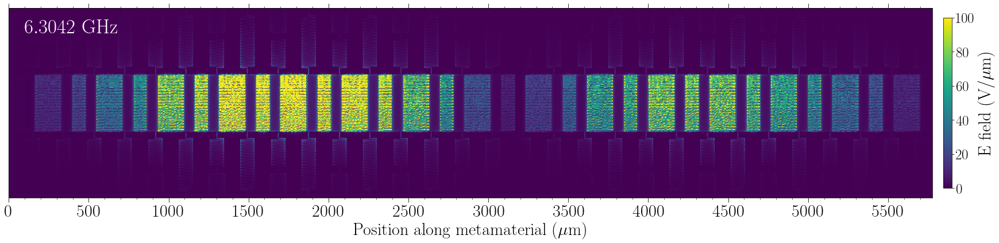

In [268]:
fig, axes = plt.subplots(1, 1, figsize=(27, 6))
nrm = mpl.colors.Normalize(0, 100)

axes.pcolormesh(x_list_2_40, y_list_2_40, z_list_2_40,
                cmap=cm.viridis, norm=nrm, shading='auto')

#axes.set_xlim(-3151.38, 2626.66)
axes.set_xlim(0, 5778.04)
axes.set_ylim(-262.98, 532.02)
axes.set_xlabel(r'Position along metamaterial ($\mu$m)', rotation=0, fontsize=30)
axes.set_ylabel(r'$y$', rotation=90, fontsize=30)
axes.tick_params(axis='both', which='major', length = 8, direction='out', labelsize=30)
axes.tick_params(axis='both', which='minor', length = 3, direction='out', labelsize=30)
axes.xaxis.set_ticks(arange(0, 6000, 500))
axes.xaxis.set_ticks_position('both')
axes.text(100, 430, r"$6.3042$ GHz", color='white', fontsize=35)
#axes.text(-450, 8, r"$n_2 = 0$", color='white', fontsize=25)

axes.get_yaxis().set_visible(False)
axes.xaxis.set_minor_locator(AutoMinorLocator())

plt.pcolormesh(x_list_2_40, y_list_2_40, z_list_2_40,
               cmap=cm.viridis, norm=nrm, shading='auto')
cbar = plt.colorbar(pad = 0.01, shrink = 0.9)
cbar.ax.tick_params(labelsize=25)
cbar.ax.set_ylabel(
    r'E field (V/$\mu$m)', rotation=90, fontsize=30)
plt.tight_layout()


#cp = axes.contour(x_list_2_40, y_list_2_40, A1_xy_list_2_40)
#axes.clabel(cp, inline=True,
 #           fontsize=16)

plt.show()

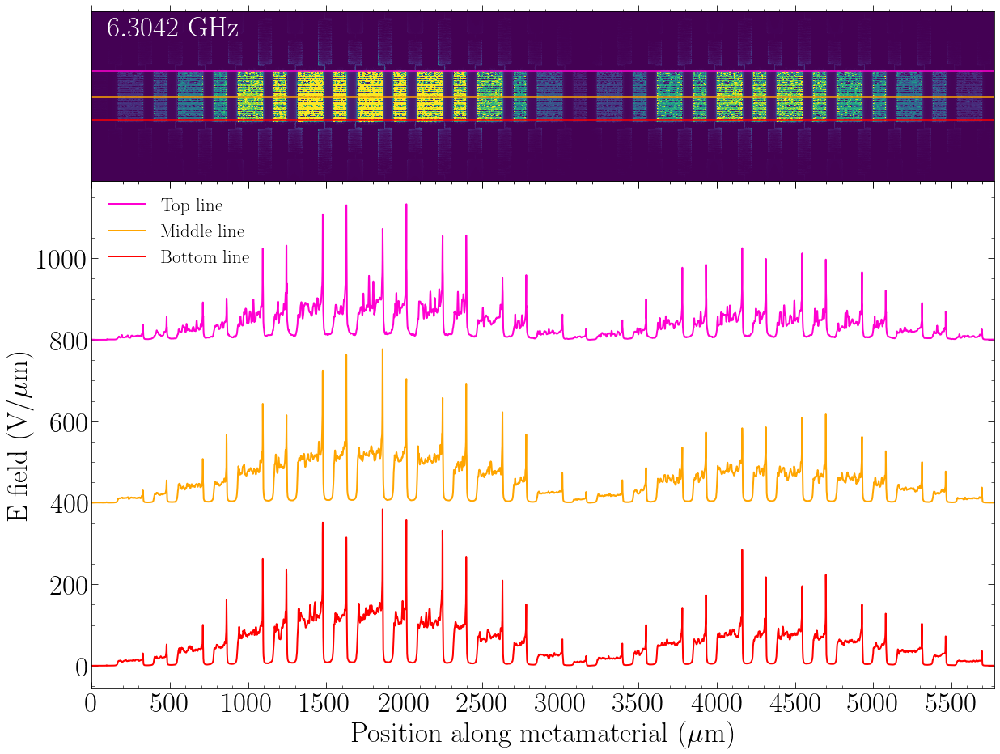

In [203]:
data2_efield_top_40 = loadtxt(r'221015_1D_efield_m2_top_Cc40.txt')
data2_efield_mid_40 = loadtxt(r'221015_1D_efield_m2_mid_Cc40.txt')
data2_efield_bot_40 = loadtxt(r'221015_1D_efield_m2_bot_Cc40.txt')

x_list2 = data1_efield_top_40[:,0] - data1_efield_top_40[:,0][0] # Same for every data

offset = 400

y_list_efield_top_40 = data2_efield_top_40[:,1]/(1e6) + 2 * offset
y_list_efield_mid_40 = data2_efield_mid_40[:,1]/(1e6) + 1 * offset
y_list_efield_bot_40 = data2_efield_bot_40[:,1]/(1e6) 

cline1 = '#ff00d1'
cline2 = 'orange'
cline3 = 'red'

fig = plt.figure(figsize=(20, 15))

gs = fig.add_gridspec(2, 1, height_ratios=(1, 3),
                      top=0.9, 
                      wspace=0.05, hspace=0)

axes2=fig.add_subplot(gs[1,0])                  # First row, second column
axes1=fig.add_subplot(gs[0,0], sharex = axes2)  # First row, first column


nrm = mpl.colors.Normalize(0, 100)

axes1.pcolormesh(x_list, y_list, z_list,
                cmap=cm.viridis, norm=nrm, shading='auto')

#axes.set_xlim(-3151.38, 2626.66)

axes1.axhline(y=251.52, color=cline1, linestyle='-', lw=1.5)
axes1.axhline(y=131.52, color=cline2, linestyle='-', lw=1.5)
axes1.axhline(y=23.52, color=cline3, linestyle='-', lw=1.5)

axes1.set_xlim(0, 5778.04)
axes1.set_ylim(-262.98, 532.02)
#axes1.set_xlabel(r'Position along metamaterial ($\mu$m)', rotation=0, fontsize=30)
#axes1.set_ylabel(r'$y$', rotation=90, fontsize=30)
axes1.tick_params(axis='both', which='major', length = 8, direction='out', labelsize=30, labelbottom=False)
axes1.tick_params(axis='both', which='minor', length = 3, direction='out', labelsize=30, labelbottom=False)
#axes1.xaxis.set_ticks(arange(0, 6000, 500))
axes1.xaxis.set_ticks_position('both')
axes1.text(100, 420, r"$6.3042$ GHz", color='white', fontsize=35)
#axes.text(-450, 8, r"$n_2 = 0$", color='white', fontsize=25)

axes1.get_yaxis().set_visible(False)
axes1.xaxis.set_minor_locator(AutoMinorLocator())

axes2.plot(x_list2, y_list_efield_top_40, color=cline1,
          linestyle='-', label=r'Top line', lw=2.0)

axes2.plot(x_list2, y_list_efield_mid_40, color=cline2,
          linestyle='-', label=r'Middle line', lw=2.0)

axes2.plot(x_list2, y_list_efield_bot_40, color=cline3,
          linestyle='-', label=r'Bottom line', lw=2.0)

          
axes2.set_xlabel(r'Position along metamaterial ($\mu$m)', rotation=0, fontsize=35)
axes2.set_ylabel(
    r'E field (V/$\mu$m)', rotation=90, fontsize=35)

axes2.tick_params(axis='both', which='major', length = 8, direction='in', labelsize=35)
axes2.tick_params(axis='both', which='minor', length = 4, direction='in', labelsize=35)
#axes.yaxis.tick_right()
axes2.xaxis.set_ticks_position('both')
axes2.yaxis.set_ticks_position('both')
axes2.legend(loc=2, fontsize=23, frameon=False)

axes2.set_xlim(0, 5778.04)
#axes.set_ylim(-140, 0)

#start, end = axes.get_ylim()
axes2.xaxis.set_ticks(arange(0, 6000, 500))
#axes.yaxis.set_ticks(arange(start, end+1, 20))

axes2.xaxis.set_minor_locator(AutoMinorLocator())
axes2.yaxis.set_minor_locator(AutoMinorLocator())

#axes.text(-900, 0.14, r"$n_2 = 1$", color='red', fontsize=25, rotation=-45)
#axes.text(-410, 0.27, r"$n_2 = 0$", color='red', fontsize=25, rotation=-45)

plt.margins(x=0.01, y=0.01)
#plt.tight_layout()
#plt.savefig('a1_ss_2d_02.pdf')
plt.show()

### (A.2.3) Mode 3 (6.3434 GHz)

In [4]:
# Data imports from 'Export\3d\'
data3_40 = loadtxt(r'220923_SUPERLATTICE_5_Cc40\Export\3d\e-field (f=6.3434) [1].txt')  # This may take a few minutes due to size of the CST data (Approx. 7 minutes).

# The file is in ASCII format:
# Columns order:     0) x (um)       1) y (um)      2) z (um)      3) ExRe (V/m)        4) ExIm (V/m)       5) EyRe (V/m)       6) EyIm (V/m)       7) EzRe (V/m)       8) EzIm (V/m)

In [204]:
# Import position columns
data_x = data3_40[:,0]
data_y = data3_40[:,1]
# Import field column
data_z = abs(data3_40[:,7])/(1e6)

In [205]:
# Get X list
x_list = []
x0_meta = -3151.38 # metamaterial starts at this position
xf_meta =  2626.66 # metamaterial ends at this position
x_list.append(data_x[0] - x0_meta)
for i in range(1,len(data_x)):
    if data_x[i] != data_x[0]:
        x_list.append(data_x[i] - x0_meta)
    else:
        break

# Get Y list
y_list = []
y0_meta = -262.98 # metamaterial starts at this position
yf_meta =  532.02 # metamaterial ends at this position
y_list.append(data_y[0])
value =  data_y[0]
for i in range(1,len(data_y)):
    if data_y[i] != value:
        y_list.append(data_y[i])
        value = data_y[i]
        
# Get Z list
z_list = []
for j in range(len(y_list)):
    aux = []
    for i in range(len(x_list)):
        aux.append(data_z[i+len(x_list)*j])
    z_list.append(aux)

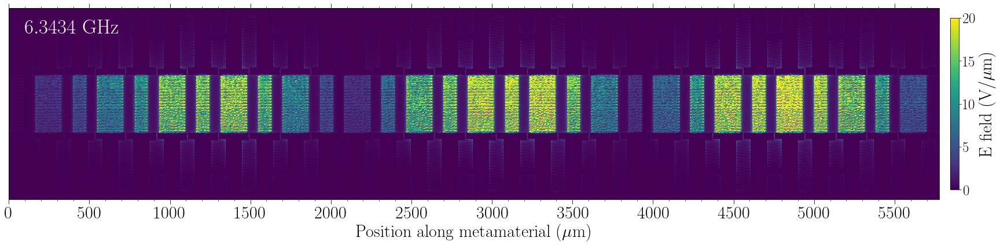

In [30]:
fig, axes = plt.subplots(1, 1, figsize=(27, 6))
nrm = mpl.colors.Normalize(0, 20)

axes.pcolormesh(x_list, y_list, z_list,
                cmap=cm.viridis, norm=nrm, shading='auto')

#axes.set_xlim(-3151.38, 2626.66)
axes.set_xlim(0, 5778.04)
axes.set_ylim(-262.98, 532.02)
axes.set_xlabel(r'Position along metamaterial ($\mu$m)', rotation=0, fontsize=30)
axes.set_ylabel(r'$y$', rotation=90, fontsize=30)
axes.tick_params(axis='both', which='major', length = 8, direction='out', labelsize=30)
axes.tick_params(axis='both', which='minor', length = 3, direction='out', labelsize=30)
axes.xaxis.set_ticks(arange(0, 6000, 500))
axes.xaxis.set_ticks_position('both')
axes.text(100, 430, r"$6.3434$ GHz", color='white', fontsize=35)
#axes.text(-450, 8, r"$n_2 = 0$", color='white', fontsize=25)

axes.get_yaxis().set_visible(False)
axes.xaxis.set_minor_locator(AutoMinorLocator())

plt.pcolormesh(x_list, y_list, z_list,
               cmap=cm.viridis, norm=nrm, shading='auto')
cbar = plt.colorbar(pad = 0.01, shrink = 0.9)
cbar.ax.tick_params(labelsize=25)
cbar.ax.set_ylabel(
    r'E field (V/$\mu$m)', rotation=90, fontsize=30)
plt.tight_layout()


#cp = axes.contour(x_list, y_list, A1_xy_list)
#axes.clabel(cp, inline=True,
 #           fontsize=16)

plt.show()

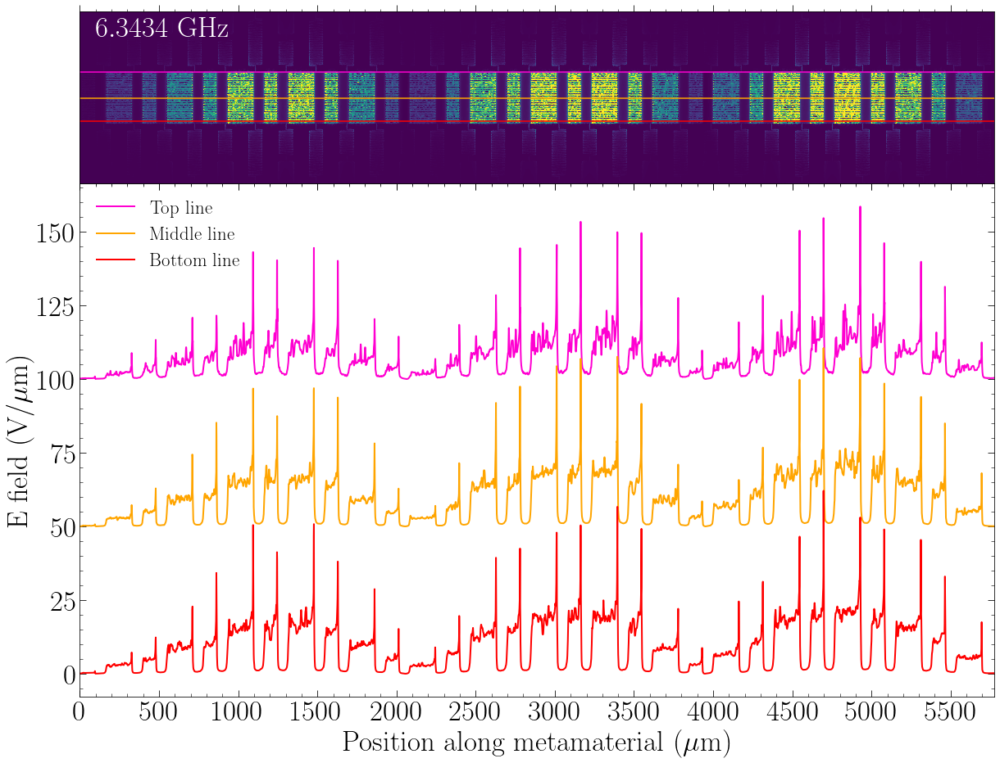

In [208]:
data3_efield_top_40 = loadtxt(r'221015_1D_efield_m3_top_Cc40.txt')
data3_efield_mid_40 = loadtxt(r'221015_1D_efield_m3_mid_Cc40.txt')
data3_efield_bot_40 = loadtxt(r'221015_1D_efield_m3_bot_Cc40.txt')

x_list2 = data1_efield_top_40[:,0] - data1_efield_top_40[:,0][0] # Same for every data

offset = 50

y_list_efield_top_40 = data3_efield_top_40[:,1]/(1e6) + 2 * offset
y_list_efield_mid_40 = data3_efield_mid_40[:,1]/(1e6) + 1 * offset
y_list_efield_bot_40 = data3_efield_bot_40[:,1]/(1e6) 

cline1 = '#ff00d1'
cline2 = 'orange'
cline3 = 'red'

fig = plt.figure(figsize=(20, 15))

gs = fig.add_gridspec(2, 1, height_ratios=(1, 3),
                      top=0.9, 
                      wspace=0.05, hspace=0)

axes2=fig.add_subplot(gs[1,0])                  # First row, second column
axes1=fig.add_subplot(gs[0,0], sharex = axes2)  # First row, first column


nrm = mpl.colors.Normalize(0, 20)

axes1.pcolormesh(x_list, y_list, z_list,
                cmap=cm.viridis, norm=nrm, shading='auto')

#axes.set_xlim(-3151.38, 2626.66)

axes1.axhline(y=251.52, color=cline1, linestyle='-', lw=1.5)
axes1.axhline(y=131.52, color=cline2, linestyle='-', lw=1.5)
axes1.axhline(y=23.52, color=cline3, linestyle='-', lw=1.5)

axes1.set_xlim(0, 5778.04)
axes1.set_ylim(-262.98, 532.02)
#axes1.set_xlabel(r'Position along metamaterial ($\mu$m)', rotation=0, fontsize=30)
#axes1.set_ylabel(r'$y$', rotation=90, fontsize=30)
axes1.tick_params(axis='both', which='major', length = 8, direction='out', labelsize=30, labelbottom=False)
axes1.tick_params(axis='both', which='minor', length = 3, direction='out', labelsize=30, labelbottom=False)
#axes1.xaxis.set_ticks(arange(0, 6000, 500))
axes1.xaxis.set_ticks_position('both')
axes1.text(100, 420, r"$6.3434$ GHz", color='white', fontsize=35)
#axes.text(-450, 8, r"$n_2 = 0$", color='white', fontsize=25)

axes1.get_yaxis().set_visible(False)
axes1.xaxis.set_minor_locator(AutoMinorLocator())

axes2.plot(x_list2, y_list_efield_top_40, color=cline1,
          linestyle='-', label=r'Top line', lw=2.0)

axes2.plot(x_list2, y_list_efield_mid_40, color=cline2,
          linestyle='-', label=r'Middle line', lw=2.0)

axes2.plot(x_list2, y_list_efield_bot_40, color=cline3,
          linestyle='-', label=r'Bottom line', lw=2.0)

          
axes2.set_xlabel(r'Position along metamaterial ($\mu$m)', rotation=0, fontsize=35)
axes2.set_ylabel(
    r'E field (V/$\mu$m)', rotation=90, fontsize=35)

axes2.tick_params(axis='both', which='major', length = 8, direction='in', labelsize=35)
axes2.tick_params(axis='both', which='minor', length = 4, direction='in', labelsize=35)
#axes.yaxis.tick_right()
axes2.xaxis.set_ticks_position('both')
axes2.yaxis.set_ticks_position('both')
axes2.legend(loc=2, fontsize=23, frameon=False)

axes2.set_xlim(0, 5778.04)
#axes.set_ylim(-140, 0)

#start, end = axes.get_ylim()
axes2.xaxis.set_ticks(arange(0, 6000, 500))
#axes.yaxis.set_ticks(arange(start, end+1, 20))

axes2.xaxis.set_minor_locator(AutoMinorLocator())
axes2.yaxis.set_minor_locator(AutoMinorLocator())

#axes.text(-900, 0.14, r"$n_2 = 1$", color='red', fontsize=25, rotation=-45)
#axes.text(-410, 0.27, r"$n_2 = 0$", color='red', fontsize=25, rotation=-45)

plt.margins(x=0.01, y=0.01)
#plt.tight_layout()
#plt.savefig('a1_ss_2d_02.pdf')
plt.show()

### (A.2.4) Mode 4 (6.3847 GHz)

In [5]:
# Data imports from 'Export\3d\'
data4_40 = loadtxt(r'220923_SUPERLATTICE_5_Cc40\Export\3d\e-field (f=6.3847) [1].txt')  # This may take a few minutes due to size of the CST data (Approx. 7 minutes).

# The file is in ASCII format:
# Columns order:     0) x (um)       1) y (um)      2) z (um)      3) ExRe (V/m)        4) ExIm (V/m)       5) EyRe (V/m)       6) EyIm (V/m)       7) EzRe (V/m)       8) EzIm (V/m)

In [209]:
# Import position columns
data_x = data4_40[:,0]
data_y = data4_40[:,1]
# Import field column
data_z = abs(data4_40[:,7])/(1e6)

In [210]:
# Get X list
x_list = []
x0_meta = -3151.38 # metamaterial starts at this position
xf_meta =  2626.66 # metamaterial ends at this position
x_list.append(data_x[0] - x0_meta)
for i in range(1,len(data_x)):
    if data_x[i] != data_x[0]:
        x_list.append(data_x[i] - x0_meta)
    else:
        break

# Get Y list
y_list = []
y0_meta = -262.98 # metamaterial starts at this position
yf_meta =  532.02 # metamaterial ends at this position
y_list.append(data_y[0])
value =  data_y[0]
for i in range(1,len(data_y)):
    if data_y[i] != value:
        y_list.append(data_y[i])
        value = data_y[i]
        
# Get Z list
z_list = []
for j in range(len(y_list)):
    aux = []
    for i in range(len(x_list)):
        aux.append(data_z[i+len(x_list)*j])
    z_list.append(aux)

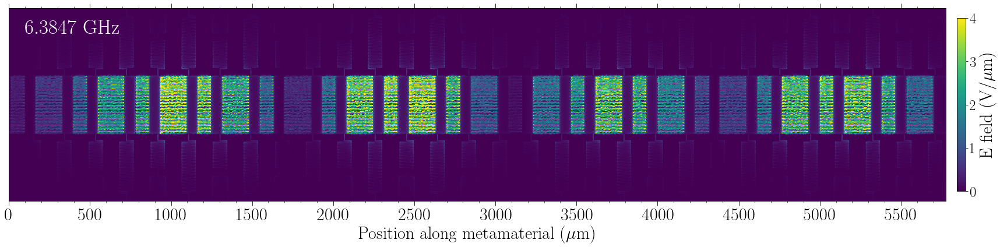

In [37]:
fig, axes = plt.subplots(1, 1, figsize=(27, 6))
nrm = mpl.colors.Normalize(0, 4)

axes.pcolormesh(x_list, y_list, z_list,
                cmap=cm.viridis, norm=nrm, shading='auto')

#axes.set_xlim(-3151.38, 2626.66)
axes.set_xlim(0, 5778.04)
axes.set_ylim(-262.98, 532.02)
axes.set_xlabel(r'Position along metamaterial ($\mu$m)', rotation=0, fontsize=30)
axes.set_ylabel(r'$y$', rotation=90, fontsize=30)
axes.tick_params(axis='both', which='major', length = 8, direction='out', labelsize=30)
axes.tick_params(axis='both', which='minor', length = 3, direction='out', labelsize=30)
axes.xaxis.set_ticks(arange(0, 6000, 500))
axes.xaxis.set_ticks_position('both')
axes.text(100, 430, r"$6.3847$ GHz", color='white', fontsize=35)
#axes.text(-450, 8, r"$n_2 = 0$", color='white', fontsize=25)

axes.get_yaxis().set_visible(False)
axes.xaxis.set_minor_locator(AutoMinorLocator())

plt.pcolormesh(x_list, y_list, z_list,
               cmap=cm.viridis, norm=nrm, shading='auto')
cbar = plt.colorbar(pad = 0.01, shrink = 0.9)
cbar.ax.tick_params(labelsize=25)
cbar.ax.set_ylabel(
    r'E field (V/$\mu$m)', rotation=90, fontsize=30)
plt.tight_layout()


#cp = axes.contour(x_list, y_list, A1_xy_list)
#axes.clabel(cp, inline=True,
 #           fontsize=16)

plt.show()

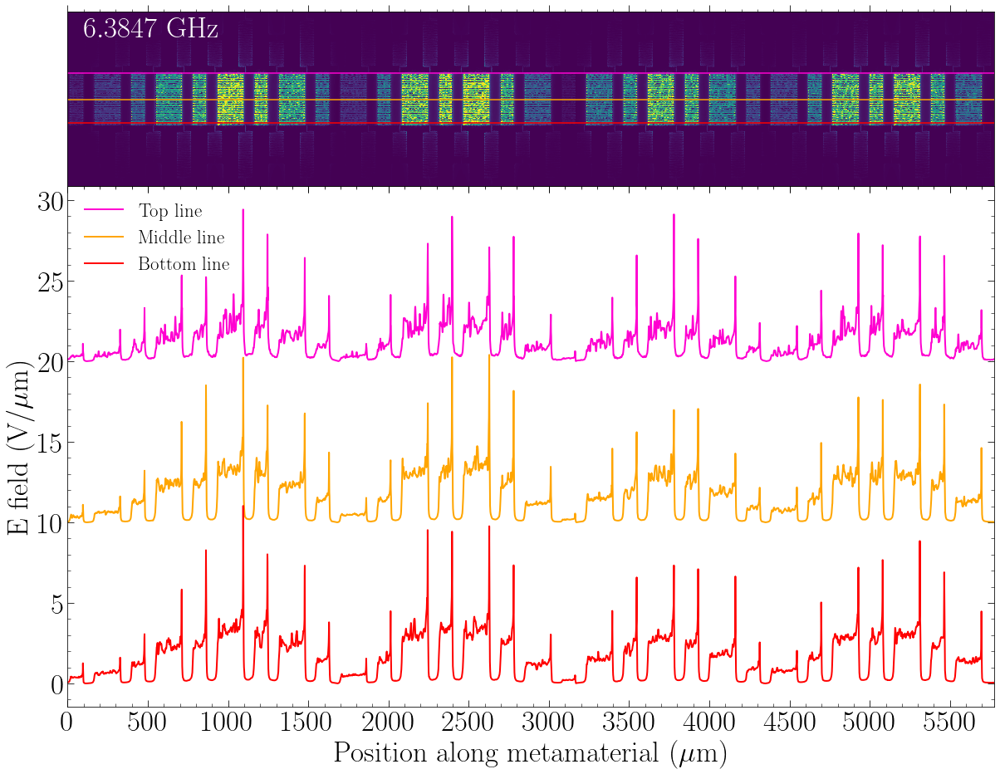

In [214]:
data4_efield_top_40 = loadtxt(r'221015_1D_efield_m4_top_Cc40.txt')
data4_efield_mid_40 = loadtxt(r'221015_1D_efield_m4_mid_Cc40.txt')
data4_efield_bot_40 = loadtxt(r'221015_1D_efield_m4_bot_Cc40.txt')

x_list2 = data1_efield_top_40[:,0] - data1_efield_top_40[:,0][0] # Same for every data

offset = 10

y_list_efield_top_40 = data4_efield_top_40[:,1]/(1e6) + 2 * offset
y_list_efield_mid_40 = data4_efield_mid_40[:,1]/(1e6) + 1 * offset
y_list_efield_bot_40 = data4_efield_bot_40[:,1]/(1e6) 

cline1 = '#ff00d1'
cline2 = 'orange'
cline3 = 'red'

fig = plt.figure(figsize=(20, 15))

gs = fig.add_gridspec(2, 1, height_ratios=(1, 3),
                      top=0.9, 
                      wspace=0.05, hspace=0)

axes2=fig.add_subplot(gs[1,0])                  # First row, second column
axes1=fig.add_subplot(gs[0,0], sharex = axes2)  # First row, first column


nrm = mpl.colors.Normalize(0, 4)

axes1.pcolormesh(x_list, y_list, z_list,
                cmap=cm.viridis, norm=nrm, shading='auto')

#axes.set_xlim(-3151.38, 2626.66)

axes1.axhline(y=251.52, color=cline1, linestyle='-', lw=1.5)
axes1.axhline(y=131.52, color=cline2, linestyle='-', lw=1.5)
axes1.axhline(y=23.52, color=cline3, linestyle='-', lw=1.5)

axes1.set_xlim(0, 5778.04)
axes1.set_ylim(-262.98, 532.02)
#axes1.set_xlabel(r'Position along metamaterial ($\mu$m)', rotation=0, fontsize=30)
#axes1.set_ylabel(r'$y$', rotation=90, fontsize=30)
axes1.tick_params(axis='both', which='major', length = 8, direction='out', labelsize=30, labelbottom=False)
axes1.tick_params(axis='both', which='minor', length = 3, direction='out', labelsize=30, labelbottom=False)
#axes1.xaxis.set_ticks(arange(0, 6000, 500))
axes1.xaxis.set_ticks_position('both')
axes1.text(100, 420, r"$6.3847$ GHz", color='white', fontsize=35)
#axes.text(-450, 8, r"$n_2 = 0$", color='white', fontsize=25)

axes1.get_yaxis().set_visible(False)
axes1.xaxis.set_minor_locator(AutoMinorLocator())

axes2.plot(x_list2, y_list_efield_top_40, color=cline1,
          linestyle='-', label=r'Top line', lw=2.0)

axes2.plot(x_list2, y_list_efield_mid_40, color=cline2,
          linestyle='-', label=r'Middle line', lw=2.0)

axes2.plot(x_list2, y_list_efield_bot_40, color=cline3,
          linestyle='-', label=r'Bottom line', lw=2.0)

          
axes2.set_xlabel(r'Position along metamaterial ($\mu$m)', rotation=0, fontsize=35)
axes2.set_ylabel(
    r'E field (V/$\mu$m)', rotation=90, fontsize=35)

axes2.tick_params(axis='both', which='major', length = 8, direction='in', labelsize=35)
axes2.tick_params(axis='both', which='minor', length = 4, direction='in', labelsize=35)
#axes.yaxis.tick_right()
axes2.xaxis.set_ticks_position('both')
axes2.yaxis.set_ticks_position('both')
axes2.legend(loc=2, fontsize=23, frameon=False)

axes2.set_xlim(0, 5778.04)
#axes.set_ylim(-140, 0)

#start, end = axes.get_ylim()
axes2.xaxis.set_ticks(arange(0, 6000, 500))
#axes.yaxis.set_ticks(arange(start, end+1, 20))

axes2.xaxis.set_minor_locator(AutoMinorLocator())
axes2.yaxis.set_minor_locator(AutoMinorLocator())

#axes.text(-900, 0.14, r"$n_2 = 1$", color='red', fontsize=25, rotation=-45)
#axes.text(-410, 0.27, r"$n_2 = 0$", color='red', fontsize=25, rotation=-45)

plt.margins(x=0.01, y=0.01)
#plt.tight_layout()
#plt.savefig('a1_ss_2d_02.pdf')
plt.show()

### (A.2.5) Mode 5 (6.4430 GHz)

In [ ]:
# Data imports from 'Export\3d\'
data5_40 = loadtxt(r'D:\Alessandro\CST Projects\Metamaterial Superlattice\e-field (f=2.45) [1].txt')  # This may take a few minutes due to size of the CST data (Approx. 7 minutes).

# The file is in ASCII format:
# Columns order:     0) x (um)       1) y (um)      2) z (um)      3) ExRe (V/m)        4) ExIm (V/m)       5) EyRe (V/m)       6) EyIm (V/m)       7) EzRe (V/m)       8) EzIm (V/m)

In [12]:
# Data imports from 'Export\3d\'
data6 = loadtxt(r'D:\Alessandro\CST Projects\Metamaterial Superlattice\e-field (f=2.606) [1].txt')  # This may take a few minutes due to size of the CST data (Approx. 7 minutes).

# The file is in ASCII format:
# Columns order:     0) x (um)       1) y (um)      2) z (um)      3) ExRe (V/m)        4) ExIm (V/m)       5) EyRe (V/m)       6) EyIm (V/m)       7) EzRe (V/m)       8) EzIm (V/m)

In [17]:
# Data imports from 'Export\3d\'
data7 = loadtxt(r'D:\Alessandro\CST Projects\Metamaterial Superlattice\e-field (f=2.7815) [1].txt')  # This may take a few minutes due to size of the CST data (Approx. 7 minutes).

# The file is in ASCII format:
# Columns order:     0) x (um)       1) y (um)      2) z (um)      3) ExRe (V/m)        4) ExIm (V/m)       5) EyRe (V/m)       6) EyIm (V/m)       7) EzRe (V/m)       8) EzIm (V/m)

In [18]:
# Data imports from 'Export\3d\'
data8 = loadtxt(r'D:\Alessandro\CST Projects\Metamaterial Superlattice\e-field (f=2.9462) [1].txt')  # This may take a few minutes due to size of the CST data (Approx. 7 minutes).

# The file is in ASCII format:
# Columns order:     0) x (um)       1) y (um)      2) z (um)      3) ExRe (V/m)        4) ExIm (V/m)       5) EyRe (V/m)       6) EyIm (V/m)       7) EzRe (V/m)       8) EzIm (V/m)

In [3]:
1722.448- -1735.096

3457.544

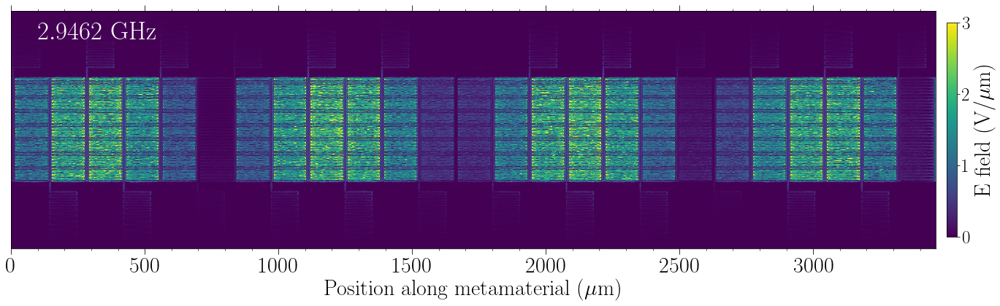

In [26]:
# Import position columns
data_x = data8[:,0]
data_y = data8[:,1]
# Import field column
data_z = abs(data8[:,7])/(1e6)

# Get X list
x_list = []
x0_meta = -1735.096 # metamaterial starts at this position
xf_meta =  1722.448 # metamaterial ends at this position
x_list.append(data_x[0] - x0_meta)
for i in range(1,len(data_x)):
    if data_x[i] != data_x[0]:
        x_list.append(data_x[i] - x0_meta)
    else:
        break

# Get Y list
y_list = []
y0_meta = -3218.49 # metamaterial starts at this position
yf_meta = -2290.471 # metamaterial ends at this position
y_list.append(data_y[0])
value =  data_y[0]
for i in range(1,len(data_y)):
    if data_y[i] != value:
        y_list.append(data_y[i])
        value = data_y[i]
        
# Get Z list
z_list = []
for j in range(len(y_list)):
    aux = []
    for i in range(len(x_list)):
        aux.append(data_z[i+len(x_list)*j])
    z_list.append(aux)


fig, axes = plt.subplots(1, 1, figsize=(27, 6))
nrm = mpl.colors.Normalize(0, 3)

axes.pcolormesh(x_list, y_list, z_list,
                cmap=cm.viridis, norm=nrm, shading='auto')

#axes.set_xlim(-3151.38, 2626.66)

axes.set_xlabel(r'Position along metamaterial ($\mu$m)', rotation=0, fontsize=30)
axes.set_ylabel(r'$y$', rotation=90, fontsize=30)
axes.tick_params(axis='both', which='major', length = 8, direction='out', labelsize=30)
axes.tick_params(axis='both', which='minor', length = 3, direction='out', labelsize=30)
axes.xaxis.set_ticks(arange(0, 6000, 500))
axes.xaxis.set_ticks_position('both')
axes.text(100, -2400, r"$2.9462$ GHz", color='white', fontsize=35)
#axes.text(-450, 8, r"$n_2 = 0$", color='white', fontsize=25)

axes.get_yaxis().set_visible(False)
axes.xaxis.set_minor_locator(AutoMinorLocator())

axes.set_xlim(0, 3457.544)
axes.set_ylim(y0_meta, yf_meta)

plt.pcolormesh(x_list, y_list, z_list,
               cmap=cm.viridis, norm=nrm, shading='auto')
cbar = plt.colorbar(pad = 0.01, shrink = 0.9)
cbar.ax.tick_params(labelsize=25)
cbar.ax.set_ylabel(
    r'E field (V/$\mu$m)', rotation=90, fontsize=30)
#plt.tight_layout()


#cp = axes.contour(x_list, y_list, A1_xy_list)
#axes.clabel(cp, inline=True,
 #           fontsize=16)
plt.show()


In [6]:
# Data imports from 'Export\3d\'
data5_40 = loadtxt(r'220923_SUPERLATTICE_5_Cc40\Export\3d\e-field (f=6.4430) [1].txt')  # This may take a few minutes due to size of the CST data (Approx. 7 minutes).

# The file is in ASCII format:
# Columns order:     0) x (um)       1) y (um)      2) z (um)      3) ExRe (V/m)        4) ExIm (V/m)       5) EyRe (V/m)       6) EyIm (V/m)       7) EzRe (V/m)       8) EzIm (V/m)

In [215]:
# Import position columns
data_x = data5_40[:,0]
data_y = data5_40[:,1]
# Import field column
data_z = abs(data5_40[:,7])/(1e6)

In [216]:
# Get X list
x_list = []
x0_meta = -3151.38 # metamaterial starts at this position
xf_meta =  2626.66 # metamaterial ends at this position
x_list.append(data_x[0] - x0_meta)
for i in range(1,len(data_x)):
    if data_x[i] != data_x[0]:
        x_list.append(data_x[i] - x0_meta)
    else:
        break

# Get Y list
y_list = []
y0_meta = -262.98 # metamaterial starts at this position
yf_meta =  532.02 # metamaterial ends at this position
y_list.append(data_y[0])
value =  data_y[0]
for i in range(1,len(data_y)):
    if data_y[i] != value:
        y_list.append(data_y[i])
        value = data_y[i]
        
# Get Z list
z_list = []
for j in range(len(y_list)):
    aux = []
    for i in range(len(x_list)):
        aux.append(data_z[i+len(x_list)*j])
    z_list.append(aux)

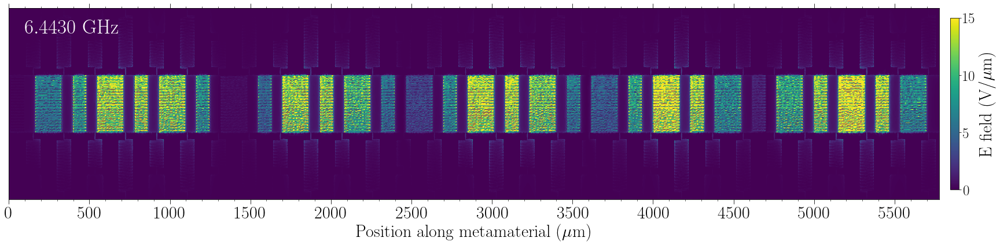

In [43]:
fig, axes = plt.subplots(1, 1, figsize=(27, 6))
nrm = mpl.colors.Normalize(0, 15)

axes.pcolormesh(x_list, y_list, z_list,
                cmap=cm.viridis, norm=nrm, shading='auto')

#axes.set_xlim(-3151.38, 2626.66)
axes.set_xlim(0, 5778.04)
axes.set_ylim(-262.98, 532.02)
axes.set_xlabel(r'Position along metamaterial ($\mu$m)', rotation=0, fontsize=30)
axes.set_ylabel(r'$y$', rotation=90, fontsize=30)
axes.tick_params(axis='both', which='major', length = 8, direction='out', labelsize=30)
axes.tick_params(axis='both', which='minor', length = 3, direction='out', labelsize=30)
axes.xaxis.set_ticks(arange(0, 6000, 500))
axes.xaxis.set_ticks_position('both')
axes.text(100, 430, r"$6.4430$ GHz", color='white', fontsize=35)
#axes.text(-450, 8, r"$n_2 = 0$", color='white', fontsize=25)

axes.get_yaxis().set_visible(False)
axes.xaxis.set_minor_locator(AutoMinorLocator())

plt.pcolormesh(x_list, y_list, z_list,
               cmap=cm.viridis, norm=nrm, shading='auto')
cbar = plt.colorbar(pad = 0.01, shrink = 0.9)
cbar.ax.tick_params(labelsize=25)
cbar.ax.set_ylabel(
    r'E field (V/$\mu$m)', rotation=90, fontsize=30)
plt.tight_layout()


#cp = axes.contour(x_list, y_list, A1_xy_list)
#axes.clabel(cp, inline=True,
 #           fontsize=16)

plt.show()

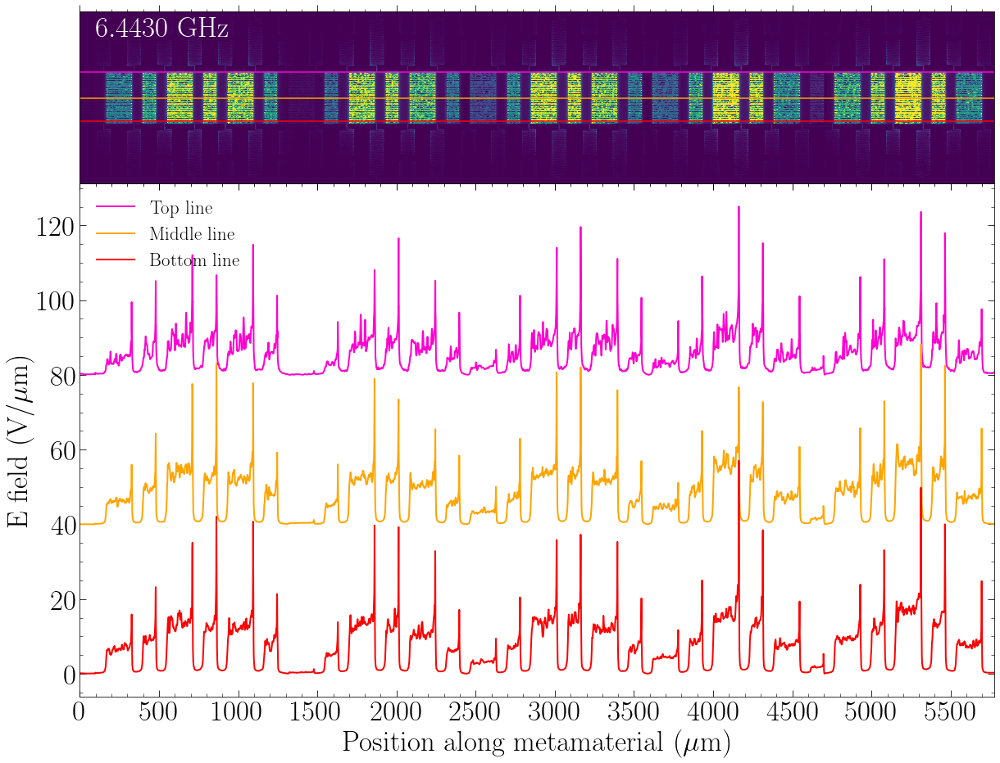

In [218]:
data5_efield_top_40 = loadtxt(r'221015_1D_efield_m5_top_Cc40.txt')
data5_efield_mid_40 = loadtxt(r'221015_1D_efield_m5_mid_Cc40.txt')
data5_efield_bot_40 = loadtxt(r'221015_1D_efield_m5_bot_Cc40.txt')

x_list2 = data1_efield_top_40[:,0] - data1_efield_top_40[:,0][0] # Same for every data

offset = 40

y_list_efield_top_40 = data5_efield_top_40[:,1]/(1e6) + 2 * offset
y_list_efield_mid_40 = data5_efield_mid_40[:,1]/(1e6) + 1 * offset
y_list_efield_bot_40 = data5_efield_bot_40[:,1]/(1e6) 

cline1 = '#ff00d1'
cline2 = 'orange'
cline3 = 'red'

fig = plt.figure(figsize=(20, 15))

gs = fig.add_gridspec(2, 1, height_ratios=(1, 3),
                      top=0.9, 
                      wspace=0.05, hspace=0)

axes2=fig.add_subplot(gs[1,0])                  # First row, second column
axes1=fig.add_subplot(gs[0,0], sharex = axes2)  # First row, first column


nrm = mpl.colors.Normalize(0, 15)

axes1.pcolormesh(x_list, y_list, z_list,
                cmap=cm.viridis, norm=nrm, shading='auto')

#axes.set_xlim(-3151.38, 2626.66)

axes1.axhline(y=251.52, color=cline1, linestyle='-', lw=1.5)
axes1.axhline(y=131.52, color=cline2, linestyle='-', lw=1.5)
axes1.axhline(y=23.52, color=cline3, linestyle='-', lw=1.5)

axes1.set_xlim(0, 5778.04)
axes1.set_ylim(-262.98, 532.02)
#axes1.set_xlabel(r'Position along metamaterial ($\mu$m)', rotation=0, fontsize=30)
#axes1.set_ylabel(r'$y$', rotation=90, fontsize=30)
axes1.tick_params(axis='both', which='major', length = 8, direction='out', labelsize=30, labelbottom=False)
axes1.tick_params(axis='both', which='minor', length = 3, direction='out', labelsize=30, labelbottom=False)
#axes1.xaxis.set_ticks(arange(0, 6000, 500))
axes1.xaxis.set_ticks_position('both')
axes1.text(100, 420, r"$6.4430$ GHz", color='white', fontsize=35)
#axes.text(-450, 8, r"$n_2 = 0$", color='white', fontsize=25)

axes1.get_yaxis().set_visible(False)
axes1.xaxis.set_minor_locator(AutoMinorLocator())

axes2.plot(x_list2, y_list_efield_top_40, color=cline1,
          linestyle='-', label=r'Top line', lw=2.0)

axes2.plot(x_list2, y_list_efield_mid_40, color=cline2,
          linestyle='-', label=r'Middle line', lw=2.0)

axes2.plot(x_list2, y_list_efield_bot_40, color=cline3,
          linestyle='-', label=r'Bottom line', lw=2.0)

          
axes2.set_xlabel(r'Position along metamaterial ($\mu$m)', rotation=0, fontsize=35)
axes2.set_ylabel(
    r'E field (V/$\mu$m)', rotation=90, fontsize=35)

axes2.tick_params(axis='both', which='major', length = 8, direction='in', labelsize=35)
axes2.tick_params(axis='both', which='minor', length = 4, direction='in', labelsize=35)
#axes.yaxis.tick_right()
axes2.xaxis.set_ticks_position('both')
axes2.yaxis.set_ticks_position('both')
axes2.legend(loc=2, fontsize=23, frameon=False)

axes2.set_xlim(0, 5778.04)
#axes.set_ylim(-140, 0)

#start, end = axes.get_ylim()
axes2.xaxis.set_ticks(arange(0, 6000, 500))
#axes.yaxis.set_ticks(arange(start, end+1, 20))

axes2.xaxis.set_minor_locator(AutoMinorLocator())
axes2.yaxis.set_minor_locator(AutoMinorLocator())

#axes.text(-900, 0.14, r"$n_2 = 1$", color='red', fontsize=25, rotation=-45)
#axes.text(-410, 0.27, r"$n_2 = 0$", color='red', fontsize=25, rotation=-45)

plt.margins(x=0.01, y=0.01)
#plt.tight_layout()
#plt.savefig('a1_ss_2d_02.pdf')
plt.show()

### (A.2.6) Mode 6 (6.4995 GHz)

In [7]:
# Data imports from 'Export\3d\'
data6_40 = loadtxt(r'220923_SUPERLATTICE_5_Cc40\Export\3d\e-field (f=6.4995) [1].txt')  # This may take a few minutes due to size of the CST data (Approx. 7 minutes).

# The file is in ASCII format:
# Columns order:     0) x (um)       1) y (um)      2) z (um)      3) ExRe (V/m)        4) ExIm (V/m)       5) EyRe (V/m)       6) EyIm (V/m)       7) EzRe (V/m)       8) EzIm (V/m)

In [221]:
# Import position columns
data_x = data6_40[:,0]
data_y = data6_40[:,1]
# Import field co6umn
data_z = abs(data6_40[:,7])/(1e6)

In [222]:
# Get X list
x_list = []
x0_meta = -3151.38 # metamaterial starts at this position
xf_meta =  2626.66 # metamaterial ends at this position
x_list.append(data_x[0] - x0_meta)
for i in range(1,len(data_x)):
    if data_x[i] != data_x[0]:
        x_list.append(data_x[i] - x0_meta)
    else:
        break

# Get Y list
y_list = []
y0_meta = -262.98 # metamaterial starts at this position
yf_meta =  532.02 # metamaterial ends at this position
y_list.append(data_y[0])
value =  data_y[0]
for i in range(1,len(data_y)):
    if data_y[i] != value:
        y_list.append(data_y[i])
        value = data_y[i]
        
# Get Z list
z_list = []
for j in range(len(y_list)):
    aux = []
    for i in range(len(x_list)):
        aux.append(data_z[i+len(x_list)*j])
    z_list.append(aux)

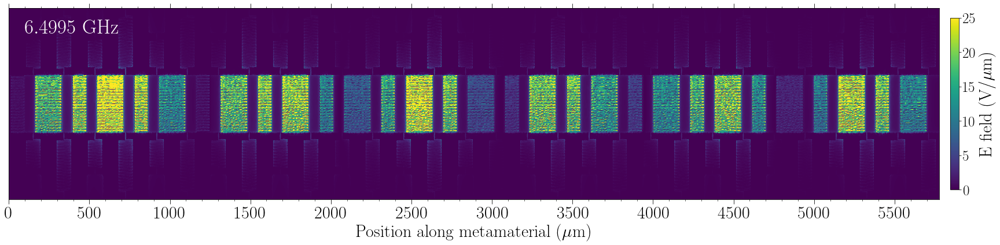

In [56]:
fig, axes = plt.subplots(1, 1, figsize=(27, 6))
nrm = mpl.colors.Normalize(0, 25)

axes.pcolormesh(x_list, y_list, z_list,
                cmap=cm.viridis, norm=nrm, shading='auto')

#axes.set_xlim(-3151.38, 2626.66)
axes.set_xlim(0, 5778.04)
axes.set_ylim(-262.98, 532.02)
axes.set_xlabel(r'Position along metamaterial ($\mu$m)', rotation=0, fontsize=30)
axes.set_ylabel(r'$y$', rotation=90, fontsize=30)
axes.tick_params(axis='both', which='major', length = 8, direction='out', labelsize=30)
axes.tick_params(axis='both', which='minor', length = 3, direction='out', labelsize=30)
axes.xaxis.set_ticks(arange(0, 6000, 500))
axes.xaxis.set_ticks_position('both')
axes.text(100, 430, r"$6.4995$ GHz", color='white', fontsize=35)
#axes.text(-450, 8, r"$n_2 = 0$", color='white', fontsize=25)

axes.get_yaxis().set_visible(False)
axes.xaxis.set_minor_locator(AutoMinorLocator())

plt.pcolormesh(x_list, y_list, z_list,
               cmap=cm.viridis, norm=nrm, shading='auto')
cbar = plt.colorbar(pad = 0.01, shrink = 0.9)
cbar.ax.tick_params(labelsize=25)
cbar.ax.set_ylabel(
    r'E field (V/$\mu$m)', rotation=90, fontsize=30)
plt.tight_layout()


#cp = axes.contour(x_list, y_list, A1_xy_list)
#axes.clabel(cp, inline=True,
 #           fontsize=16)

plt.show()

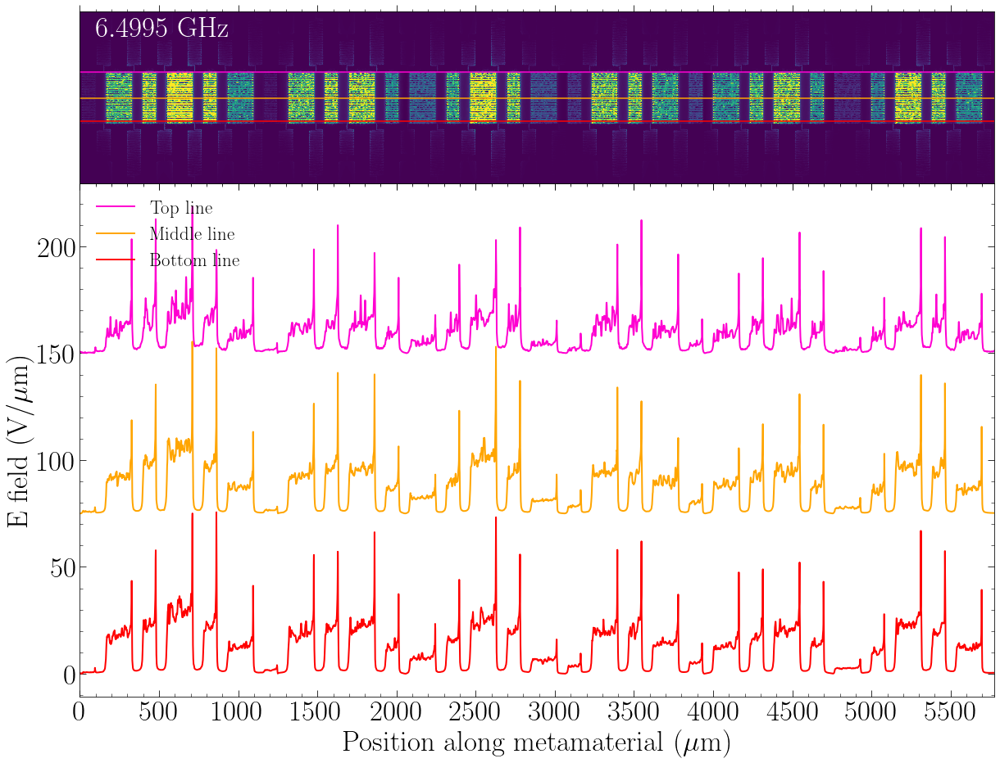

In [224]:
data6_efield_top_40 = loadtxt(r'221015_1D_efield_m6_top_Cc40.txt')
data6_efield_mid_40 = loadtxt(r'221015_1D_efield_m6_mid_Cc40.txt')
data6_efield_bot_40 = loadtxt(r'221015_1D_efield_m6_bot_Cc40.txt')

x_list2 = data1_efield_top_40[:,0] - data1_efield_top_40[:,0][0] # Same for every data

offset = 75

y_list_efield_top_40 = data6_efield_top_40[:,1]/(1e6) + 2 * offset
y_list_efield_mid_40 = data6_efield_mid_40[:,1]/(1e6) + 1 * offset
y_list_efield_bot_40 = data6_efield_bot_40[:,1]/(1e6) 

cline1 = '#ff00d1'
cline2 = 'orange'
cline3 = 'red'

fig = plt.figure(figsize=(20, 15))

gs = fig.add_gridspec(2, 1, height_ratios=(1, 3),
                      top=0.9, 
                      wspace=0.05, hspace=0)

axes2=fig.add_subplot(gs[1,0])                  # First row, second column
axes1=fig.add_subplot(gs[0,0], sharex = axes2)  # First row, first column


nrm = mpl.colors.Normalize(0, 25)

axes1.pcolormesh(x_list, y_list, z_list,
                cmap=cm.viridis, norm=nrm, shading='auto')

#axes.set_xlim(-3151.38, 2626.66)

axes1.axhline(y=251.52, color=cline1, linestyle='-', lw=1.5)
axes1.axhline(y=131.52, color=cline2, linestyle='-', lw=1.5)
axes1.axhline(y=23.52, color=cline3, linestyle='-', lw=1.5)

axes1.set_xlim(0, 5778.04)
axes1.set_ylim(-262.98, 532.02)
#axes1.set_xlabel(r'Position along metamaterial ($\mu$m)', rotation=0, fontsize=30)
#axes1.set_ylabel(r'$y$', rotation=90, fontsize=30)
axes1.tick_params(axis='both', which='major', length = 8, direction='out', labelsize=30, labelbottom=False)
axes1.tick_params(axis='both', which='minor', length = 3, direction='out', labelsize=30, labelbottom=False)
#axes1.xaxis.set_ticks(arange(0, 6000, 500))
axes1.xaxis.set_ticks_position('both')
axes1.text(100, 420, r"$6.4995$ GHz", color='white', fontsize=35)
#axes.text(-450, 8, r"$n_2 = 0$", color='white', fontsize=25)

axes1.get_yaxis().set_visible(False)
axes1.xaxis.set_minor_locator(AutoMinorLocator())

axes2.plot(x_list2, y_list_efield_top_40, color=cline1,
          linestyle='-', label=r'Top line', lw=2.0)

axes2.plot(x_list2, y_list_efield_mid_40, color=cline2,
          linestyle='-', label=r'Middle line', lw=2.0)

axes2.plot(x_list2, y_list_efield_bot_40, color=cline3,
          linestyle='-', label=r'Bottom line', lw=2.0)

          
axes2.set_xlabel(r'Position along metamaterial ($\mu$m)', rotation=0, fontsize=35)
axes2.set_ylabel(
    r'E field (V/$\mu$m)', rotation=90, fontsize=35)

axes2.tick_params(axis='both', which='major', length = 8, direction='in', labelsize=35)
axes2.tick_params(axis='both', which='minor', length = 4, direction='in', labelsize=35)
#axes.yaxis.tick_right()
axes2.xaxis.set_ticks_position('both')
axes2.yaxis.set_ticks_position('both')
axes2.legend(loc=2, fontsize=23, frameon=False)

axes2.set_xlim(0, 5778.04)
#axes.set_ylim(-140, 0)

#start, end = axes.get_ylim()
axes2.xaxis.set_ticks(arange(0, 6000, 500))
#axes.yaxis.set_ticks(arange(start, end+1, 20))

axes2.xaxis.set_minor_locator(AutoMinorLocator())
axes2.yaxis.set_minor_locator(AutoMinorLocator())

#axes.text(-900, 0.14, r"$n_2 = 1$", color='red', fontsize=25, rotation=-45)
#axes.text(-410, 0.27, r"$n_2 = 0$", color='red', fontsize=25, rotation=-45)

plt.margins(x=0.01, y=0.01)
#plt.tight_layout()
#plt.savefig('a1_ss_2d_02.pdf')
plt.show()

### (A.2.7) Mode 7 (6.5756 GHz)

In [8]:
# Data imports from 'Export\3d\'
data7_40 = loadtxt(r'220923_SUPERLATTICE_5_Cc40\Export\3d\e-field (f=6.5756) [1].txt')  # This may take a few minutes due to size of the CST data (Approx. 7 minutes).

# The file is in ASCII format:
# Columns order:     0) x (um)       1) y (um)      2) z (um)      3) ExRe (V/m)        4) ExIm (V/m)       5) EyRe (V/m)       6) EyIm (V/m)       7) EzRe (V/m)       8) EzIm (V/m)

In [225]:
# Import position columns
data_x = data7_40[:,0]
data_y = data7_40[:,1]
# Import field co6umn
data_z = abs(data7_40[:,7])/(1e6)

In [226]:
# Get X list
x_list = []
x0_meta = -3151.38 # metamaterial starts at this position
xf_meta =  2626.66 # metamaterial ends at this position
x_list.append(data_x[0] - x0_meta)
for i in range(1,len(data_x)):
    if data_x[i] != data_x[0]:
        x_list.append(data_x[i] - x0_meta)
    else:
        break

# Get Y list
y_list = []
y0_meta = -262.98 # metamaterial starts at this position
yf_meta =  532.02 # metamaterial ends at this position
y_list.append(data_y[0])
value =  data_y[0]
for i in range(1,len(data_y)):
    if data_y[i] != value:
        y_list.append(data_y[i])
        value = data_y[i]
        
# Get Z list
z_list = []
for j in range(len(y_list)):
    aux = []
    for i in range(len(x_list)):
        aux.append(data_z[i+len(x_list)*j])
    z_list.append(aux)

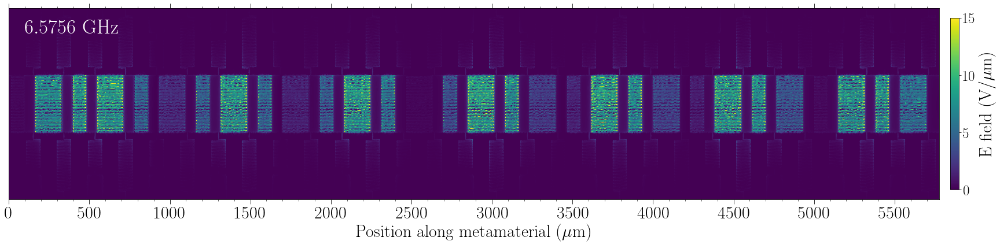

In [60]:
fig, axes = plt.subplots(1, 1, figsize=(27, 6))
nrm = mpl.colors.Normalize(0, 15)

axes.pcolormesh(x_list, y_list, z_list,
                cmap=cm.viridis, norm=nrm, shading='auto')

#axes.set_xlim(-3151.38, 2626.66)
axes.set_xlim(0, 5778.04)
axes.set_ylim(-262.98, 532.02)
axes.set_xlabel(r'Position along metamaterial ($\mu$m)', rotation=0, fontsize=30)
axes.set_ylabel(r'$y$', rotation=90, fontsize=30)
axes.tick_params(axis='both', which='major', length = 8, direction='out', labelsize=30)
axes.tick_params(axis='both', which='minor', length = 3, direction='out', labelsize=30)
axes.xaxis.set_ticks(arange(0, 6000, 500))
axes.xaxis.set_ticks_position('both')
axes.text(100, 430, r"$6.5756$ GHz", color='white', fontsize=35)
#axes.text(-450, 8, r"$n_2 = 0$", color='white', fontsize=25)

axes.get_yaxis().set_visible(False)
axes.xaxis.set_minor_locator(AutoMinorLocator())

plt.pcolormesh(x_list, y_list, z_list,
               cmap=cm.viridis, norm=nrm, shading='auto')
cbar = plt.colorbar(pad = 0.01, shrink = 0.9)
cbar.ax.tick_params(labelsize=25)
cbar.ax.set_ylabel(
    r'E field (V/$\mu$m)', rotation=90, fontsize=30)
plt.tight_layout()


#cp = axes.contour(x_list, y_list, A1_xy_list)
#axes.clabel(cp, inline=True,
 #           fontsize=16)

plt.show()

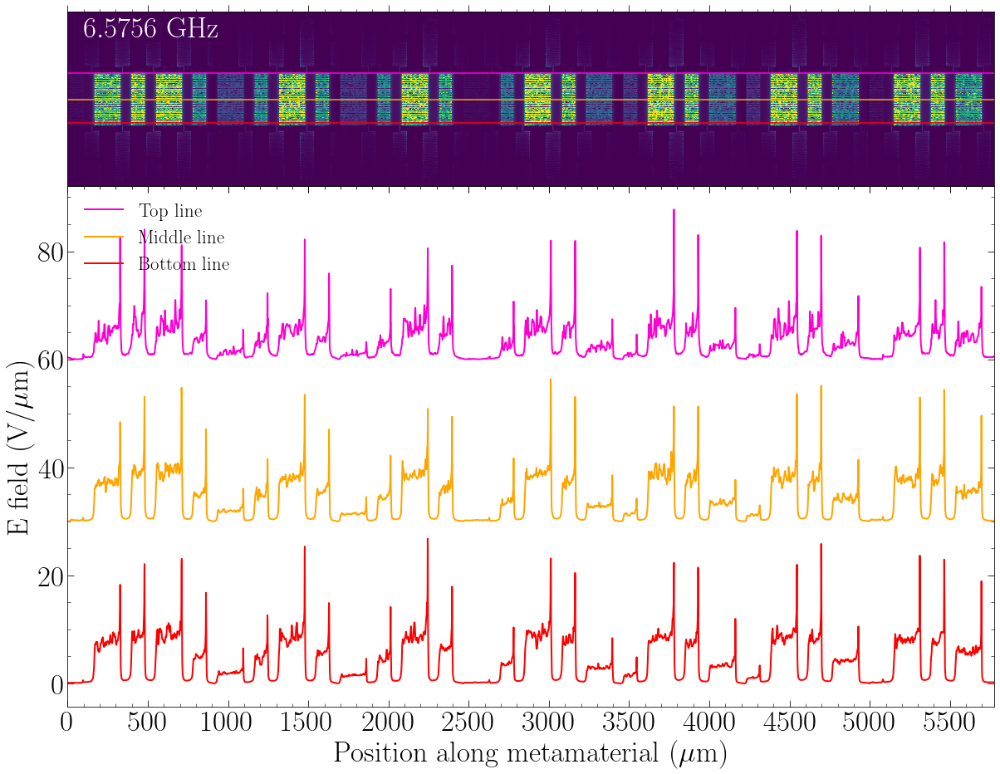

In [229]:
data7_efield_top_40 = loadtxt(r'221015_1D_efield_m7_top_Cc40.txt')
data7_efield_mid_40 = loadtxt(r'221015_1D_efield_m7_mid_Cc40.txt')
data7_efield_bot_40 = loadtxt(r'221015_1D_efield_m7_bot_Cc40.txt')

x_list2 = data1_efield_top_40[:,0] - data1_efield_top_40[:,0][0] # Same for every data

offset = 30

y_list_efield_top_40 = data7_efield_top_40[:,1]/(1e6) + 2 * offset
y_list_efield_mid_40 = data7_efield_mid_40[:,1]/(1e6) + 1 * offset
y_list_efield_bot_40 = data7_efield_bot_40[:,1]/(1e6) 

cline1 = '#ff00d1'
cline2 = 'orange'
cline3 = 'red'

fig = plt.figure(figsize=(20, 15))

gs = fig.add_gridspec(2, 1, height_ratios=(1, 3),
                      top=0.9, 
                      wspace=0.05, hspace=0)

axes2=fig.add_subplot(gs[1,0])                  # First row, second column
axes1=fig.add_subplot(gs[0,0], sharex = axes2)  # First row, first column


nrm = mpl.colors.Normalize(0, 10)

axes1.pcolormesh(x_list, y_list, z_list,
                cmap=cm.viridis, norm=nrm, shading='auto')

#axes.set_xlim(-3151.38, 2626.66)

axes1.axhline(y=251.52, color=cline1, linestyle='-', lw=1.5)
axes1.axhline(y=131.52, color=cline2, linestyle='-', lw=1.5)
axes1.axhline(y=23.52, color=cline3, linestyle='-', lw=1.5)

axes1.set_xlim(0, 5778.04)
axes1.set_ylim(-262.98, 532.02)
#axes1.set_xlabel(r'Position along metamaterial ($\mu$m)', rotation=0, fontsize=30)
#axes1.set_ylabel(r'$y$', rotation=90, fontsize=30)
axes1.tick_params(axis='both', which='major', length = 8, direction='out', labelsize=30, labelbottom=False)
axes1.tick_params(axis='both', which='minor', length = 3, direction='out', labelsize=30, labelbottom=False)
#axes1.xaxis.set_ticks(arange(0, 6000, 500))
axes1.xaxis.set_ticks_position('both')
axes1.text(100, 420, r"$6.5756$ GHz", color='white', fontsize=35)
#axes.text(-450, 8, r"$n_2 = 0$", color='white', fontsize=25)

axes1.get_yaxis().set_visible(False)
axes1.xaxis.set_minor_locator(AutoMinorLocator())

axes2.plot(x_list2, y_list_efield_top_40, color=cline1,
          linestyle='-', label=r'Top line', lw=2.0)

axes2.plot(x_list2, y_list_efield_mid_40, color=cline2,
          linestyle='-', label=r'Middle line', lw=2.0)

axes2.plot(x_list2, y_list_efield_bot_40, color=cline3,
          linestyle='-', label=r'Bottom line', lw=2.0)

          
axes2.set_xlabel(r'Position along metamaterial ($\mu$m)', rotation=0, fontsize=35)
axes2.set_ylabel(
    r'E field (V/$\mu$m)', rotation=90, fontsize=35)

axes2.tick_params(axis='both', which='major', length = 8, direction='in', labelsize=35)
axes2.tick_params(axis='both', which='minor', length = 4, direction='in', labelsize=35)
#axes.yaxis.tick_right()
axes2.xaxis.set_ticks_position('both')
axes2.yaxis.set_ticks_position('both')
axes2.legend(loc=2, fontsize=23, frameon=False)

axes2.set_xlim(0, 5778.04)
#axes.set_ylim(-140, 0)

#start, end = axes.get_ylim()
axes2.xaxis.set_ticks(arange(0, 6000, 500))
#axes.yaxis.set_ticks(arange(start, end+1, 20))

axes2.xaxis.set_minor_locator(AutoMinorLocator())
axes2.yaxis.set_minor_locator(AutoMinorLocator())

#axes.text(-900, 0.14, r"$n_2 = 1$", color='red', fontsize=25, rotation=-45)
#axes.text(-410, 0.27, r"$n_2 = 0$", color='red', fontsize=25, rotation=-45)

plt.margins(x=0.01, y=0.01)
#plt.tight_layout()
#plt.savefig('a1_ss_2d_02.pdf')
plt.show()

### (A.2.8) Mode 8 (6.6480 GHz)

In [9]:
# Data imports from 'Export\3d\'
data8_40 = loadtxt(r'220923_SUPERLATTICE_5_Cc40\Export\3d\e-field (f=6.6480) [1].txt')  # This may take a few minutes due to size of the CST data (Approx. 7 minutes).

# The file is in ASCII format:
# Columns order:     0) x (um)       1) y (um)      2) z (um)      3) ExRe (V/m)        4) ExIm (V/m)       5) EyRe (V/m)       6) EyIm (V/m)       7) EzRe (V/m)       8) EzIm (V/m)

In [230]:
# Import position columns
data_x = data8_40[:,0]
data_y = data8_40[:,1]
# Import field co6umn
data_z = abs(data8_40[:,7])/(1e6)

In [231]:
# Get X list
x_list = []
x0_meta = -3151.38 # metamaterial starts at this position
xf_meta =  2626.66 # metamaterial ends at this position
x_list.append(data_x[0] - x0_meta)
for i in range(1,len(data_x)):
    if data_x[i] != data_x[0]:
        x_list.append(data_x[i] - x0_meta)
    else:
        break

# Get Y list
y_list = []
y0_meta = -262.98 # metamaterial starts at this position
yf_meta =  532.02 # metamaterial ends at this position
y_list.append(data_y[0])
value =  data_y[0]
for i in range(1,len(data_y)):
    if data_y[i] != value:
        y_list.append(data_y[i])
        value = data_y[i]
        
# Get Z list
z_list = []
for j in range(len(y_list)):
    aux = []
    for i in range(len(x_list)):
        aux.append(data_z[i+len(x_list)*j])
    z_list.append(aux)

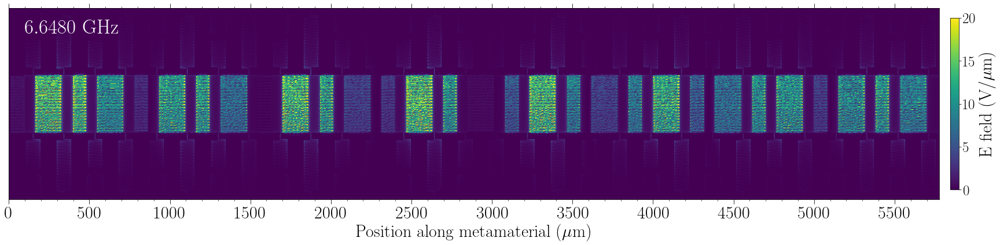

In [64]:
fig, axes = plt.subplots(1, 1, figsize=(27, 6))
nrm = mpl.colors.Normalize(0, 20)

axes.pcolormesh(x_list, y_list, z_list,
                cmap=cm.viridis, norm=nrm, shading='auto')

#axes.set_xlim(-3151.38, 2626.66)
axes.set_xlim(0, 5778.04)
axes.set_ylim(-262.98, 532.02)
axes.set_xlabel(r'Position along metamaterial ($\mu$m)', rotation=0, fontsize=30)
axes.set_ylabel(r'$y$', rotation=90, fontsize=30)
axes.tick_params(axis='both', which='major', length = 8, direction='out', labelsize=30)
axes.tick_params(axis='both', which='minor', length = 3, direction='out', labelsize=30)
axes.xaxis.set_ticks(arange(0, 6000, 500))
axes.xaxis.set_ticks_position('both')
axes.text(100, 430, r"$6.6480$ GHz", color='white', fontsize=35)
#axes.text(-450, 8, r"$n_2 = 0$", color='white', fontsize=25)

axes.get_yaxis().set_visible(False)
axes.xaxis.set_minor_locator(AutoMinorLocator())

plt.pcolormesh(x_list, y_list, z_list,
               cmap=cm.viridis, norm=nrm, shading='auto')
cbar = plt.colorbar(pad = 0.01, shrink = 0.9)
cbar.ax.tick_params(labelsize=25)
cbar.ax.set_ylabel(
    r'E field (V/$\mu$m)', rotation=90, fontsize=30)
plt.tight_layout()


#cp = axes.contour(x_list, y_list, A1_xy_list)
#axes.clabel(cp, inline=True,
 #           fontsize=16)

plt.show()

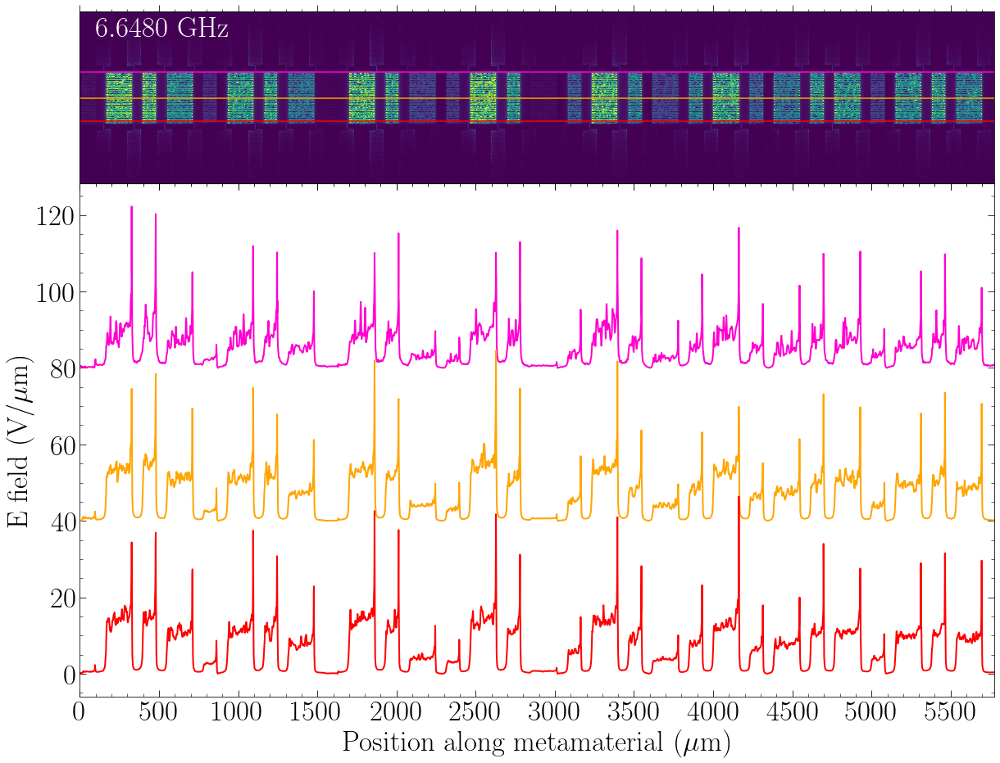

In [233]:
data8_efield_top_40 = loadtxt(r'221015_1D_efield_m8_top_Cc40.txt')
data8_efield_mid_40 = loadtxt(r'221015_1D_efield_m8_mid_Cc40.txt')
data8_efield_bot_40 = loadtxt(r'221015_1D_efield_m8_bot_Cc40.txt')

x_list2 = data1_efield_top_40[:,0] - data1_efield_top_40[:,0][0] # Same for every data

offset = 40

y_list_efield_top_40 = data8_efield_top_40[:,1]/(1e6) + 2 * offset
y_list_efield_mid_40 = data8_efield_mid_40[:,1]/(1e6) + 1 * offset
y_list_efield_bot_40 = data8_efield_bot_40[:,1]/(1e6) 

cline1 = '#ff00d1'
cline2 = 'orange'
cline3 = 'red'

fig = plt.figure(figsize=(20, 15))

gs = fig.add_gridspec(2, 1, height_ratios=(1, 3),
                      top=0.9, 
                      wspace=0.05, hspace=0)

axes2=fig.add_subplot(gs[1,0])                  # First row, second column
axes1=fig.add_subplot(gs[0,0], sharex = axes2)  # First row, first column


nrm = mpl.colors.Normalize(0, 20)

axes1.pcolormesh(x_list, y_list, z_list,
                cmap=cm.viridis, norm=nrm, shading='auto')

#axes.set_xlim(-3151.38, 2626.66)

axes1.axhline(y=251.52, color=cline1, linestyle='-', lw=1.5)
axes1.axhline(y=131.52, color=cline2, linestyle='-', lw=1.5)
axes1.axhline(y=23.52, color=cline3, linestyle='-', lw=1.5)

axes1.set_xlim(0, 5778.04)
axes1.set_ylim(-262.98, 532.02)
#axes1.set_xlabel(r'Position along metamaterial ($\mu$m)', rotation=0, fontsize=30)
#axes1.set_ylabel(r'$y$', rotation=90, fontsize=30)
axes1.tick_params(axis='both', which='major', length = 8, direction='out', labelsize=30, labelbottom=False)
axes1.tick_params(axis='both', which='minor', length = 3, direction='out', labelsize=30, labelbottom=False)
#axes1.xaxis.set_ticks(arange(0, 6000, 500))
axes1.xaxis.set_ticks_position('both')
axes1.text(100, 420, r"$6.6480$ GHz", color='white', fontsize=35)
#axes.text(-450, 8, r"$n_2 = 0$", color='white', fontsize=25)

axes1.get_yaxis().set_visible(False)
axes1.xaxis.set_minor_locator(AutoMinorLocator())

axes2.plot(x_list2, y_list_efield_top_40, color=cline1,
          linestyle='-', label=r'Top line', lw=2.0)

axes2.plot(x_list2, y_list_efield_mid_40, color=cline2,
          linestyle='-', label=r'Middle line', lw=2.0)

axes2.plot(x_list2, y_list_efield_bot_40, color=cline3,
          linestyle='-', label=r'Bottom line', lw=2.0)

          
axes2.set_xlabel(r'Position along metamaterial ($\mu$m)', rotation=0, fontsize=35)
axes2.set_ylabel(
    r'E field (V/$\mu$m)', rotation=90, fontsize=35)

axes2.tick_params(axis='both', which='major', length = 8, direction='in', labelsize=35)
axes2.tick_params(axis='both', which='minor', length = 4, direction='in', labelsize=35)
#axes.yaxis.tick_right()
axes2.xaxis.set_ticks_position('both')
axes2.yaxis.set_ticks_position('both')
#axes2.legend(loc=2, fontsize=23, frameon=False)

axes2.set_xlim(0, 5778.04)
#axes.set_ylim(-140, 0)

#start, end = axes.get_ylim()
axes2.xaxis.set_ticks(arange(0, 6000, 500))
#axes.yaxis.set_ticks(arange(start, end+1, 20))

axes2.xaxis.set_minor_locator(AutoMinorLocator())
axes2.yaxis.set_minor_locator(AutoMinorLocator())

#axes.text(-900, 0.14, r"$n_2 = 1$", color='red', fontsize=25, rotation=-45)
#axes.text(-410, 0.27, r"$n_2 = 0$", color='red', fontsize=25, rotation=-45)

plt.margins(x=0.01, y=0.01)
#plt.tight_layout()
#plt.savefig('a1_ss_2d_02.pdf')
plt.show()

### (A.2.9) Mode 9 (6.7456 GHz)

In [10]:
# Data imports from 'Export\3d\'
data9_40 = loadtxt(r'220923_SUPERLATTICE_5_Cc40\Export\3d\e-field (f=6.7456) [1].txt')  # This may take a few minutes due to size of the CST data (Approx. 7 minutes).

# The file is in ASCII format:
# Columns order:     0) x (um)       1) y (um)      2) z (um)      3) ExRe (V/m)        4) ExIm (V/m)       5) EyRe (V/m)       6) EyIm (V/m)       7) EzRe (V/m)       8) EzIm (V/m)

In [234]:
# Import position columns
data_x = data9_40[:,0]
data_y = data9_40[:,1]
# Import field co6umn
data_z = abs(data9_40[:,7])/(1e6)

In [235]:
# Get X list
x_list = []
x0_meta = -3151.38 # metamaterial starts at this position
xf_meta =  2626.66 # metamaterial ends at this position
x_list.append(data_x[0] - x0_meta)
for i in range(1,len(data_x)):
    if data_x[i] != data_x[0]:
        x_list.append(data_x[i] - x0_meta)
    else:
        break

# Get Y list
y_list = []
y0_meta = -262.98 # metamaterial starts at this position
yf_meta =  532.02 # metamaterial ends at this position
y_list.append(data_y[0])
value =  data_y[0]
for i in range(1,len(data_y)):
    if data_y[i] != value:
        y_list.append(data_y[i])
        value = data_y[i]
        
# Get Z list
z_list = []
for j in range(len(y_list)):
    aux = []
    for i in range(len(x_list)):
        aux.append(data_z[i+len(x_list)*j])
    z_list.append(aux)

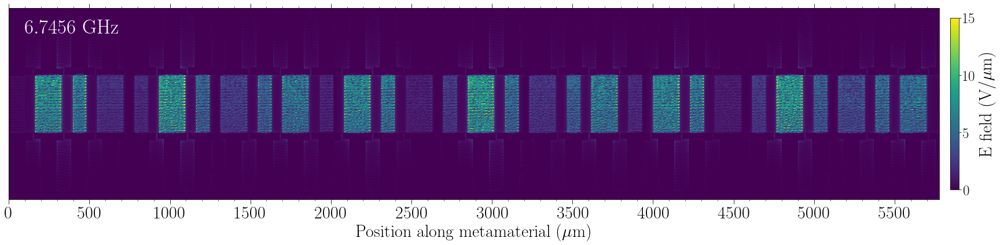

In [68]:
fig, axes = plt.subplots(1, 1, figsize=(27, 6))
nrm = mpl.colors.Normalize(0, 15)

axes.pcolormesh(x_list, y_list, z_list,
                cmap=cm.viridis, norm=nrm, shading='auto')

#axes.set_xlim(-3151.38, 2626.66)
axes.set_xlim(0, 5778.04)
axes.set_ylim(-262.98, 532.02)
axes.set_xlabel(r'Position along metamaterial ($\mu$m)', rotation=0, fontsize=30)
axes.set_ylabel(r'$y$', rotation=90, fontsize=30)
axes.tick_params(axis='both', which='major', length = 8, direction='out', labelsize=30)
axes.tick_params(axis='both', which='minor', length = 3, direction='out', labelsize=30)
axes.xaxis.set_ticks(arange(0, 6000, 500))
axes.xaxis.set_ticks_position('both')
axes.text(100, 430, r"$6.7456$ GHz", color='white', fontsize=35)
#axes.text(-450, 8, r"$n_2 = 0$", color='white', fontsize=25)

axes.get_yaxis().set_visible(False)
axes.xaxis.set_minor_locator(AutoMinorLocator())

plt.pcolormesh(x_list, y_list, z_list,
               cmap=cm.viridis, norm=nrm, shading='auto')
cbar = plt.colorbar(pad = 0.01, shrink = 0.9)
cbar.ax.tick_params(labelsize=25)
cbar.ax.set_ylabel(
    r'E field (V/$\mu$m)', rotation=90, fontsize=30)
plt.tight_layout()


#cp = axes.contour(x_list, y_list, A1_xy_list)
#axes.clabel(cp, inline=True,
 #           fontsize=16)

plt.show()

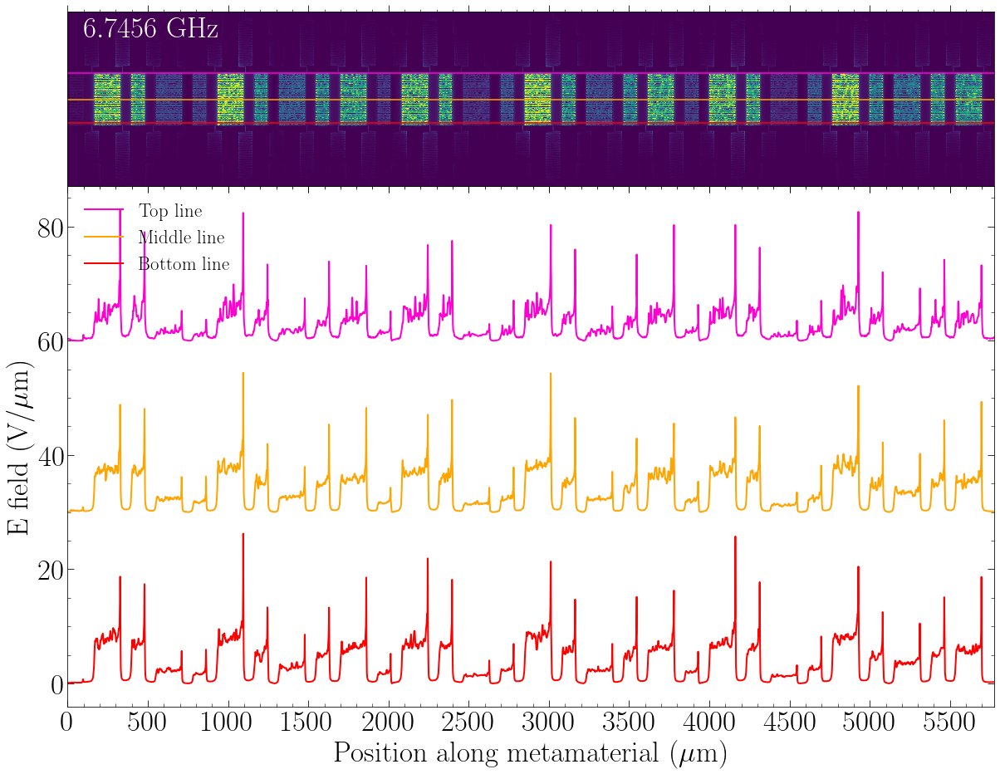

In [237]:
data9_efield_top_40 = loadtxt(r'221015_1D_efield_m9_top_Cc40.txt')
data9_efield_mid_40 = loadtxt(r'221015_1D_efield_m9_mid_Cc40.txt')
data9_efield_bot_40 = loadtxt(r'221015_1D_efield_m9_bot_Cc40.txt')

x_list2 = data1_efield_top_40[:,0] - data1_efield_top_40[:,0][0] # Same for every data

offset = 30

y_list_efield_top_40 = data9_efield_top_40[:,1]/(1e6) + 2 * offset
y_list_efield_mid_40 = data9_efield_mid_40[:,1]/(1e6) + 1 * offset
y_list_efield_bot_40 = data9_efield_bot_40[:,1]/(1e6) 

cline1 = '#ff00d1'
cline2 = 'orange'
cline3 = 'red'

fig = plt.figure(figsize=(20, 15))

gs = fig.add_gridspec(2, 1, height_ratios=(1, 3),
                      top=0.9, 
                      wspace=0.05, hspace=0)

axes2=fig.add_subplot(gs[1,0])                  # First row, second column
axes1=fig.add_subplot(gs[0,0], sharex = axes2)  # First row, first column


nrm = mpl.colors.Normalize(0, 10)

axes1.pcolormesh(x_list, y_list, z_list,
                cmap=cm.viridis, norm=nrm, shading='auto')

#axes.set_xlim(-3151.38, 2626.66)

axes1.axhline(y=251.52, color=cline1, linestyle='-', lw=1.5)
axes1.axhline(y=131.52, color=cline2, linestyle='-', lw=1.5)
axes1.axhline(y=23.52, color=cline3, linestyle='-', lw=1.5)

axes1.set_xlim(0, 5778.04)
axes1.set_ylim(-262.98, 532.02)
#axes1.set_xlabel(r'Position along metamaterial ($\mu$m)', rotation=0, fontsize=30)
#axes1.set_ylabel(r'$y$', rotation=90, fontsize=30)
axes1.tick_params(axis='both', which='major', length = 8, direction='out', labelsize=30, labelbottom=False)
axes1.tick_params(axis='both', which='minor', length = 3, direction='out', labelsize=30, labelbottom=False)
#axes1.xaxis.set_ticks(arange(0, 6000, 500))
axes1.xaxis.set_ticks_position('both')
axes1.text(100, 420, r"$6.7456$ GHz", color='white', fontsize=35)
#axes.text(-450, 8, r"$n_2 = 0$", color='white', fontsize=25)

axes1.get_yaxis().set_visible(False)
axes1.xaxis.set_minor_locator(AutoMinorLocator())

axes2.plot(x_list2, y_list_efield_top_40, color=cline1,
          linestyle='-', label=r'Top line', lw=2.0)

axes2.plot(x_list2, y_list_efield_mid_40, color=cline2,
          linestyle='-', label=r'Middle line', lw=2.0)

axes2.plot(x_list2, y_list_efield_bot_40, color=cline3,
          linestyle='-', label=r'Bottom line', lw=2.0)

          
axes2.set_xlabel(r'Position along metamaterial ($\mu$m)', rotation=0, fontsize=35)
axes2.set_ylabel(
    r'E field (V/$\mu$m)', rotation=90, fontsize=35)

axes2.tick_params(axis='both', which='major', length = 8, direction='in', labelsize=35)
axes2.tick_params(axis='both', which='minor', length = 4, direction='in', labelsize=35)
#axes.yaxis.tick_right()
axes2.xaxis.set_ticks_position('both')
axes2.yaxis.set_ticks_position('both')
axes2.legend(loc=2, fontsize=23, frameon=False)

axes2.set_xlim(0, 5778.04)
#axes.set_ylim(-140, 0)

#start, end = axes.get_ylim()
axes2.xaxis.set_ticks(arange(0, 6000, 500))
#axes.yaxis.set_ticks(arange(start, end+1, 20))

axes2.xaxis.set_minor_locator(AutoMinorLocator())
axes2.yaxis.set_minor_locator(AutoMinorLocator())

#axes.text(-900, 0.14, r"$n_2 = 1$", color='red', fontsize=25, rotation=-45)
#axes.text(-410, 0.27, r"$n_2 = 0$", color='red', fontsize=25, rotation=-45)

plt.margins(x=0.01, y=0.01)
#plt.tight_layout()
#plt.savefig('a1_ss_2d_02.pdf')
plt.show()

### (A.2.10) Mode 10 (6.8339 GHz)

In [11]:
# Data imports from 'Export\3d\'
data10_40 = loadtxt(r'220923_SUPERLATTICE_5_Cc40\Export\3d\e-field (f=6.8339) [1].txt')  # This may take a few minutes due to size of the CST data (Approx. 7 minutes).

# The file is in ASCII format:
# Columns order:     0) x (um)       1) y (um)      2) z (um)      3) ExRe (V/m)        4) ExIm (V/m)       5) EyRe (V/m)       6) EyIm (V/m)       7) EzRe (V/m)       8) EzIm (V/m)

In [242]:
# Import position columns
data_x = data10_40[:,0]
data_y = data10_40[:,1]
# Import field co6umn
data_z = abs(data10_40[:,7])/(1e6)

In [243]:
# Get X list
x_list = []
x0_meta = -3151.38 # metamaterial starts at this position
xf_meta =  2626.66 # metamaterial ends at this position
x_list.append(data_x[0] - x0_meta)
for i in range(1,len(data_x)):
    if data_x[i] != data_x[0]:
        x_list.append(data_x[i] - x0_meta)
    else:
        break

# Get Y list
y_list = []
y0_meta = -262.98 # metamaterial starts at this position
yf_meta =  532.02 # metamaterial ends at this position
y_list.append(data_y[0])
value =  data_y[0]
for i in range(1,len(data_y)):
    if data_y[i] != value:
        y_list.append(data_y[i])
        value = data_y[i]
        
# Get Z list
z_list = []
for j in range(len(y_list)):
    aux = []
    for i in range(len(x_list)):
        aux.append(data_z[i+len(x_list)*j])
    z_list.append(aux)

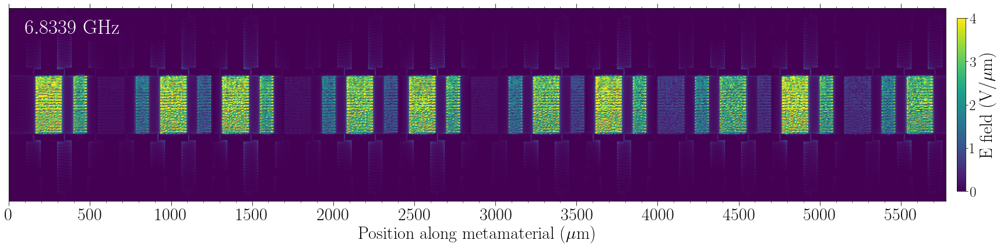

In [245]:
fig, axes = plt.subplots(1, 1, figsize=(27, 6))
nrm = mpl.colors.Normalize(0, 4)

axes.pcolormesh(x_list, y_list, z_list,
                cmap=cm.viridis, norm=nrm, shading='auto')

#axes.set_xlim(-3151.38, 2626.66)
axes.set_xlim(0, 5778.04)
axes.set_ylim(-262.98, 532.02)
axes.set_xlabel(r'Position along metamaterial ($\mu$m)', rotation=0, fontsize=30)
axes.set_ylabel(r'$y$', rotation=90, fontsize=30)
axes.tick_params(axis='both', which='major', length = 8, direction='out', labelsize=30)
axes.tick_params(axis='both', which='minor', length = 3, direction='out', labelsize=30)
axes.xaxis.set_ticks(arange(0, 6000, 500))
axes.xaxis.set_ticks_position('both')
axes.text(100, 430, r"$6.8339$ GHz", color='white', fontsize=35)
#axes.text(-450, 8, r"$n_2 = 0$", color='white', fontsize=25)

axes.get_yaxis().set_visible(False)
axes.xaxis.set_minor_locator(AutoMinorLocator())

plt.pcolormesh(x_list, y_list, z_list,
               cmap=cm.viridis, norm=nrm, shading='auto')
cbar = plt.colorbar(pad = 0.01, shrink = 0.9)
cbar.ax.tick_params(labelsize=25)
cbar.ax.set_ylabel(
    r'E field (V/$\mu$m)', rotation=90, fontsize=30)
plt.tight_layout()


#cp = axes.contour(x_list, y_list, A1_xy_list)
#axes.clabel(cp, inline=True,
 #           fontsize=16)

plt.show()

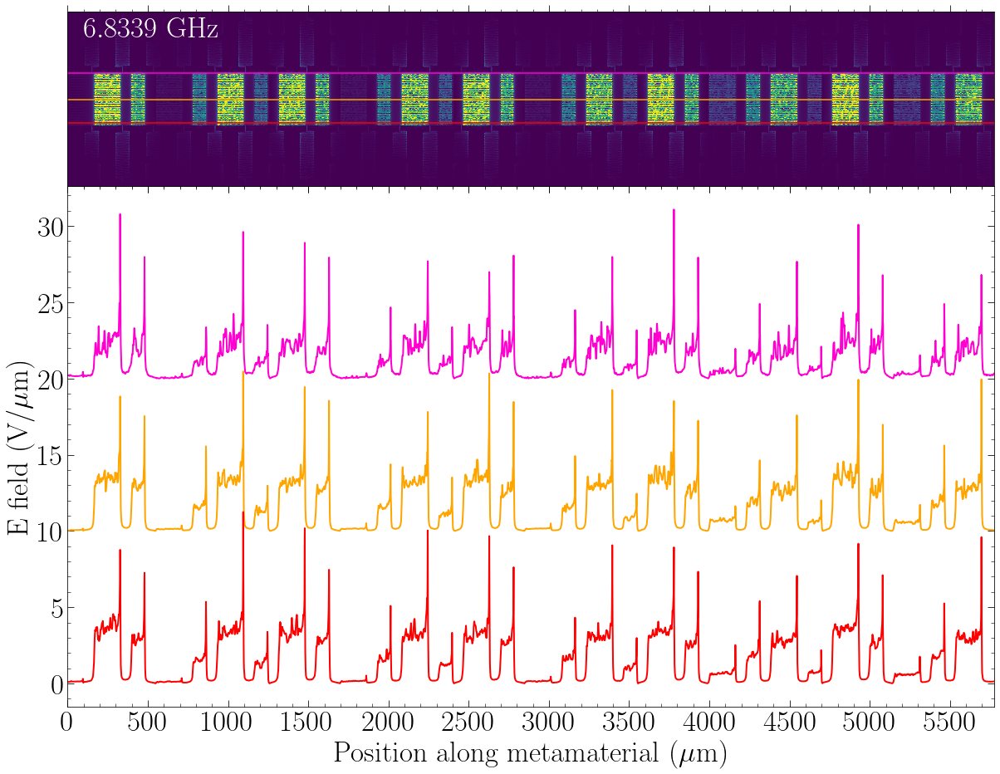

In [247]:
data10_efield_top_40 = loadtxt(r'221015_1D_efield_m10_top_Cc40.txt')
data10_efield_mid_40 = loadtxt(r'221015_1D_efield_m10_mid_Cc40.txt')
data10_efield_bot_40 = loadtxt(r'221015_1D_efield_m10_bot_Cc40.txt')

x_list2 = data1_efield_top_40[:,0] - data1_efield_top_40[:,0][0] # Same for every data

offset = 10

y_list_efield_top_40 = data10_efield_top_40[:,1]/(1e6) + 2 * offset
y_list_efield_mid_40 = data10_efield_mid_40[:,1]/(1e6) + 1 * offset
y_list_efield_bot_40 = data10_efield_bot_40[:,1]/(1e6) 

cline1 = '#ff00d1'
cline2 = 'orange'
cline3 = 'red'

fig = plt.figure(figsize=(20, 15))

gs = fig.add_gridspec(2, 1, height_ratios=(1, 3),
                      top=0.9, 
                      wspace=0.05, hspace=0)

axes2=fig.add_subplot(gs[1,0])                  # First row, second column
axes1=fig.add_subplot(gs[0,0], sharex = axes2)  # First row, first column


nrm = mpl.colors.Normalize(0, 4)

axes1.pcolormesh(x_list, y_list, z_list,
                cmap=cm.viridis, norm=nrm, shading='auto')

#axes.set_xlim(-3151.38, 2626.66)

axes1.axhline(y=251.52, color=cline1, linestyle='-', lw=1.5)
axes1.axhline(y=131.52, color=cline2, linestyle='-', lw=1.5)
axes1.axhline(y=23.52, color=cline3, linestyle='-', lw=1.5)

axes1.set_xlim(0, 5778.04)
axes1.set_ylim(-262.98, 532.02)
#axes1.set_xlabel(r'Position along metamaterial ($\mu$m)', rotation=0, fontsize=30)
#axes1.set_ylabel(r'$y$', rotation=90, fontsize=30)
axes1.tick_params(axis='both', which='major', length = 8, direction='out', labelsize=30, labelbottom=False)
axes1.tick_params(axis='both', which='minor', length = 3, direction='out', labelsize=30, labelbottom=False)
#axes1.xaxis.set_ticks(arange(0, 6000, 500))
axes1.xaxis.set_ticks_position('both')
axes1.text(100, 420, r"$6.8339$ GHz", color='white', fontsize=35)
#axes.text(-450, 8, r"$n_2 = 0$", color='white', fontsize=25)

axes1.get_yaxis().set_visible(False)
axes1.xaxis.set_minor_locator(AutoMinorLocator())

axes2.plot(x_list2, y_list_efield_top_40, color=cline1,
          linestyle='-', label=r'Top line', lw=2.0)

axes2.plot(x_list2, y_list_efield_mid_40, color=cline2,
          linestyle='-', label=r'Middle line', lw=2.0)

axes2.plot(x_list2, y_list_efield_bot_40, color=cline3,
          linestyle='-', label=r'Bottom line', lw=2.0)

          
axes2.set_xlabel(r'Position along metamaterial ($\mu$m)', rotation=0, fontsize=35)
axes2.set_ylabel(
    r'E field (V/$\mu$m)', rotation=90, fontsize=35)

axes2.tick_params(axis='both', which='major', length = 8, direction='in', labelsize=35)
axes2.tick_params(axis='both', which='minor', length = 4, direction='in', labelsize=35)
#axes.yaxis.tick_right()
axes2.xaxis.set_ticks_position('both')
axes2.yaxis.set_ticks_position('both')
#axes2.legend(loc=2, fontsize=23, frameon=False)

axes2.set_xlim(0, 5778.04)
#axes.set_ylim(-140, 0)

#start, end = axes.get_ylim()
axes2.xaxis.set_ticks(arange(0, 6000, 500))
#axes.yaxis.set_ticks(arange(start, end+1, 20))

axes2.xaxis.set_minor_locator(AutoMinorLocator())
axes2.yaxis.set_minor_locator(AutoMinorLocator())

#axes.text(-900, 0.14, r"$n_2 = 1$", color='red', fontsize=25, rotation=-45)
#axes.text(-410, 0.27, r"$n_2 = 0$", color='red', fontsize=25, rotation=-45)

plt.margins(x=0.01, y=0.01)
#plt.tight_layout()
#plt.savefig('a1_ss_2d_02.pdf')
plt.show()

### (A.2.11) Mode 11 (6.9396 GHz)

In [12]:
# Data imports from 'Export\3d\'
data11_40 = loadtxt(r'220923_SUPERLATTICE_5_Cc40\Export\3d\e-field (f=6.9396) [1].txt')  # This may take a few minutes due to size of the CST data (Approx. 7 minutes).

# The file is in ASCII format:
# Columns order:     0) x (um)       1) y (um)      2) z (um)      3) ExRe (V/m)        4) ExIm (V/m)       5) EyRe (V/m)       6) EyIm (V/m)       7) EzRe (V/m)       8) EzIm (V/m)

In [248]:
# Import position columns
data_x = data11_40[:,0]
data_y = data11_40[:,1]
# Import field co6umn
data_z = abs(data11_40[:,7])/(1e6)

In [249]:
# Get X list
x_list = []
x0_meta = -3151.38 # metamaterial starts at this position
xf_meta =  2626.66 # metamaterial ends at this position
x_list.append(data_x[0] - x0_meta)
for i in range(1,len(data_x)):
    if data_x[i] != data_x[0]:
        x_list.append(data_x[i] - x0_meta)
    else:
        break

# Get Y list
y_list = []
y0_meta = -262.98 # metamaterial starts at this position
yf_meta =  532.02 # metamaterial ends at this position
y_list.append(data_y[0])
value =  data_y[0]
for i in range(1,len(data_y)):
    if data_y[i] != value:
        y_list.append(data_y[i])
        value = data_y[i]
        
# Get Z list
z_list = []
for j in range(len(y_list)):
    aux = []
    for i in range(len(x_list)):
        aux.append(data_z[i+len(x_list)*j])
    z_list.append(aux)

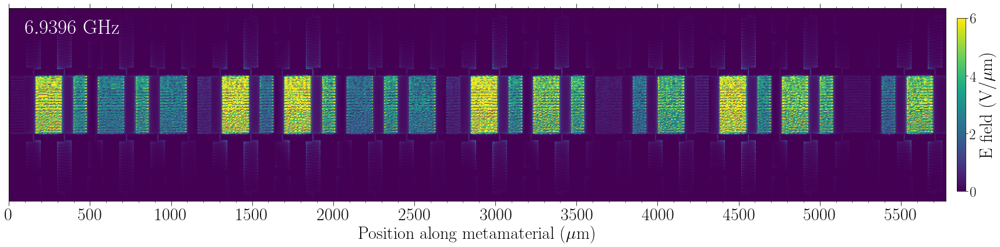

In [77]:
fig, axes = plt.subplots(1, 1, figsize=(27, 6))
nrm = mpl.colors.Normalize(0, 6)

axes.pcolormesh(x_list, y_list, z_list,
                cmap=cm.viridis, norm=nrm, shading='auto')

#axes.set_xlim(-3151.38, 2626.66)
axes.set_xlim(0, 5778.04)
axes.set_ylim(-262.98, 532.02)
axes.set_xlabel(r'Position along metamaterial ($\mu$m)', rotation=0, fontsize=30)
axes.set_ylabel(r'$y$', rotation=90, fontsize=30)
axes.tick_params(axis='both', which='major', length = 8, direction='out', labelsize=30)
axes.tick_params(axis='both', which='minor', length = 3, direction='out', labelsize=30)
axes.xaxis.set_ticks(arange(0, 6000, 500))
axes.xaxis.set_ticks_position('both')
axes.text(100, 430, r"$6.9396$ GHz", color='white', fontsize=35)
#axes.text(-450, 8, r"$n_2 = 0$", color='white', fontsize=25)

axes.get_yaxis().set_visible(False)
axes.xaxis.set_minor_locator(AutoMinorLocator())

plt.pcolormesh(x_list, y_list, z_list,
               cmap=cm.viridis, norm=nrm, shading='auto')
cbar = plt.colorbar(pad = 0.01, shrink = 0.9)
cbar.ax.tick_params(labelsize=25)
cbar.ax.set_ylabel(
    r'E field (V/$\mu$m)', rotation=90, fontsize=30)
plt.tight_layout()


#cp = axes.contour(x_list, y_list, A1_xy_list)
#axes.clabel(cp, inline=True,
 #           fontsize=16)

plt.show()

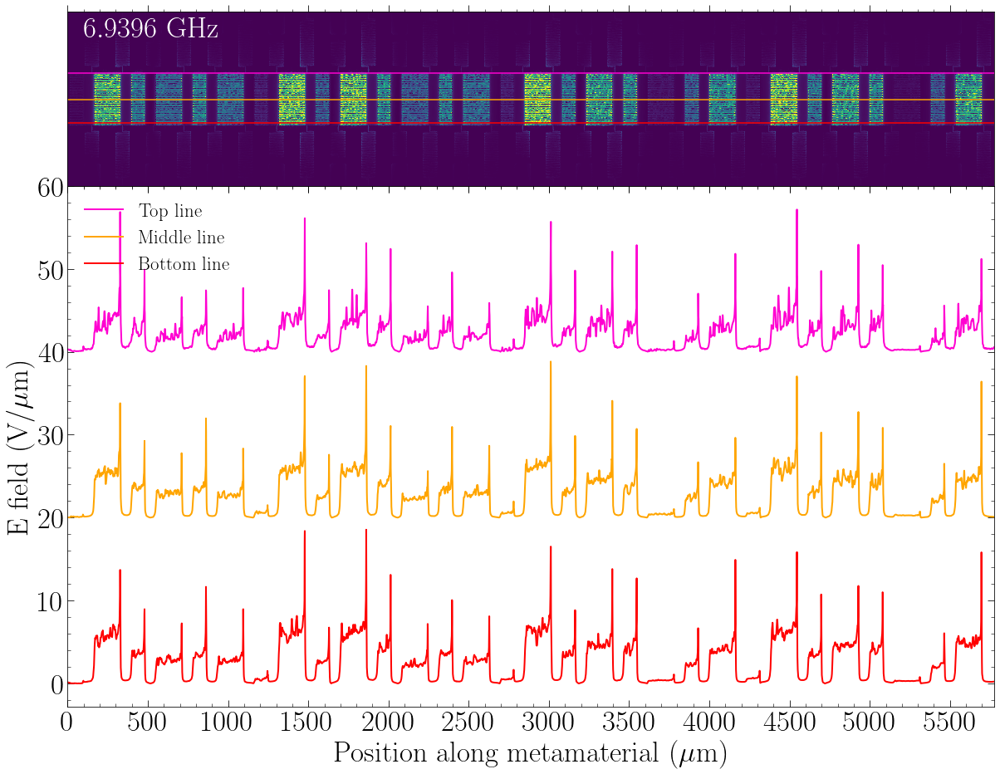

In [252]:
data11_efield_top_40 = loadtxt(r'221015_1D_efield_m11_top_Cc40.txt')
data11_efield_mid_40 = loadtxt(r'221015_1D_efield_m11_mid_Cc40.txt')
data11_efield_bot_40 = loadtxt(r'221015_1D_efield_m11_bot_Cc40.txt')

x_list2 = data1_efield_top_40[:,0] - data1_efield_top_40[:,0][0] # Same for every data

offset = 20

y_list_efield_top_40 = data11_efield_top_40[:,1]/(1e6) + 2 * offset
y_list_efield_mid_40 = data11_efield_mid_40[:,1]/(1e6) + 1 * offset
y_list_efield_bot_40 = data11_efield_bot_40[:,1]/(1e6) 

cline1 = '#ff00d1'
cline2 = 'orange'
cline3 = 'red'

fig = plt.figure(figsize=(20, 15))

gs = fig.add_gridspec(2, 1, height_ratios=(1, 3),
                      top=0.9, 
                      wspace=0.05, hspace=0)

axes2=fig.add_subplot(gs[1,0])                  # First row, second column
axes1=fig.add_subplot(gs[0,0], sharex = axes2)  # First row, first column


nrm = mpl.colors.Normalize(0, 8)

axes1.pcolormesh(x_list, y_list, z_list,
                cmap=cm.viridis, norm=nrm, shading='auto')

#axes.set_xlim(-3151.38, 2626.66)

axes1.axhline(y=251.52, color=cline1, linestyle='-', lw=1.5)
axes1.axhline(y=131.52, color=cline2, linestyle='-', lw=1.5)
axes1.axhline(y=23.52, color=cline3, linestyle='-', lw=1.5)

axes1.set_xlim(0, 5778.04)
axes1.set_ylim(-262.98, 532.02)
#axes1.set_xlabel(r'Position along metamaterial ($\mu$m)', rotation=0, fontsize=30)
#axes1.set_ylabel(r'$y$', rotation=90, fontsize=30)
axes1.tick_params(axis='both', which='major', length = 8, direction='out', labelsize=30, labelbottom=False)
axes1.tick_params(axis='both', which='minor', length = 3, direction='out', labelsize=30, labelbottom=False)
#axes1.xaxis.set_ticks(arange(0, 6000, 500))
axes1.xaxis.set_ticks_position('both')
axes1.text(100, 420, r"$6.9396$ GHz", color='white', fontsize=35)
#axes.text(-450, 8, r"$n_2 = 0$", color='white', fontsize=25)

axes1.get_yaxis().set_visible(False)
axes1.xaxis.set_minor_locator(AutoMinorLocator())

axes2.plot(x_list2, y_list_efield_top_40, color=cline1,
          linestyle='-', label=r'Top line', lw=2.0)

axes2.plot(x_list2, y_list_efield_mid_40, color=cline2,
          linestyle='-', label=r'Middle line', lw=2.0)

axes2.plot(x_list2, y_list_efield_bot_40, color=cline3,
          linestyle='-', label=r'Bottom line', lw=2.0)

          
axes2.set_xlabel(r'Position along metamaterial ($\mu$m)', rotation=0, fontsize=35)
axes2.set_ylabel(
    r'E field (V/$\mu$m)', rotation=90, fontsize=35)

axes2.tick_params(axis='both', which='major', length = 8, direction='in', labelsize=35)
axes2.tick_params(axis='both', which='minor', length = 4, direction='in', labelsize=35)
#axes.yaxis.tick_right()
axes2.xaxis.set_ticks_position('both')
axes2.yaxis.set_ticks_position('both')
axes2.legend(loc=2, fontsize=23, frameon=False)

axes2.set_xlim(0, 5778.04)
#axes.set_ylim(-140, 0)

#start, end = axes.get_ylim()
axes2.xaxis.set_ticks(arange(0, 6000, 500))
#axes.yaxis.set_ticks(arange(start, end+1, 20))

axes2.xaxis.set_minor_locator(AutoMinorLocator())
axes2.yaxis.set_minor_locator(AutoMinorLocator())

#axes.text(-900, 0.14, r"$n_2 = 1$", color='red', fontsize=25, rotation=-45)
#axes.text(-410, 0.27, r"$n_2 = 0$", color='red', fontsize=25, rotation=-45)

plt.margins(x=0.01, y=0.01)
#plt.tight_layout()
#plt.savefig('a1_ss_2d_02.pdf')
plt.show()

### (A.2.12) Mode 12 (7.0286 GHz)

In [13]:
# Data imports from 'Export\3d\'
data12_40 = loadtxt(r'220923_SUPERLATTICE_5_Cc40\Export\3d\e-field (f=7.0286) [1].txt')  # This may take a few minutes due to size of the CST data (Approx. 7 minutes).

# The file is in ASCII format:
# Columns order:     0) x (um)       1) y (um)      2) z (um)      3) ExRe (V/m)        4) ExIm (V/m)       5) EyRe (V/m)       6) EyIm (V/m)       7) EzRe (V/m)       8) EzIm (V/m)

In [253]:
# Import position columns
data_x = data12_40[:,0]
data_y = data12_40[:,1]
# Import field co6umn
data_z = abs(data12_40[:,7])/(1e6)

In [254]:
# Get X list
x_list = []
x0_meta = -3151.38 # metamaterial starts at this position
xf_meta =  2626.66 # metamaterial ends at this position
x_list.append(data_x[0] - x0_meta)
for i in range(1,len(data_x)):
    if data_x[i] != data_x[0]:
        x_list.append(data_x[i] - x0_meta)
    else:
        break

# Get Y list
y_list = []
y0_meta = -262.98 # metamaterial starts at this position
yf_meta =  532.02 # metamaterial ends at this position
y_list.append(data_y[0])
value =  data_y[0]
for i in range(1,len(data_y)):
    if data_y[i] != value:
        y_list.append(data_y[i])
        value = data_y[i]
        
# Get Z list
z_list = []
for j in range(len(y_list)):
    aux = []
    for i in range(len(x_list)):
        aux.append(data_z[i+len(x_list)*j])
    z_list.append(aux)

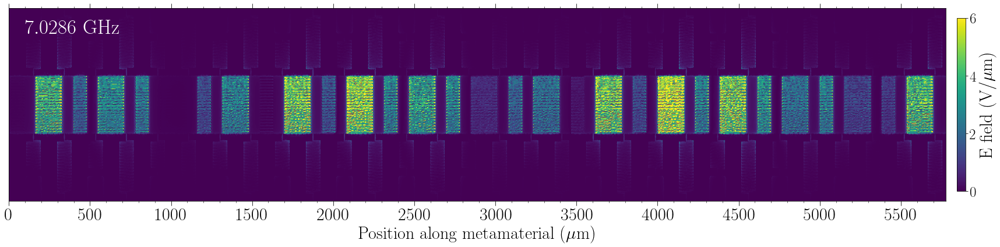

In [82]:
fig, axes = plt.subplots(1, 1, figsize=(27, 6))
nrm = mpl.colors.Normalize(0, 6)

axes.pcolormesh(x_list, y_list, z_list,
                cmap=cm.viridis, norm=nrm, shading='auto')

#axes.set_xlim(-3151.38, 2626.66)
axes.set_xlim(0, 5778.04)
axes.set_ylim(-262.98, 532.02)
axes.set_xlabel(r'Position along metamaterial ($\mu$m)', rotation=0, fontsize=30)
axes.set_ylabel(r'$y$', rotation=90, fontsize=30)
axes.tick_params(axis='both', which='major', length = 8, direction='out', labelsize=30)
axes.tick_params(axis='both', which='minor', length = 3, direction='out', labelsize=30)
axes.xaxis.set_ticks(arange(0, 6000, 500))
axes.xaxis.set_ticks_position('both')
axes.text(100, 430, r"$7.0286$ GHz", color='white', fontsize=35)
#axes.text(-450, 8, r"$n_2 = 0$", color='white', fontsize=25)

axes.get_yaxis().set_visible(False)
axes.xaxis.set_minor_locator(AutoMinorLocator())

plt.pcolormesh(x_list, y_list, z_list,
               cmap=cm.viridis, norm=nrm, shading='auto')
cbar = plt.colorbar(pad = 0.01, shrink = 0.9)
cbar.ax.tick_params(labelsize=25)
cbar.ax.set_ylabel(
    r'E field (V/$\mu$m)', rotation=90, fontsize=30)
plt.tight_layout()


#cp = axes.contour(x_list, y_list, A1_xy_list)
#axes.clabel(cp, inline=True,
 #           fontsize=16)

plt.show()

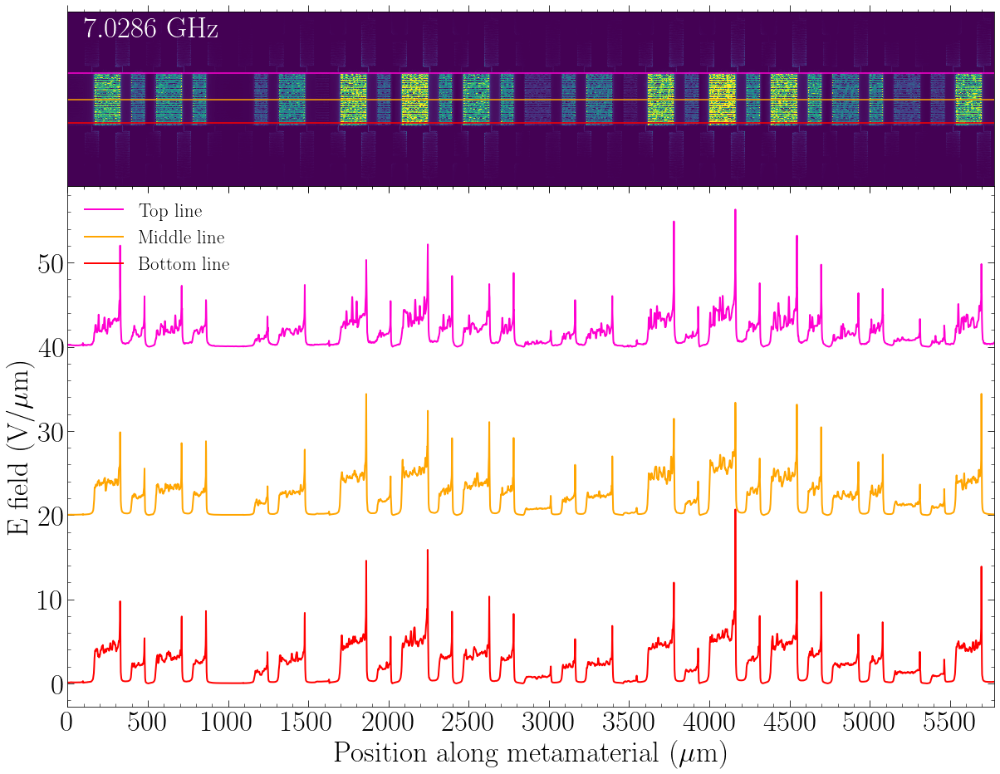

In [256]:
data12_efield_top_40 = loadtxt(r'221015_1D_efield_m12_top_Cc40.txt')
data12_efield_mid_40 = loadtxt(r'221015_1D_efield_m12_mid_Cc40.txt')
data12_efield_bot_40 = loadtxt(r'221015_1D_efield_m12_bot_Cc40.txt')

x_list2 = data1_efield_top_40[:,0] - data1_efield_top_40[:,0][0] # Same for every data

offset = 20

y_list_efield_top_40 = data12_efield_top_40[:,1]/(1e6) + 2 * offset
y_list_efield_mid_40 = data12_efield_mid_40[:,1]/(1e6) + 1 * offset
y_list_efield_bot_40 = data12_efield_bot_40[:,1]/(1e6) 

cline1 = '#ff00d1'
cline2 = 'orange'
cline3 = 'red'

fig = plt.figure(figsize=(20, 15))

gs = fig.add_gridspec(2, 1, height_ratios=(1, 3),
                      top=0.9, 
                      wspace=0.05, hspace=0)

axes2=fig.add_subplot(gs[1,0])                  # First row, second column
axes1=fig.add_subplot(gs[0,0], sharex = axes2)  # First row, first column


nrm = mpl.colors.Normalize(0, 6)

axes1.pcolormesh(x_list, y_list, z_list,
                cmap=cm.viridis, norm=nrm, shading='auto')

#axes.set_xlim(-3151.38, 2626.66)

axes1.axhline(y=251.52, color=cline1, linestyle='-', lw=1.5)
axes1.axhline(y=131.52, color=cline2, linestyle='-', lw=1.5)
axes1.axhline(y=23.52, color=cline3, linestyle='-', lw=1.5)

axes1.set_xlim(0, 5778.04)
axes1.set_ylim(-262.98, 532.02)
#axes1.set_xlabel(r'Position along metamaterial ($\mu$m)', rotation=0, fontsize=30)
#axes1.set_ylabel(r'$y$', rotation=90, fontsize=30)
axes1.tick_params(axis='both', which='major', length = 8, direction='out', labelsize=30, labelbottom=False)
axes1.tick_params(axis='both', which='minor', length = 3, direction='out', labelsize=30, labelbottom=False)
#axes1.xaxis.set_ticks(arange(0, 6000, 500))
axes1.xaxis.set_ticks_position('both')
axes1.text(100, 420, r"$7.0286$ GHz", color='white', fontsize=35)
#axes.text(-450, 8, r"$n_2 = 0$", color='white', fontsize=25)

axes1.get_yaxis().set_visible(False)
axes1.xaxis.set_minor_locator(AutoMinorLocator())

axes2.plot(x_list2, y_list_efield_top_40, color=cline1,
          linestyle='-', label=r'Top line', lw=2.0)

axes2.plot(x_list2, y_list_efield_mid_40, color=cline2,
          linestyle='-', label=r'Middle line', lw=2.0)

axes2.plot(x_list2, y_list_efield_bot_40, color=cline3,
          linestyle='-', label=r'Bottom line', lw=2.0)

          
axes2.set_xlabel(r'Position along metamaterial ($\mu$m)', rotation=0, fontsize=35)
axes2.set_ylabel(
    r'E field (V/$\mu$m)', rotation=90, fontsize=35)

axes2.tick_params(axis='both', which='major', length = 8, direction='in', labelsize=35)
axes2.tick_params(axis='both', which='minor', length = 4, direction='in', labelsize=35)
#axes.yaxis.tick_right()
axes2.xaxis.set_ticks_position('both')
axes2.yaxis.set_ticks_position('both')
axes2.legend(loc=2, fontsize=23, frameon=False)

axes2.set_xlim(0, 5778.04)
#axes.set_ylim(-140, 0)

#start, end = axes.get_ylim()
axes2.xaxis.set_ticks(arange(0, 6000, 500))
#axes.yaxis.set_ticks(arange(start, end+1, 20))

axes2.xaxis.set_minor_locator(AutoMinorLocator())
axes2.yaxis.set_minor_locator(AutoMinorLocator())

#axes.text(-900, 0.14, r"$n_2 = 1$", color='red', fontsize=25, rotation=-45)
#axes.text(-410, 0.27, r"$n_2 = 0$", color='red', fontsize=25, rotation=-45)

plt.margins(x=0.01, y=0.01)
#plt.tight_layout()
#plt.savefig('a1_ss_2d_02.pdf')
plt.show()

### (A.2.13) Mode 13 (7.1176 GHz)

In [14]:
# Data imports from 'Export\3d\'
data13_40 = loadtxt(r'220923_SUPERLATTICE_5_Cc40\Export\3d\e-field (f=7.1176) [1].txt')  # This may take a few minutes due to size of the CST data (Approx. 7 minutes).

# The file is in ASCII format:
# Columns order:     0) x (um)       1) y (um)      2) z (um)      3) ExRe (V/m)        4) ExIm (V/m)       5) EyRe (V/m)       6) EyIm (V/m)       7) EzRe (V/m)       8) EzIm (V/m)

In [16]:
# Import position columns
data_x = data13_40[:,0]
data_y = data13_40[:,1]
# Import field co6umn
data_z = abs(data13_40[:,7])/(1e6)

In [17]:
# Get X list
x_list = []
x0_meta = -3151.38 # metamaterial starts at this position
xf_meta =  2626.66 # metamaterial ends at this position
x_list.append(data_x[0] - x0_meta)
for i in range(1,len(data_x)):
    if data_x[i] != data_x[0]:
        x_list.append(data_x[i] - x0_meta)
    else:
        break

# Get Y list
y_list = []
y0_meta = -262.98 # metamaterial starts at this position
yf_meta =  532.02 # metamaterial ends at this position
y_list.append(data_y[0])
value =  data_y[0]
for i in range(1,len(data_y)):
    if data_y[i] != value:
        y_list.append(data_y[i])
        value = data_y[i]
        
# Get Z list
z_list = []
for j in range(len(y_list)):
    aux = []
    for i in range(len(x_list)):
        aux.append(data_z[i+len(x_list)*j])
    z_list.append(aux)

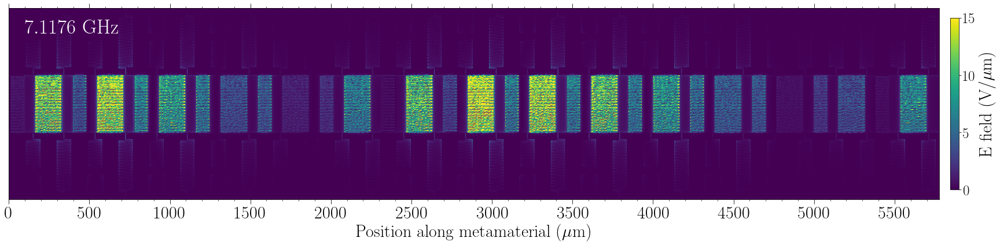

In [86]:
fig, axes = plt.subplots(1, 1, figsize=(27, 6))
nrm = mpl.colors.Normalize(0, 15)

axes.pcolormesh(x_list, y_list, z_list,
                cmap=cm.viridis, norm=nrm, shading='auto')

#axes.set_xlim(-3151.38, 2626.66)
axes.set_xlim(0, 5778.04)
axes.set_ylim(-262.98, 532.02)
axes.set_xlabel(r'Position along metamaterial ($\mu$m)', rotation=0, fontsize=30)
axes.set_ylabel(r'$y$', rotation=90, fontsize=30)
axes.tick_params(axis='both', which='major', length = 8, direction='out', labelsize=30)
axes.tick_params(axis='both', which='minor', length = 3, direction='out', labelsize=30)
axes.xaxis.set_ticks(arange(0, 6000, 500))
axes.xaxis.set_ticks_position('both')
axes.text(100, 430, r"$7.1176$ GHz", color='white', fontsize=35)
#axes.text(-450, 8, r"$n_2 = 0$", color='white', fontsize=25)

axes.get_yaxis().set_visible(False)
axes.xaxis.set_minor_locator(AutoMinorLocator())

plt.pcolormesh(x_list, y_list, z_list,
               cmap=cm.viridis, norm=nrm, shading='auto')
cbar = plt.colorbar(pad = 0.01, shrink = 0.9)
cbar.ax.tick_params(labelsize=25)
cbar.ax.set_ylabel(
    r'E field (V/$\mu$m)', rotation=90, fontsize=30)
plt.tight_layout()


#cp = axes.contour(x_list, y_list, A1_xy_list)
#axes.clabel(cp, inline=True,
 #           fontsize=16)

plt.show()

In [18]:
data13_efield_top_40 = loadtxt(r'221015_1D_efield_m13_top_Cc40.txt')
data13_efield_mid_40 = loadtxt(r'221015_1D_efield_m13_mid_Cc40.txt')
data13_efield_bot_40 = loadtxt(r'221015_1D_efield_m13_bot_Cc40.txt')

x_list2 = data1_efield_top_40[:,0] - data1_efield_top_40[:,0][0] # Same for every data

offset = 40

y_list_efield_top_40 = data13_efield_top_40[:,1]/(1e6) + 2 * offset
y_list_efield_mid_40 = data13_efield_mid_40[:,1]/(1e6) + 1 * offset
y_list_efield_bot_40 = data13_efield_bot_40[:,1]/(1e6) 

cline1 = '#ff00d1'
cline2 = 'orange'
cline3 = 'red'

fig = plt.figure(figsize=(20, 15))

gs = fig.add_gridspec(2, 1, height_ratios=(1, 3),
                      top=0.9, 
                      wspace=0.05, hspace=0)

axes2=fig.add_subplot(gs[1,0])                  # First row, second column
axes1=fig.add_subplot(gs[0,0], sharex = axes2)  # First row, first column


nrm = mpl.colors.Normalize(0, 15)

axes1.pcolormesh(x_list, y_list, z_list,
                cmap=cm.viridis, norm=nrm, shading='auto')

#axes.set_xlim(-3151.38, 2626.66)

axes1.axhline(y=251.52, color=cline1, linestyle='-', lw=1.5)
axes1.axhline(y=131.52, color=cline2, linestyle='-', lw=1.5)
axes1.axhline(y=23.52, color=cline3, linestyle='-', lw=1.5)

axes1.set_xlim(0, 5778.04)
axes1.set_ylim(-262.98, 532.02)
#axes1.set_xlabel(r'Position along metamaterial ($\mu$m)', rotation=0, fontsize=30)
#axes1.set_ylabel(r'$y$', rotation=90, fontsize=30)
axes1.tick_params(axis='both', which='major', length = 8, direction='out', labelsize=30, labelbottom=False)
axes1.tick_params(axis='both', which='minor', length = 3, direction='out', labelsize=30, labelbottom=False)
#axes1.xaxis.set_ticks(arange(0, 6000, 500))
axes1.xaxis.set_ticks_position('both')
axes1.text(100, 420, r"$7.1176$ GHz", color='white', fontsize=35)
#axes.text(-450, 8, r"$n_2 = 0$", color='white', fontsize=25)

axes1.get_yaxis().set_visible(False)
axes1.xaxis.set_minor_locator(AutoMinorLocator())

axes2.plot(x_list2, y_list_efield_top_40, color=cline1,
          linestyle='-', label=r'Top line', lw=2.0)

axes2.plot(x_list2, y_list_efield_mid_40, color=cline2,
          linestyle='-', label=r'Middle line', lw=2.0)

axes2.plot(x_list2, y_list_efield_bot_40, color=cline3,
          linestyle='-', label=r'Bottom line', lw=2.0)

          
axes2.set_xlabel(r'Position along metamaterial ($\mu$m)', rotation=0, fontsize=35)
axes2.set_ylabel(
    r'E field (V/$\mu$m)', rotation=90, fontsize=35)

axes2.tick_params(axis='both', which='major', length = 8, direction='in', labelsize=35)
axes2.tick_params(axis='both', which='minor', length = 4, direction='in', labelsize=35)
#axes.yaxis.tick_right()
axes2.xaxis.set_ticks_position('both')
axes2.yaxis.set_ticks_position('both')
#axes2.legend(loc=2, fontsize=23, frameon=False)

axes2.set_xlim(0, 5778.04)
#axes.set_ylim(-140, 0)

#start, end = axes.get_ylim()
axes2.xaxis.set_ticks(arange(0, 6000, 500))
#axes.yaxis.set_ticks(arange(start, end+1, 20))

axes2.xaxis.set_minor_locator(AutoMinorLocator())
axes2.yaxis.set_minor_locator(AutoMinorLocator())

#axes.text(-900, 0.14, r"$n_2 = 1$", color='red', fontsize=25, rotation=-45)
#axes.text(-410, 0.27, r"$n_2 = 0$", color='red', fontsize=25, rotation=-45)

plt.margins(x=0.01, y=0.01)
#plt.tight_layout()
#plt.savefig('a1_ss_2d_02.pdf')
plt.show()

NameError: name 'data1_efield_top_40' is not defined

### (A.2.14) Mode 14 (7.1657 GHz)

In [15]:
# Data imports from 'Export\3d\'
data14_40 = loadtxt(r'220923_SUPERLATTICE_5_Cc40\Export\3d\e-field (f=7.1657) [1].txt')  # This may take a few minutes due to size of the CST data (Approx. 7 minutes).

# The file is in ASCII format:
# Columns order:     0) x (um)       1) y (um)      2) z (um)      3) ExRe (V/m)        4) ExIm (V/m)       5) EyRe (V/m)       6) EyIm (V/m)       7) EzRe (V/m)       8) EzIm (V/m)

In [261]:
# Import position columns
data_x = data14_40[:,0]
data_y = data14_40[:,1]
# Import field co6umn
data_z = abs(data14_40[:,7])/(1e6)

In [262]:
# Get X list
x_list = []
x0_meta = -3151.38 # metamaterial starts at this position
xf_meta =  2626.66 # metamaterial ends at this position
x_list.append(data_x[0] - x0_meta)
for i in range(1,len(data_x)):
    if data_x[i] != data_x[0]:
        x_list.append(data_x[i] - x0_meta)
    else:
        break

# Get Y list
y_list = []
y0_meta = -262.98 # metamaterial starts at this position
yf_meta =  532.02 # metamaterial ends at this position
y_list.append(data_y[0])
value =  data_y[0]
for i in range(1,len(data_y)):
    if data_y[i] != value:
        y_list.append(data_y[i])
        value = data_y[i]
        
# Get Z list
z_list = []
for j in range(len(y_list)):
    aux = []
    for i in range(len(x_list)):
        aux.append(data_z[i+len(x_list)*j])
    z_list.append(aux)

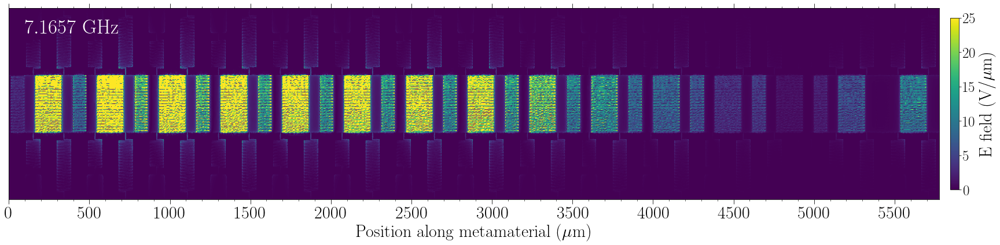

In [89]:
fig, axes = plt.subplots(1, 1, figsize=(27, 6))
nrm = mpl.colors.Normalize(0, 25)

axes.pcolormesh(x_list, y_list, z_list,
                cmap=cm.viridis, norm=nrm, shading='auto')

#axes.set_xlim(-3151.38, 2626.66)
axes.set_xlim(0, 5778.04)
axes.set_ylim(-262.98, 532.02)
axes.set_xlabel(r'Position along metamaterial ($\mu$m)', rotation=0, fontsize=30)
axes.set_ylabel(r'$y$', rotation=90, fontsize=30)
axes.tick_params(axis='both', which='major', length = 8, direction='out', labelsize=30)
axes.tick_params(axis='both', which='minor', length = 3, direction='out', labelsize=30)
axes.xaxis.set_ticks(arange(0, 6000, 500))
axes.xaxis.set_ticks_position('both')
axes.text(100, 430, r"$7.1657$ GHz", color='white', fontsize=35)
#axes.text(-450, 8, r"$n_2 = 0$", color='white', fontsize=25)

axes.get_yaxis().set_visible(False)
axes.xaxis.set_minor_locator(AutoMinorLocator())

plt.pcolormesh(x_list, y_list, z_list,
               cmap=cm.viridis, norm=nrm, shading='auto')
cbar = plt.colorbar(pad = 0.01, shrink = 0.9)
cbar.ax.tick_params(labelsize=25)
cbar.ax.set_ylabel(
    r'E field (V/$\mu$m)', rotation=90, fontsize=30)
plt.tight_layout()


#cp = axes.contour(x_list, y_list, A1_xy_list)
#axes.clabel(cp, inline=True,
 #           fontsize=16)

plt.show()

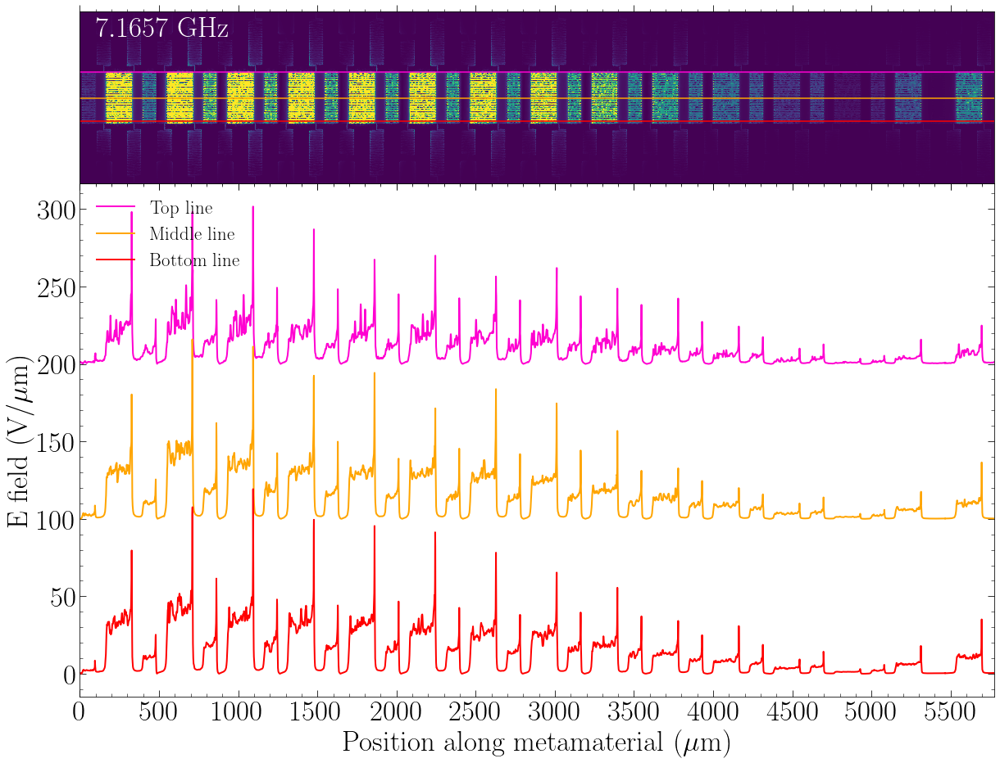

In [264]:
data14_efield_top_40 = loadtxt(r'221015_1D_efield_m14_top_Cc40.txt')
data14_efield_mid_40 = loadtxt(r'221015_1D_efield_m14_mid_Cc40.txt')
data14_efield_bot_40 = loadtxt(r'221015_1D_efield_m14_bot_Cc40.txt')

x_list2 = data1_efield_top_40[:,0] - data1_efield_top_40[:,0][0] # Same for every data

offset = 100

y_list_efield_top_40 = data14_efield_top_40[:,1]/(1e6) + 2 * offset
y_list_efield_mid_40 = data14_efield_mid_40[:,1]/(1e6) + 1 * offset
y_list_efield_bot_40 = data14_efield_bot_40[:,1]/(1e6) 

cline1 = '#ff00d1'
cline2 = 'orange'
cline3 = 'red'

fig = plt.figure(figsize=(20, 15))

gs = fig.add_gridspec(2, 1, height_ratios=(1, 3),
                      top=0.9, 
                      wspace=0.05, hspace=0)

axes2=fig.add_subplot(gs[1,0])                  # First row, second column
axes1=fig.add_subplot(gs[0,0], sharex = axes2)  # First row, first column


nrm = mpl.colors.Normalize(0, 25)

axes1.pcolormesh(x_list, y_list, z_list,
                cmap=cm.viridis, norm=nrm, shading='auto')

#axes.set_xlim(-3151.38, 2626.66)

axes1.axhline(y=251.52, color=cline1, linestyle='-', lw=1.5)
axes1.axhline(y=131.52, color=cline2, linestyle='-', lw=1.5)
axes1.axhline(y=23.52, color=cline3, linestyle='-', lw=1.5)

axes1.set_xlim(0, 5778.04)
axes1.set_ylim(-262.98, 532.02)
#axes1.set_xlabel(r'Position along metamaterial ($\mu$m)', rotation=0, fontsize=30)
#axes1.set_ylabel(r'$y$', rotation=90, fontsize=30)
axes1.tick_params(axis='both', which='major', length = 8, direction='out', labelsize=30, labelbottom=False)
axes1.tick_params(axis='both', which='minor', length = 3, direction='out', labelsize=30, labelbottom=False)
#axes1.xaxis.set_ticks(arange(0, 6000, 500))
axes1.xaxis.set_ticks_position('both')
axes1.text(100, 420, r"$7.1657$ GHz", color='white', fontsize=35)
#axes.text(-450, 8, r"$n_2 = 0$", color='white', fontsize=25)

axes1.get_yaxis().set_visible(False)
axes1.xaxis.set_minor_locator(AutoMinorLocator())

axes2.plot(x_list2, y_list_efield_top_40, color=cline1,
          linestyle='-', label=r'Top line', lw=2.0)

axes2.plot(x_list2, y_list_efield_mid_40, color=cline2,
          linestyle='-', label=r'Middle line', lw=2.0)

axes2.plot(x_list2, y_list_efield_bot_40, color=cline3,
          linestyle='-', label=r'Bottom line', lw=2.0)

          
axes2.set_xlabel(r'Position along metamaterial ($\mu$m)', rotation=0, fontsize=35)
axes2.set_ylabel(
    r'E field (V/$\mu$m)', rotation=90, fontsize=35)

axes2.tick_params(axis='both', which='major', length = 8, direction='in', labelsize=35)
axes2.tick_params(axis='both', which='minor', length = 4, direction='in', labelsize=35)
#axes.yaxis.tick_right()
axes2.xaxis.set_ticks_position('both')
axes2.yaxis.set_ticks_position('both')
axes2.legend(loc=2, fontsize=23, frameon=False)

axes2.set_xlim(0, 5778.04)
#axes.set_ylim(-140, 0)

#start, end = axes.get_ylim()
axes2.xaxis.set_ticks(arange(0, 6000, 500))
#axes.yaxis.set_ticks(arange(start, end+1, 20))

axes2.xaxis.set_minor_locator(AutoMinorLocator())
axes2.yaxis.set_minor_locator(AutoMinorLocator())

#axes.text(-900, 0.14, r"$n_2 = 1$", color='red', fontsize=25, rotation=-45)
#axes.text(-410, 0.27, r"$n_2 = 0$", color='red', fontsize=25, rotation=-45)

plt.margins(x=0.01, y=0.01)
#plt.tight_layout()
#plt.savefig('a1_ss_2d_02.pdf')
plt.show()

# (B) C_c = 23.67 fF

In [90]:
data_s21_23 = loadtxt(r'220927_S21_Cc23.txt')

In [91]:
x_list_s2123 = data_s21_23[:,0]
y_list_s2123 = data_s21_23[:,1]

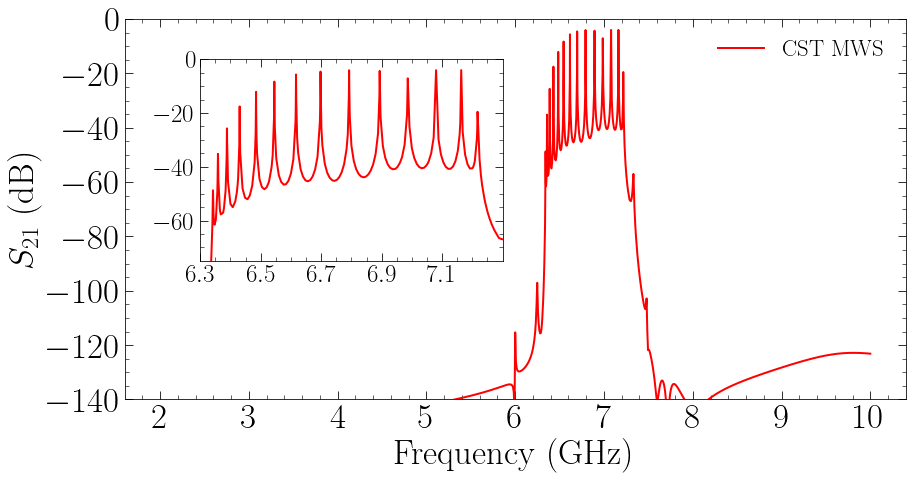

In [96]:
fig, axes = plt.subplots(1, 1, figsize=(14, 7))

axes.plot(x_list_s2123, y_list_s2123, color='red',
          linestyle='-', label=r'CST MWS', lw=2.0)

axes.set_xlabel(r'Frequency (GHz)', rotation=0, fontsize=35)
axes.set_ylabel(
    r'$S_{21}$ (dB)', rotation=90, fontsize=35)

axes.tick_params(axis='both', which='major', length = 8, direction='in', labelsize=35)
axes.tick_params(axis='both', which='minor', length = 4, direction='in', labelsize=35)
#axes.yaxis.tick_right()
axes.xaxis.set_ticks_position('both')
axes.yaxis.set_ticks_position('both')
axes.legend(loc=2, fontsize=23, frameon=False)

#axes.set_xlim(0, 5778.04)
axes.set_ylim(-140, 0)

start, end = axes.get_ylim()
axes.xaxis.set_ticks(arange(2, 10+1, 1))
axes.yaxis.set_ticks(arange(start, end+1, 20))

axes.xaxis.set_minor_locator(AutoMinorLocator())
axes.yaxis.set_minor_locator(AutoMinorLocator())

#axes.text(-900, 0.14, r"$n_2 = 1$", color='red', fontsize=25, rotation=-45)
#axes.text(-410, 0.27, r"$n_2 = 0$", color='red', fontsize=25, rotation=-45)

left, bottom, width, height = [0.2, 0.4, 0.3, 0.4]
axes2 = fig.add_axes([left, bottom, width, height])
axes2.plot(x_list_s2123, y_list_s2123, color='red',
          linestyle='-', label=r'CST MWS', lw=2.0)
axes2.set_xlim(6.3, 7.3)
axes2.set_ylim(-75, 0)
axes2.tick_params(axis='both', which='major', length = 8, direction='in', labelsize=25)
axes2.tick_params(axis='both', which='minor', length = 4, direction='in', labelsize=25)


axes2.xaxis.set_ticks(arange(6.3, 7.3, 0.2))
axes2.xaxis.set_minor_locator(AutoMinorLocator())
axes2.yaxis.set_minor_locator(AutoMinorLocator())
axes2.xaxis.set_ticks_position('both')
axes2.yaxis.set_ticks_position('both')

axes.legend(loc=1, fontsize=23, frameon=False)

plt.margins(x=0.01, y=0.01)
#plt.tight_layout()
#plt.savefig('a1_ss_2d_02.pdf')
plt.show()

In [73]:
import scipy as scipy
from scipy import optimize
#from matplotlib.ticker import AutoMinorLocator
from matplotlib import gridspec
import matplotlib.ticker as ticker

In [69]:
x_array = linspace(1,300,250)

amp1 = 50
cen1 = 100
wid1 = 5

amp2 = 100
cen2 = 150
wid2 = 10

amp3 = 50
cen3 = 200
wid3 = 5

y_array_3lorentz = (amp1*wid1**2/((x_array-cen1)**2+wid1**2)) + \
                    (amp2*wid2**2/((x_array-cen2)**2+wid2**2)) +\
                     (amp3*wid3**2/((x_array-cen3)**2+wid3**2))

# creating some noise to add the the y-axis data
y_noise_3lorentz = (((random.ranf(250))))*5
y_array_3lorentz += y_noise_3lorentz



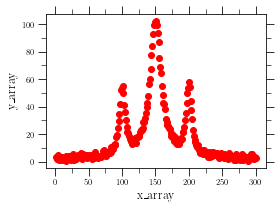

In [71]:
fig = plt.figure(figsize=(4,3))
gs = gridspec.GridSpec(1,1)
ax1 = fig.add_subplot(gs[0])

ax1.plot(x_array, y_array_3lorentz, "ro")

#ax1.set_xlim(-5,105)
#ax1.set_ylim(-0.5,5)

ax1.set_xlabel("x_array",family="serif",  fontsize=12)
ax1.set_ylabel("y_array",family="serif",  fontsize=12)

ax1.xaxis.set_major_locator(ticker.MultipleLocator(50))
#ax1.yaxis.set_major_locator(ticker.MultipleLocator(50))

ax1.xaxis.set_minor_locator(AutoMinorLocator(2))
ax1.yaxis.set_minor_locator(AutoMinorLocator(2))

ax1.tick_params(axis='both',which='major', direction="out", top="on", right="on", bottom="on", length=8, labelsize=8)
ax1.tick_params(axis='both',which='minor', direction="out", top="on", right="on", bottom="on", length=5, labelsize=8)

fig.tight_layout()
fig.savefig("raw_3Lorentz.png", format="png",dpi=1000)

In [67]:
def _1Lorentzian(x, amp, cen, wid):
    return amp*wid**2/((x-cen)**2+wid**2)

def _3Lorentzian(x, amp1, cen1, wid1, amp2,cen2,wid2, amp3,cen3,wid3):
    return (amp1*wid1**2/((x-cen1)**2+wid1**2)) +\
            (amp2*wid2**2/((x-cen2)**2+wid2**2)) +\
                (amp3*wid3**2/((x-cen3)**2+wid3**2))



In [75]:
popt_3lorentz, pcov_3lorentz = scipy.optimize.curve_fit(_3Lorentzian, x_array, y_array_3lorentz, p0=[amp1, cen1, wid1, \
                                                                                    amp2, cen2, wid2, amp3, cen3, wid3])

perr_3lorentz = sqrt(diag(pcov_3lorentz))

pars_1 = popt_3lorentz[0:3]
pars_2 = popt_3lorentz[3:6]
pars_3 = popt_3lorentz[6:9]
lorentz_peak_1 = _1Lorentzian(x_array, *pars_1)
lorentz_peak_2 = _1Lorentzian(x_array, *pars_2)
lorentz_peak_3 = _1Lorentzian(x_array, *pars_3)



In [79]:
# this cell prints the fitting parameters with their errors
print("-------------Peak 1-------------")
print("amplitude = %0.2f (+/-) %0.2f" % (pars_1[0], perr_3lorentz[0]))
print("center = %0.2f (+/-) %0.2f" % (pars_1[1], perr_3lorentz[1]))
print("area = %0.2f" % trapz(lorentz_peak_1))
print("width = %0.2f (+/-) %0.2f" % (pars_1[2], perr_3lorentz[2]))
print("--------------------------------")
print("-------------Peak 2-------------")
print("amplitude = %0.2f (+/-) %0.2f" % (pars_2[0], perr_3lorentz[3]))
print("center = %0.2f (+/-) %0.2f" % (pars_2[1], perr_3lorentz[4]))
print("width = %0.2f (+/-) %0.2f" % (pars_2[2], perr_3lorentz[5]))
print("area = %0.2f" % trapz(lorentz_peak_2))
print("--------------------------------")
print("-------------Peak 3-------------")
print("amplitude = %0.2f (+/-) %0.2f" % (pars_3[0], perr_3lorentz[6]))
print("center = %0.2f (+/-) %0.2f" % (pars_3[1], perr_3lorentz[7]))
print("width = %0.2f (+/-) %0.2f" % (pars_3[2], perr_3lorentz[8]))
print("area = %0.2f" % trapz(lorentz_peak_3))
print("--------------------------------")

-------------Peak 1-------------
amplitude = 49.82 (+/-) 1.11
center = 99.95 (+/-) 0.13
area = 711.93
width = 5.61 (+/-) 0.18
--------------------------------
-------------Peak 2-------------
amplitude = 101.18 (+/-) 0.82
center = 150.01 (+/-) 0.08
width = 10.48 (+/-) 0.13
area = 2649.48
--------------------------------
-------------Peak 3-------------
amplitude = 51.52 (+/-) 1.13
center = 200.00 (+/-) 0.12
width = 5.46 (+/-) 0.17
area = 716.46
--------------------------------


In [80]:
residual_3lorentz = y_array_3lorentz - (_3Lorentzian(x_array, *popt_3lorentz))

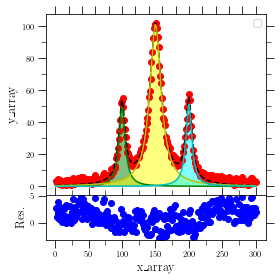

In [81]:
fig = plt.figure(figsize=(4,4))
gs = gridspec.GridSpec(2,1, height_ratios=[1,0.25])
ax1 = fig.add_subplot(gs[0])
ax2 = fig.add_subplot(gs[1])
gs.update(hspace=0) 

ax1.plot(x_array, y_array_3lorentz, "ro")
ax1.plot(x_array, _3Lorentzian(x_array, *popt_3lorentz), 'k--')#,\
         #label="y= %0.2f$e^{%0.2fx}$ + %0.2f" % (popt_exponential[0], popt_exponential[1], popt_exponential[2]))

# peak 1
ax1.plot(x_array, lorentz_peak_1, "g")
ax1.fill_between(x_array, lorentz_peak_1.min(), lorentz_peak_1, facecolor="green", alpha=0.5)
  
# peak 2
ax1.plot(x_array, lorentz_peak_2, "y")
ax1.fill_between(x_array, lorentz_peak_2.min(), lorentz_peak_2, facecolor="yellow", alpha=0.5)  

# peak 3
ax1.plot(x_array, lorentz_peak_3, "c")
ax1.fill_between(x_array, lorentz_peak_3.min(), lorentz_peak_3, facecolor="cyan", alpha=0.5) 

# residual
ax2.plot(x_array, residual_3lorentz, "bo")
    
#ax1.set_xlim(-5,105)
#ax1.set_ylim(-0.5,8)

#ax2.set_xlim(-5,105)
#ax2.set_ylim(-0.5,0.75)

ax2.set_xlabel("x_array",family="serif",  fontsize=12)
ax1.set_ylabel("y_array",family="serif",  fontsize=12)
ax2.set_ylabel("Res.",family="serif",  fontsize=12)

ax1.legend(loc="best")

ax1.xaxis.set_major_locator(ticker.MultipleLocator(20))
#ax1.yaxis.set_major_locator(ticker.MultipleLocator(50))

ax2.xaxis.set_minor_locator(AutoMinorLocator(2))
ax1.yaxis.set_minor_locator(AutoMinorLocator(2))

ax1.xaxis.set_major_formatter(plt.NullFormatter())

ax1.tick_params(axis='x',which='major', direction="out", top="on", right="on", bottom="off", length=8, labelsize=8)
ax1.tick_params(axis='x',which='minor', direction="out", top="on", right="on", bottom="off", length=5, labelsize=8)
ax1.tick_params(axis='y',which='major', direction="out", top="on", right="on", bottom="off", length=8, labelsize=8)
ax1.tick_params(axis='y',which='minor', direction="out", top="on", right="on", bottom="on", length=5, labelsize=8)

ax2.tick_params(axis='x',which='major', direction="out", top="off", right="on", bottom="on", length=8, labelsize=8)
ax2.tick_params(axis='x',which='minor', direction="out", top="off", right="on", bottom="on", length=5, labelsize=8)
ax2.tick_params(axis='y',which='major', direction="out", top="off", right="on", bottom="on", length=8, labelsize=8)
ax2.tick_params(axis='y',which='minor', direction="out", top="off", right="on", bottom="on", length=5, labelsize=8)

fig.tight_layout()
fig.savefig("fit3Lorentzian_peaks_resid.png", format="png",dpi=1000)